In [160]:
%reload_ext autoreload
%autoreload 2
import pandas as pd
import os
import torch
from torch.utils.data import ConcatDataset,Dataset, DataLoader, random_split
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from analysis import Metrics, epoch_metrics, cap_distance, error_calc, calculate_snr
import numpy as np
import copy
import matplotlib.pyplot as plt
from scalers import inverse_minmax_norm, scaler_y_charge_mm_B0005, scaler_y_charge_mm_B0006, scaler_y_charge_mm_B0007, scaler_y_dis_mm_B0005, scaler_y_dis_mm_B0006, scaler_y_dis_mm_B0007, scaler_y_comb_mm_B0005, scaler_y_comb_mm_B0006, scaler_y_comb_mm_B0007, xData_comb_B0005, yData_comb_B0005, xData_comb_B0006, yData_comb_B0006, xData_comb_B0007, yData_comb_B0007, xData_B0005, yData_B0005, xData_B0006, yData_B0006, xData_B0007, yData_B0007, xData_dis_B0005, yData_dis_B0005, xData_dis_B0006, yData_dis_B0006, xData_dis_B0007, yData_dis_B0007
from scalers import inverse_standard_scaler, scaler_y_charge_std_B0005, scaler_y_charge_std_B0006, scaler_y_charge_std_B0007, scaler_y_dis_std_B0005, scaler_y_dis_std_B0006,scaler_y_dis_std_B0007,  scaler_y_comb_std_B0005, scaler_y_comb_std_B0006, scaler_y_comb_std_B0007, xData_std_B0005, yData_std_B0005, xData_std_B0006, yData_std_B0006, xData_std_B0007, yData_std_B0007, xData_dis_std_B0005, yData_dis_std_B0005, xData_dis_std_B0006, yData_dis_std_B0006, xData_dis_std_B0007, yData_dis_std_B0007, xData_comb_std_B0005, yData_comb_std_B0005, xData_comb_std_B0006, yData_comb_std_B0006, xData_comb_std_B0007, yData_comb_std_B0007


Load CSV Files into Pandas DataFrames and convert to numpy arrays.

df > numpy > tensor

In [161]:
def load_and_transform(file_path):
    """
    Loads a CSV file and transforms it into a PyTorch tensor.
    
    Parameters:
    file_path (str): Path to the CSV file.
    
    Returns:
    torch.Tensor: Data from the CSV file as a PyTorch tensor.
    """
    data = pd.read_csv(file_path, header=None).to_numpy()
    tensor = torch.tensor(data, dtype=torch.float32)
    return tensor


In [162]:
# Directory where the split data files are saved
data_dir = '3. Split data'

# List of file prefixes for each dataset
datasets = [
    'B0005_charge_mm', 'B0005_charge_std', 'B0005_charge_rob',
    'B0005_discharge_mm', 'B0005_discharge_std', 'B0005_discharge_rob',
    'B0005_combined_mm', 'B0005_combined_std', 'B0005_combined_rob',
    'B0006_charge_mm', 'B0006_charge_std', 'B0006_charge_rob',
    'B0006_discharge_mm', 'B0006_discharge_std', 'B0006_discharge_rob',
    'B0006_combined_mm', 'B0006_combined_std', 'B0006_combined_rob',
    'B0007_charge_mm', 'B0007_charge_std', 'B0007_charge_rob',
    'B0007_discharge_mm', 'B0007_discharge_std', 'B0007_discharge_rob',
    'B0007_combined_mm', 'B0007_combined_std', 'B0007_combined_rob',
    'B0018_charge_mm', 'B0018_charge_std', 'B0018_charge_rob',
    'B0018_discharge_mm', 'B0018_discharge_std', 'B0018_discharge_rob',
    'B0018_combined_mm', 'B0018_combined_std', 'B0018_combined_rob'
]

# Initialize dictionaries to hold tensors
X_train_tensors = {}
X_test_tensors = {}
y_train_tensors = {}
y_test_tensors = {}

# Load and transform each dataset
for dataset in datasets:
    X_train_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_X_train.csv'))
    X_test_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_X_test.csv'))
    y_train_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_y_train.csv'))
    y_test_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_y_test.csv'))

# Example: Accessing a specific dataset tensor
print(X_train_tensors['B0005_charge_mm'])
print(y_train_tensors['B0005_charge_mm'])


tensor([[0.8562, 0.8739, 0.8803,  ..., 0.4106, 0.4104, 0.4102],
        [0.0377, 0.0381, 0.0397,  ..., 0.7789, 0.7781, 0.7768],
        [0.0400, 0.0415, 0.0410,  ..., 0.8154, 0.8139, 0.8128],
        ...,
        [0.7936, 0.8742, 0.7940,  ..., 0.7331, 0.7335, 0.7338],
        [0.7946, 0.8752, 0.7950,  ..., 0.7507, 0.7512, 0.7516],
        [0.7978, 0.8785, 0.7984,  ..., 0.6885, 0.6890, 0.6891]])
tensor([[1.0000],
        [0.9821],
        [0.9629],
        [0.9627],
        [0.9616],
        [0.9634],
        [0.9625],
        [0.9460],
        [0.9443],
        [0.9440],
        [0.9440],
        [0.9257],
        [0.9249],
        [0.9244],
        [0.9053],
        [0.9044],
        [0.9053],
        [0.9061],
        [0.9056],
        [0.9834],
        [0.9841],
        [0.9643],
        [0.9460],
        [0.9449],
        [0.9457],
        [0.9254],
        [0.9267],
        [0.9253],
        [0.9056],
        [0.9079],
        [0.9918],
        [0.9547],
        [0.9357],
        

Data Preperation for Training

Create a Custom PyTorch Dataset and DataLoader.

Data Loader Class is used to loaddata in batches.

Tensor is reshaped so that each input row of 1x30 is transformed to a matrix of 3x10

In [163]:
data_length = 25 # you'll need to update its value in "2. Data Preprocessing.ipynb"
class BatteryDataset(Dataset):
    def __init__(self, x_data, y_data):
        if isinstance(x_data, np.ndarray):
            self.x_data = torch.tensor(x_data, dtype=torch.float32)
        else:
            self.x_data = x_data.clone().detach().float()
        
        if isinstance(y_data, np.ndarray):
            self.y_data = torch.tensor(y_data, dtype=torch.float32)
        else:
            self.y_data = y_data.clone().detach().float()
    
    def __len__(self):
        return len(self.x_data)
    
    def __getitem__(self, idx):
        x = self.x_data[idx].view(3, data_length)  # Reshape the tensor to 3x10
        y = self.y_data[idx]
        return x, y
    
class BatteryDataset_combined(Dataset):
    def __init__(self, x_data, y_data):
        if isinstance(x_data, np.ndarray):
            self.x_data = torch.tensor(x_data, dtype=torch.float32)
        else:
            self.x_data = x_data.clone().detach().float()
        
        if isinstance(y_data, np.ndarray):
            self.y_data = torch.tensor(y_data, dtype=torch.float32)
        else:
            self.y_data = y_data.clone().detach().float()
    
    def __len__(self):
        return len(self.x_data)
    
    def __getitem__(self, idx):
        x = self.x_data[idx].view(6, data_length)  # Reshape the tensor to 6x10
        y = self.y_data[idx]
        return x, y

Create Datasets

In [164]:
# Initialize dictionaries to hold dataset instances
train_datasets = {}
test_datasets = {}

# Instantiate BatteryDataset and BatteryDataset_combined for each dataset
for dataset in datasets:
    if 'combined' in dataset:
        train_datasets[dataset] = BatteryDataset_combined(X_train_tensors[dataset], y_train_tensors[dataset])
        test_datasets[dataset] = BatteryDataset_combined(X_test_tensors[dataset], y_test_tensors[dataset])
    else:
        train_datasets[dataset] = BatteryDataset(X_train_tensors[dataset], y_train_tensors[dataset])
        test_datasets[dataset] = BatteryDataset(X_test_tensors[dataset], y_test_tensors[dataset])

# Example: Accessing a specific dataset instance
print(train_datasets['B0005_charge_mm'])
print(test_datasets['B0005_charge_mm'])

Split Test Data into Testing and Validation Sets.

In [165]:
def split_test_data(test_dataset, scale=0.5):
    """
    Splits the test dataset into validation and test sets based on the provided scale,
    with the validation set being the first part of the dataset.

    Parameters:
    test_dataset (Dataset): The test dataset to be split.
    scale (float): The proportion of the test dataset to use for the test set.

    Returns:
    Dataset: The split validation dataset (first part).
    Dataset: The split test dataset (second part).
    """
    val_size = int(scale * len(test_dataset))
    test_size = len(test_dataset) - val_size
    
    # Split the dataset while preserving the order
    val_data = torch.utils.data.Subset(test_dataset, range(val_size))  # First part for validation
    test_data = torch.utils.data.Subset(test_dataset, range(val_size, len(test_dataset)))  # Second part for test
    
    return val_data, test_data

# Initialize dictionaries to hold test and validation datasets
test_val_datasets = {}

# Split test data into validation and test sets
for dataset in datasets:
    val_data, test_data = split_test_data(test_datasets[dataset])  # Order-preserving split, with validation first
    test_val_datasets[f'{dataset}_test'] = test_data
    test_val_datasets[f'{dataset}_val'] = val_data

# Example: Accessing a specific test and validation dataset
print(test_val_datasets['B0005_charge_mm_test'])
print(test_val_datasets['B0005_charge_mm_val'])



Create DataLoaders.

In [166]:
batch_size = 3
data_loaders = {}

for dataset in datasets:
    train_loader = DataLoader(train_datasets[dataset], batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_val_datasets[f'{dataset}_test'], batch_size=batch_size, shuffle=False)
    val_loader = DataLoader(test_val_datasets[f'{dataset}_val'], batch_size=batch_size, shuffle=False)
    
    # Combine train, validation, and test datasets
    combined_dataset = ConcatDataset([train_datasets[dataset], test_val_datasets[f'{dataset}_val'], test_val_datasets[f'{dataset}_test']])
    
    # Create a DataLoader for the combined dataset
    final_test_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=False)
    
    data_loaders[f'{dataset}_train_loader'] = train_loader
    data_loaders[f'{dataset}_test_loader'] = test_loader
    data_loaders[f'{dataset}_final_test_loader'] = final_test_loader  # includes train, validation, and test data
    data_loaders[f'{dataset}_val_loader'] = val_loader

# Example: Accessing a specific data loader
print(data_loaders['B0005_charge_mm_train_loader'])
print(data_loaders['B0005_charge_mm_test_loader'])
print(data_loaders['B0005_charge_mm_val_loader'])
print(data_loaders['B0005_charge_mm_final_test_loader'])


Rename data loaders

In [167]:
# Charging Data Loaders
B0005_charge_mm_train_loader = data_loaders['B0005_charge_mm_train_loader']
B0005_charge_mm_test_loader = data_loaders['B0005_charge_mm_test_loader']
B0005_charge_mm_val_loader = data_loaders['B0005_charge_mm_val_loader']
B0005_charge_std_train_loader = data_loaders['B0005_charge_std_train_loader']
B0005_charge_std_test_loader = data_loaders['B0005_charge_std_test_loader']
B0005_charge_std_val_loader = data_loaders['B0005_charge_std_val_loader']
B0005_charge_rob_train_loader = data_loaders['B0005_charge_rob_train_loader']
B0005_charge_rob_test_loader = data_loaders['B0005_charge_rob_test_loader']
B0005_charge_rob_val_loader = data_loaders['B0005_charge_rob_val_loader']

B0006_charge_mm_train_loader = data_loaders['B0006_charge_mm_train_loader']
B0006_charge_mm_test_loader = data_loaders['B0006_charge_mm_test_loader']
B0006_charge_mm_val_loader = data_loaders['B0006_charge_mm_val_loader']
B0006_charge_std_train_loader = data_loaders['B0006_charge_std_train_loader']
B0006_charge_std_test_loader = data_loaders['B0006_charge_std_test_loader']
B0006_charge_std_val_loader = data_loaders['B0006_charge_std_val_loader']
B0006_charge_rob_train_loader = data_loaders['B0006_charge_rob_train_loader']
B0006_charge_rob_test_loader = data_loaders['B0006_charge_rob_test_loader']
B0006_charge_rob_val_loader = data_loaders['B0006_charge_rob_val_loader']

B0007_charge_mm_train_loader = data_loaders['B0007_charge_mm_train_loader']
B0007_charge_mm_test_loader = data_loaders['B0007_charge_mm_test_loader']
B0007_charge_mm_val_loader = data_loaders['B0007_charge_mm_val_loader']
B0007_charge_std_train_loader = data_loaders['B0007_charge_std_train_loader']
B0007_charge_std_test_loader = data_loaders['B0007_charge_std_test_loader']
B0007_charge_std_val_loader = data_loaders['B0007_charge_std_val_loader']
B0007_charge_rob_train_loader = data_loaders['B0007_charge_rob_train_loader']
B0007_charge_rob_test_loader = data_loaders['B0007_charge_rob_test_loader']
B0007_charge_rob_val_loader = data_loaders['B0007_charge_rob_val_loader']

B0018_charge_mm_train_loader = data_loaders['B0018_charge_mm_train_loader']
B0018_charge_mm_test_loader = data_loaders['B0018_charge_mm_test_loader']
B0018_charge_mm_val_loader = data_loaders['B0018_charge_mm_val_loader']
B0018_charge_std_train_loader = data_loaders['B0018_charge_std_train_loader']
B0018_charge_std_test_loader = data_loaders['B0018_charge_std_test_loader']
B0018_charge_std_val_loader = data_loaders['B0018_charge_std_val_loader']
B0018_charge_rob_train_loader = data_loaders['B0018_charge_rob_train_loader']
B0018_charge_rob_test_loader = data_loaders['B0018_charge_rob_test_loader']
B0018_charge_rob_val_loader = data_loaders['B0018_charge_rob_val_loader']

# Discharging Data Loaders
B0005_discharge_mm_train_loader = data_loaders['B0005_discharge_mm_train_loader']
B0005_discharge_mm_test_loader = data_loaders['B0005_discharge_mm_test_loader']
B0005_discharge_mm_val_loader = data_loaders['B0005_discharge_mm_val_loader']
B0005_discharge_std_train_loader = data_loaders['B0005_discharge_std_train_loader']
B0005_discharge_std_test_loader = data_loaders['B0005_discharge_std_test_loader']
B0005_discharge_std_val_loader = data_loaders['B0005_discharge_std_val_loader']
B0005_discharge_rob_train_loader = data_loaders['B0005_discharge_rob_train_loader']
B0005_discharge_rob_test_loader = data_loaders['B0005_discharge_rob_test_loader']
B0005_discharge_rob_val_loader = data_loaders['B0005_discharge_rob_val_loader']

B0006_discharge_mm_train_loader = data_loaders['B0006_discharge_mm_train_loader']
B0006_discharge_mm_test_loader = data_loaders['B0006_discharge_mm_test_loader']
B0006_discharge_mm_val_loader = data_loaders['B0006_discharge_mm_val_loader']
B0006_discharge_std_train_loader = data_loaders['B0006_discharge_std_train_loader']
B0006_discharge_std_test_loader = data_loaders['B0006_discharge_std_test_loader']
B0006_discharge_std_val_loader = data_loaders['B0006_discharge_std_val_loader']
B0006_discharge_rob_train_loader = data_loaders['B0006_discharge_rob_train_loader']
B0006_discharge_rob_test_loader = data_loaders['B0006_discharge_rob_test_loader']
B0006_discharge_rob_val_loader = data_loaders['B0006_discharge_rob_val_loader']

B0007_discharge_mm_train_loader = data_loaders['B0007_discharge_mm_train_loader']
B0007_discharge_mm_test_loader = data_loaders['B0007_discharge_mm_test_loader']
B0007_discharge_mm_val_loader = data_loaders['B0007_discharge_mm_val_loader']
B0007_discharge_std_train_loader = data_loaders['B0007_discharge_std_train_loader']
B0007_discharge_std_test_loader = data_loaders['B0007_discharge_std_test_loader']
B0007_discharge_std_val_loader = data_loaders['B0007_discharge_std_val_loader']
B0007_discharge_rob_train_loader = data_loaders['B0007_discharge_rob_train_loader']
B0007_discharge_rob_test_loader = data_loaders['B0007_discharge_rob_test_loader']
B0007_discharge_rob_val_loader = data_loaders['B0007_discharge_rob_val_loader']

B0018_discharge_mm_train_loader = data_loaders['B0018_discharge_mm_train_loader']
B0018_discharge_mm_test_loader = data_loaders['B0018_discharge_mm_test_loader']
B0018_discharge_mm_val_loader = data_loaders['B0018_discharge_mm_val_loader']
B0018_discharge_std_train_loader = data_loaders['B0018_discharge_std_train_loader']
B0018_discharge_std_test_loader = data_loaders['B0018_discharge_std_test_loader']
B0018_discharge_std_val_loader = data_loaders['B0018_discharge_std_val_loader']
B0018_discharge_rob_train_loader = data_loaders['B0018_discharge_rob_train_loader']
B0018_discharge_rob_test_loader = data_loaders['B0018_discharge_rob_test_loader']
B0018_discharge_rob_val_loader = data_loaders['B0018_discharge_rob_val_loader']

# Combined Charging and Discharging Data Loaders
B0005_combined_mm_train_loader = data_loaders['B0005_combined_mm_train_loader']
B0005_combined_mm_test_loader = data_loaders['B0005_combined_mm_test_loader']
B0005_combined_mm_val_loader = data_loaders['B0005_combined_mm_val_loader']
B0005_combined_std_train_loader = data_loaders['B0005_combined_std_train_loader']
B0005_combined_std_test_loader = data_loaders['B0005_combined_std_test_loader']
B0005_combined_std_val_loader = data_loaders['B0005_combined_std_val_loader']
B0005_combined_rob_train_loader = data_loaders['B0005_combined_rob_train_loader']
B0005_combined_rob_test_loader = data_loaders['B0005_combined_rob_test_loader']
B0005_combined_rob_val_loader = data_loaders['B0005_combined_rob_val_loader']

B0006_combined_mm_train_loader = data_loaders['B0006_combined_mm_train_loader']
B0006_combined_mm_test_loader = data_loaders['B0006_combined_mm_test_loader']
B0006_combined_mm_val_loader = data_loaders['B0006_combined_mm_val_loader']
B0006_combined_std_train_loader = data_loaders['B0006_combined_std_train_loader']
B0006_combined_std_test_loader = data_loaders['B0006_combined_std_test_loader']
B0006_combined_std_val_loader = data_loaders['B0006_combined_std_val_loader']
B0006_combined_rob_train_loader = data_loaders['B0006_combined_rob_train_loader']
B0006_combined_rob_test_loader = data_loaders['B0006_combined_rob_test_loader']
B0006_combined_rob_val_loader = data_loaders['B0006_combined_rob_val_loader']

B0007_combined_mm_train_loader = data_loaders['B0007_combined_mm_train_loader']
B0007_combined_mm_test_loader = data_loaders['B0007_combined_mm_test_loader']
B0007_combined_mm_val_loader = data_loaders['B0007_combined_mm_val_loader']
B0007_combined_std_train_loader = data_loaders['B0007_combined_std_train_loader']
B0007_combined_std_test_loader = data_loaders['B0007_combined_std_test_loader']
B0007_combined_std_val_loader = data_loaders['B0007_combined_std_val_loader']
B0007_combined_rob_train_loader = data_loaders['B0007_combined_rob_train_loader']
B0007_combined_rob_test_loader = data_loaders['B0007_combined_rob_test_loader']
B0007_combined_rob_val_loader = data_loaders['B0007_combined_rob_val_loader']

B0018_combined_mm_train_loader = data_loaders['B0018_combined_mm_train_loader']
B0018_combined_mm_test_loader = data_loaders['B0018_combined_mm_test_loader']
B0018_combined_mm_val_loader = data_loaders['B0018_combined_mm_val_loader']
B0018_combined_std_train_loader = data_loaders['B0018_combined_std_train_loader']
B0018_combined_std_test_loader = data_loaders['B0018_combined_std_test_loader']
B0018_combined_std_val_loader = data_loaders['B0018_combined_std_val_loader']
B0018_combined_rob_train_loader = data_loaders['B0018_combined_rob_train_loader']
B0018_combined_rob_test_loader = data_loaders['B0018_combined_rob_test_loader']
B0018_combined_rob_val_loader = data_loaders['B0018_combined_rob_val_loader']


Number of Batches and Samples

In [168]:
# Example: B0005 charge mm data
train_loader = B0005_charge_mm_train_loader
test_loader = B0005_charge_mm_test_loader
val_loader = B0005_charge_mm_val_loader

# Print the lengths of the datasets
print(f'Number of batches in B0005_charge_mm_train_loader: {len(train_loader)}')
print(f'Number of batches in B0005_charge_mm_test_loader: {len(test_loader)}')
print(f'Number of batches in B0005_charge_mm_val_loader: {len(val_loader)}')

# Print the number of samples in the datasets
print(f'Number of samples in B0005_charge_mm_train_loader: {len(train_loader.dataset)}')
print(f'Number of samples in B0005_charge_mm_test_loader: {len(test_loader.dataset)}')
print(f'Number of samples in B0005_charge_mm_val_loader: {len(val_loader.dataset)}')


Number of batches in B0005_charge_mm_train_loader: 39
Number of batches in B0005_charge_mm_test_loader: 9
Number of batches in B0005_charge_mm_val_loader: 9
Number of samples in B0005_charge_mm_train_loader: 117
Number of samples in B0005_charge_mm_test_loader: 26
Number of samples in B0005_charge_mm_val_loader: 25


Plot Losses and Metrics Functions

In [169]:
def plot_results(num_epochs, train_losses, val_losses, val_distances):
   epochs = range(1, num_epochs + 1)
   # Plotting all the losses
   plt.figure(figsize=(12, 6))
 
   plt.scatter(epochs, train_losses, label='Training Loss')
   plt.scatter(epochs, val_losses, label='Validation Loss', color='orange')
   plt.xlabel('Epochs')
   plt.ylabel('Loss')
   plt.legend()
   plt.title('Loss')
   plt.tight_layout()
   plt.show()
 
   # Plotting all the distances
   plt.figure(figsize=(12, 6))
 
   plt.scatter(epochs, val_distances, label='Validation Distance', color='green')
   plt.xlabel('Epochs')
   plt.ylabel('Distance')
   plt.legend()
   plt.title('Average Absolute Capacity Distance')
   plt.tight_layout()
   plt.show()
 
 
def plot_metrics(num_epochs, metrics):
    epochs = range(1, num_epochs + 1)
   
    # Create a figure with a 2x2 grid of subplots
    fig, axes = plt.subplots(2, 2, figsize=(12, 6))
    axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration
 
    for i, (metric, values) in enumerate(metrics.items()):
        axes[i].plot(epochs, values, label=metric)
        axes[i].set_xlabel('Epochs')
        axes[i].set_ylabel('Value')
        axes[i].set_title(f'{metric} over Epochs')
        axes[i].legend()
   
    plt.tight_layout()
    plt.show()

Training Function

Instantiate the model, define the loss and the optimizer.

In [324]:
def train(val_loader, train_loader, model):
    # Define the loss function and optimizer
    criterion = nn.MSELoss()  # Mean Square Error for regression tasks.
    # criterion = nn.L1Loss() # Mean Square Error for regression tasks.

    optimizer = optim.Adam(model.parameters(), lr=0.001)  # ADAM optimizer.
    # optimizer = optim.SGD(model.parameters(), lr= 0.001)
    patience=15 # if the model stopped learning, it will wait on it for 15 more epochs
    best_loss = float('inf')
    
    # Learning rate scheduler that reduces the learning rate when a metric has stopped improving
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=15)
    
    device = 'cpu'  # Set device to CPU
    
    # Initialize lists to store training and validation losses, distances, and accuracies
    num_epochs = 120  # Number of epochs to train.
    train_losses = []
    val_losses = []
    val_distances = []
    accuracies = []
    metrics_history = {'MAE': [], 'MSE': [], 'RMSE': [], 'R-squared': [], 'SNR': []}
    
    for epoch in range(num_epochs):
        model.train()  # Set the model to training mode.
        running_loss = 0.0  # Initialize running loss for the epoch
        
        # Training Loop
        for x_batch, y_batch in train_loader:  # Iterate over batches in the training loader
            x_batch = x_batch.to(device)  # Move inputs to device
            y_batch = y_batch.to(device)  # Move targets to device
            optimizer.zero_grad()  # Zero the parameter gradients
            
            outputs = model(x_batch)  # Forward pass
            loss = criterion(outputs, y_batch)  # Compute the loss
            loss.backward()  # Backward pass to compute gradients
            # torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.1)

            optimizer.step()  # Update the model parameters
            
            running_loss += loss.item()  # Accumulate the running loss
            # torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.)


        train_loss = running_loss / len(train_loader)  # Calculate average training loss
        train_losses.append(train_loss)  # Append training loss to list

        # Validation Loop
        model.eval()  # Set the model to evaluation mode
        validation_loss = 0.0  # Initialize validation loss
        total_distance = 0.0  # Initialize total distance
        counter = 0.0  # Initialize counter for accuracy calculation
        Error = 0.0  # Initialize custom error metric
        metrics = {'MAE': 0.0, 'MSE': 0.0, 'RMSE': 0.0, 'R-squared': 0.0, 'SNR': 0.0, 'count': 0}
        
        with torch.no_grad():  # Disable gradient calculation
            for x_val, y_val in val_loader:  # Iterate over batches in the validation loader
                x_val = x_val.to(device)  # Move inputs to device
                y_val = y_val.to(device)  # Move targets to device
                
                result = model(x_val)  # Forward pass
                loss_val = criterion(result, y_val)  # Compute validation loss
                
                validation_loss += loss_val.item()  # Accumulate validation loss
                d, c = cap_distance(result, y_val)  # Compute distance and count within tolerance
                Error += error_calc(result, y_val)  # Accumulate custom error metric
                total_distance += d.item()  # Accumulate total distance
                counter += c  # Accumulate count within tolerance
                Metrics(metrics, result, y_val)  # Accumulate other metrics

        avg_val_loss = validation_loss / len(val_loader)  # Calculate average validation loss
        avg_val_distance = total_distance / len(val_loader)  # Calculate average validation distance
        accuracy = 100 * (counter / len(val_loader.dataset))  # Calculate accuracy based on tolerance
        Error /= len(val_loader)  # Average the custom error metric
        val_losses.append(avg_val_loss)  # Append validation loss to list
        val_distances.append(avg_val_distance)  # Append validation distance to list
        accuracies.append(accuracy)  # Append accuracy to list

        # Calculate SNR for the epoch
        snr = calculate_snr(y_val.cpu().numpy(), (y_val - result).cpu().numpy())
        metrics['SNR'] += snr * len(val_loader)
        metrics['count'] += len(val_loader)
        metrics_history['SNR'].append(snr)
        
        # Step the learning rate scheduler
        scheduler.step(avg_val_loss)
        
        # Print epoch statistics
        print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}\n"
              f"Validation Distance: {avg_val_distance:.4f}, Validation Accuracy: {accuracy:.4f}, SNR: {snr:.4f}")
        
        epoch_metric = epoch_metrics(metrics)  # Calculate and print epoch metrics
          # Early stopping and saving the best model
        if avg_val_loss < best_loss:
            best_loss = avg_val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            no_improvement_counter = 0
        else:
            no_improvement_counter += 1
            if no_improvement_counter >= patience:
                print("Early stopping triggered")
                num_epochs=epoch+1
                break
 
    # Load the best model weights
    model.load_state_dict(best_model_wts)
    plot_results(num_epochs,train_losses,val_losses,val_distances)

    return model, train_losses ,val_losses ,val_distances, metrics_history
# Example usage
# Assuming you have a model, train_loader, and val_loader ready
# model = YourModel()
# train(val_loader, train_loader, model)


CNN Model Architecture:

In [171]:

class CustomCNN(nn.Module):
    # def __init__(self, input_shape=(3, 10)):
    def __init__(self, input_shape):

        super(CustomCNN, self).__init__()
        self.layer1 = nn.Conv1d(input_shape[0], 64, kernel_size=3, stride=1, padding=1)            # Defines the first convolutional layer. It takes the number of input channels from input_shape (6 OR 3) and outputs 128 channels. 
        self.layer2 = nn.Conv1d(64, 128, kernel_size=3, stride=2, padding=1)                       # Defines the second convolutional layer with 128 input channels and 256 output channels.
        self.flatten = nn.Flatten()                                                                 # Defines a flatten layer to flatten the output from the convolutional layers before feeding it into the fully connected layer.
        self._initialize_fc(input_shape)                                                            # Initializes the fully connected layer by calculating the size of the flatten layer.
   
    def _initialize_fc(self, input_shape):                                                          # Defines a helper method to initialize the fully connected layer.
        # Forward pass through conv layers to calculate the size of the flatten layer
        with torch.no_grad():
            dummy_input = torch.zeros(1, *input_shape)                                              # Creates a dummy input with the specified input shape.
            dummy_output = self._forward_conv_layers(dummy_input)                                   # Performs a forward pass through the convolutional layers.
            flattened_size = dummy_output.numel()                                                   # Calculates the size of the flattened output.
        self.feature_dim = flattened_size                                                           # Save the feature dimension for the LSTM
        self.fc = nn.Linear(flattened_size, 1)                                                      # Defines a fully connected layer that maps the flattened output to a single output.
        self.norm=nn.LayerNorm(flattened_size)                                                      # Defines a layer normalization layer to normalize the flattened output.
    
 
    # def _make_res_block(self, in_channels, out_channels, blocks):                                   # Defines a helper method to create a sequence of ResNet blocks.
    #     layers = []
    #     for _ in range(blocks):                                                                     # Creates the specified number of ResNet blocks and returns them as a sequential container.
    #         layers.append(ResNetBlock(in_channels, out_channels))
    #     return nn.Sequential(*layers)
 
    def _forward_conv_layers(self, x):                                                              # Defines a helper method to perform a forward pass through the convolutional layers.
        x = F.leaky_relu(self.layer1(x))                                                                 # Applies the first convolutional layer with ReLu activation function.
        x = F.leaky_relu(self.layer2(x))   

        return x
 
    def extract_features(self, x):                                                                  # Defines a method to extract features from the input.
        x = self._forward_conv_layers(x)                                                            # Performs a forward pass through the convolutional layers.
        x = self.flatten(x)                                                                         # Flattens the output.
        x = self.norm(x)                                                                            # Normalizes the output "features"

        return x # features
 
    def forward(self, x):                                                                           # Defines the forward pass of the entire CustomCNN.
        features = self.extract_features(x)                                                         # Extracts features from the input.
        output = self.fc(features)                                                                  # Applies the fully connected layer to get the final output.
        return output
 
 
 

In [172]:
# class ResNetBlock(nn.Module):   # Residual Block inherits from nn.Module, which is the base class for all neural network modules in PyTorch.
#     # Benefits: Mitigation of Vanishing Gradient Problem - Improved Performance - Ease of Training
#     def __init__(self, in_channels, out_channels):
#         super(ResNetBlock, self).__init__()                                                         # Calls the initializer of the parent class (nn.Module).
#         self.conv1 = nn.Conv1d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)       # Defines the first convolutional layer with a 1D convolution. Each convolutional layer uses a set of filters (also called kernels) that slide over the input to produce feature maps.
#         self.bn1 = nn.BatchNorm1d(out_channels)                                                     # BatchNorm layers normalize the output of the convolutional layers across the batch. This helps to stabilize and speed up the training process by reducing the internal covariate shift, ensuring that the distribution of the inputs to each layer remains more stable throughout training.
#         self.conv2 = nn.Conv1d(out_channels, out_channels, kernel_size=3, stride=1, padding=1)
#         self.bn2 = nn.BatchNorm1d(out_channels)
 
#     def forward(self, x):                                                                           # Defines the forward pass of the ResNet block.
#         identity = x                                                                                # Stores the input x in identity for later use in the skip connection.
#         out = self.conv1(x)                                                                         # Applies the first convolutional layer to the input.
#         out = self.bn1(out)                                                                         # Applies batch normalization to the output of the first convolution.
#         out = F.leaky_relu(out)        # [-1,1] sigmoid leaky_relu[-1,1] but gives higher priority to [0,1], relu [0,1]                        # Applies the Leaky ReLU activation function to the normalized output. This activation function introduces non-linearity to the model, allowing it to learn more complex functions. The Leaky ReLU variant allows a small, non-zero gradient when the unit is not active, which helps to avoid the "dying ReLU" problem where neurons can become inactive and only output zeros.
#         out = self.conv2(out)
#         out = self.bn2(out)
#         out += identity                                                                             # This operation adds the original input (identity) to the output of the second batch normalization layer. This skip connection (or shortcut connection) helps to address the vanishing gradient problem by allowing the gradient to flow directly through the identity path, making it easier to train deeper networks.
#         out = F.leaky_relu(out)
#         return out

# class CustomCNN(nn.Module):
#     # def __init__(self, input_shape=(3, 10)):
#     def __init__(self, input_shape):

#         super(CustomCNN, self).__init__()
#         self.layer1 = nn.Conv1d(input_shape[0], 128, kernel_size=3, stride=1, padding=1)            # Defines the first convolutional layer. It takes the number of input channels from input_shape (6 OR 3) and outputs 128 channels.
#         self.resblock1 = self._make_res_block(128,128, 1)                                           # Creates a ResNet block with 128 input and output channels and adds it to the model.
#         self.pool1 = nn.MaxPool1d(kernel_size=2, stride=2)                                          # Defines a max-pooling layer with a kernel size of 2 and a stride of 2. It to reduce the spatial dimensions (width and height) of the input feature maps. It helps to reduce the computational complexity of the network, control overfitting, and extract dominant features that are translation invariant.
#         self.layer2 = nn.Conv1d(128, 256, kernel_size=3, stride=2, padding=1)                       # Defines the second convolutional layer with 128 input channels and 256 output channels.
#         self.layer3 = nn.Conv1d(256, 512, kernel_size=3, stride=2, padding=1)                       # Defines the third convolutional layer with 256 input channels and 512 output channels.
#         self.flatten = nn.Flatten()                                                                 # Defines a flatten layer to flatten the output from the convolutional layers before feeding it into the fully connected layer.
#         self._initialize_fc(input_shape)                                                            # Initializes the fully connected layer by calculating the size of the flatten layer.

#         # self.resblock2 = self._make_res_block(256,256, 1)  # Fewer blocks
#         # self.fc1=nn.Linear(30,10)
#         # self.fc2=nn.Linear(10,1)
#         # self.resblock2 = self._make_res_block(16, 16, 1)  # Fewer blocks
#         # self.resblock3 = self._make_res_block(32, 32, 1)  # Fewer blocks
#         # self.layer4 = nn.Conv1d(32, 64, kernel_size=3, stride=2, padding=1)  # Reduced channels
#         # self.resblock4 = self._make_res_block(64, 64, 1)  # Fewer blocks
#         # self.layer5 = nn.Conv1d(64, 128, kernel_size=3, stride=2, padding=1)  # Reduced channels
#         # self.layer6 = nn.Conv1d(128, 256, kernel_size=3, stride=2, padding=1)  # Reduced channels
       
#     def _initialize_fc(self, input_shape):                                                          # Defines a helper method to initialize the fully connected layer.
#         # Forward pass through conv layers to calculate the size of the flatten layer
#         with torch.no_grad():
#             dummy_input = torch.zeros(1, *input_shape)                                              # Creates a dummy input with the specified input shape.
#             dummy_output = self._forward_conv_layers(dummy_input)                                   # Performs a forward pass through the convolutional layers.
#             flattened_size = dummy_output.numel()                                                   # Calculates the size of the flattened output.
#         self.feature_dim = flattened_size                                                           # Save the feature dimension for the LSTM
#         self.fc = nn.Linear(flattened_size, 1)                                                      # Defines a fully connected layer that maps the flattened output to a single output.
#         self.norm=nn.LayerNorm(flattened_size)                                                      # Defines a layer normalization layer to normalize the flattened output.
    
 
#     def _make_res_block(self, in_channels, out_channels, blocks):                                   # Defines a helper method to create a sequence of ResNet blocks.
#         layers = []
#         for _ in range(blocks):                                                                     # Creates the specified number of ResNet blocks and returns them as a sequential container.
#             layers.append(ResNetBlock(in_channels, out_channels))
#         return nn.Sequential(*layers)
 
#     def _forward_conv_layers(self, x):                                                              # Defines a helper method to perform a forward pass through the convolutional layers.
#         x = F.relu(self.layer1(x))                                                                  # Applies the first convolutional layer with ReLu activation function.
#         x = self.resblock1(x)  # removing the residual block solved the val_loss issue             # Applies the ResNet block.
#         x = self.pool1(x)                                                                           # Applies a pooling layer.
#         x = F.relu(self.layer2(x))                                                                  # Applies a second convolutional layer with ReLu activation function. 
#         x = self.pool1(F.relu(self.layer3(x)))                                                      # Applies the third convolutional layer, and another pooling layer in sequence.

#         # x = self.resblock2(x)
#         # x = F.leaky_relu(self.layer3(x), negative_slope=0.01, inplace=True)
#         # x = self.resblock3(x)
#         # x = self.layer4(x)
#         # x = self.resblock4(x)
#         # x = F.leaky_relu(self.layer5(x), negative_slope=0.01, inplace=True)
#         # x = F.leaky_relu(self.layer6(x), negative_slope=0.01, inplace=True)
       
#         return x
 
#     def extract_features(self, x):                                                                  # Defines a method to extract features from the input.
#         x = self._forward_conv_layers(x)                                                            # Performs a forward pass through the convolutional layers.
#         x = self.flatten(x)                                                                         # Flattens the output.
#         x = self.norm(x)                                                                            # Normalizes the output "features"

#         return x # features
 
#     def forward(self, x):                                                                           # Defines the forward pass of the entire CustomCNN.
#         features = self.extract_features(x)                                                         # Extracts features from the input.
#         output = self.fc(features)                                                                  # Applies the fully connected layer to get the final output.
#         # output = self.fc2(output)
#         return output
 
 
 

Testing function.

In [173]:
def test(model,test_loader): 
# Testing Loop
    device = 'cpu'
    model.to(device)
    model.eval()
    criterion = nn.MSELoss()  # Mean Squared Error for regression tasks
            # Validation Loop
    model.eval()  # Set the model to evaluation mode
    validation_loss = 0.0  # Initialize validation loss
    total_distance = 0.0  # Initialize total distance
    counter = 0.0  # Initialize counter for accuracy calculation
    Error = 0.0  # Initialize custom error metric
    metrics = {'MAE': 0.0, 'MSE': 0.0, 'RMSE': 0.0, 'R-squared': 0.0,  'SNR': 0.0, 'count': 0}
    
    device = 'cpu'  # Set device to CPU
    
    # Initialize lists to store training and validation losses, distances, and accuracies
    test_losses = []
    test_distances = []
    accuracies = []
    metrics_history = {'MAE': [], 'MSE': [], 'RMSE': [], 'R-squared': []}
    y_testresult = []
    y_target = []
    with torch.no_grad():
        test_loss = 0
        for x_batch, y_batch in test_loader:
            # x_batch = x_batch.unsqueeze(1)
            x_batch.to(device)
            y_batch.to(device)  # validation
            y_target.append(y_batch) # to plot
            result = model(x_batch) # Forward pass
            y_testresult.append(result)  # to plot
            loss = criterion(result, y_batch)
            test_loss += loss.item()
                    
            # result = model(x_val)              
            test_loss += loss.item()  # Accumulate validation loss
            d, c = cap_distance(result, y_batch)  # Compute distance and count within tolerance
            Error += error_calc(result, y_batch)  # Accumulate custom error metric
            total_distance += d.item()  # Accumulate total distance
            counter += c  # Accumulate count within tolerance
            Metrics(metrics, result, y_batch)  # Accumulate other metrics
        print(f'Test Loss: {test_loss / len(test_loader):.4f}')

        avg_test_loss = test_loss / len(test_loader)  # Calculate average validation loss
        avg_test_distance = total_distance / len(test_loader)  # Calculate average validation distance
        accuracy = 100 * (counter / len(test_loader.dataset))  # Calculate accuracy based on tolerance
        Error /= len(test_loader)  # Average the custom error metric
        test_losses.append(avg_test_loss)  # Append validation loss to list
        test_distances.append(avg_test_distance)  # Append validation distance to list
        accuracies.append(accuracy)  # Append accuracy to list

        # Calculate SNR for the testing phase
        y_val = torch.cat(y_target, dim=0)
        y_result = torch.cat(y_testresult, dim=0)
        snr = calculate_snr(y_val.cpu().numpy(), (y_val - y_result).cpu().numpy())
        metrics['SNR'] = snr
        
        # Print test statistics
        print(f"Test Loss: {avg_test_loss:.4f}, Test Distance: {avg_test_distance:.4f}, Test Accuracy: {accuracy:.4f}, SNR: {snr:.4f}")

        epoch_metric = epoch_metrics(metrics)  # Calculate and print epoch metrics
    return y_target, y_testresult
    

To flatten test results

In [174]:
def flatten_and_concatenate(nested_tensors):
    """
    Flattens and concatenates a list of nested tensors into a single tensor.

    Parameters:
    nested_tensors (list of torch.Tensor): A list of tensors to be flattened and concatenated.

    Returns:
    torch.Tensor: A single tensor containing all the values from the nested tensors, flattened and concatenated.
    """
    flattened_tensors = [t.flatten() for t in nested_tensors]
    concatenated_tensor = torch.cat(flattened_tensors)
    return concatenated_tensor

Plot results

In [175]:
def plot_tensors(tensor1, tensor2, labels=["Tensor 1", "Tensor 2"], title="Tensor Comparison Plot", file_name="", ylabel="Value", save_dir=None):
    """
    Plots two given tensors for comparison and saves the plot as a PDF if a save directory is provided.
    
    Parameters:
    tensor1 (torch.Tensor): The first tensor to plot.
    tensor2 (torch.Tensor): The second tensor to plot.
    labels (list of str): The labels for the tensors. Default is ["Tensor 1", "Tensor 2"].
    title (str): The title of the plot. Default is "Tensor Comparison Plot".
    ylabel (str): The label for the y-axis. Default is "Value".
    save_dir (str): Directory to save the plot as a PDF. Default is None (does not save).
    """
    # Convert the tensors to NumPy arrays
    tensor1_np = tensor1.numpy()
    tensor2_np = tensor2.numpy()

    # Create a figure and axis with a specified size
    fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the width and height as needed

    # Plot the tensors
    ax.plot(tensor1_np, label=labels[0], linewidth=2.5)
    ax.plot(tensor2_np, label=labels[1], linewidth=2.5, color='#A52A2A')

    # Set the title and labels with the specified font sizes
    ax.set_title(title, fontsize=28)
    ax.set_xlabel("Cycle", fontsize=25)
    ax.set_ylabel(ylabel, fontsize=25)

    # Add a legend
    ax.legend(fontsize=20)  # Adjust the legend font size if needed
    ax.grid(True, linestyle='--', which='both', axis='both', color='gray', alpha=0.5)
    
    # Set x-axis limits from 0 to the length of the tensor
    ax.set_xlim(0, len(tensor1_np))
    
    # Set the font size for the x and y axis datapoints
    ax.tick_params(axis='both', which='major', labelsize=20)
    
    # Save the plot as a PDF file if a save directory is provided
    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        plt.savefig(os.path.join(save_dir, f"{file_name}.pdf"), format='pdf')
    
    # Show the plot
    plt.show()

Plot SOH

In [176]:
def plot_soh(target, predicted, title="State of Health Estimation",file_name=""):
    """
    Plots the State of Health (SOH) for both the target and predicted capacities and saves the plot as a PDF in the "SOH Plots" directory.

    Parameters:
    target (np.ndarray): The target capacity values.
    predicted (np.ndarray): The predicted capacity values.
    title (str): The title of the plot. Default is "State of Health Estimation".
    """
    # Ensure the arrays are 1-dimensional
    target = target.flatten()
    predicted = predicted.flatten()

    # Calculate SOH
    C = target[0]  # max capacity
    soh_target = (target / C) * 100
    soh_predicted = (predicted / C) * 100

    # Convert SOH values to tensors
    soh_target_tensor = torch.tensor(soh_target)
    soh_predicted_tensor = torch.tensor(soh_predicted)
    
    # Plot using the plot_tensors function with "SOH (%)" as the y-axis label, saving to "SOH Plots"
    plot_tensors(soh_target_tensor, soh_predicted_tensor, labels=["SOH Target", "SOH Predicted"], title=title, file_name=file_name, ylabel="SOH (%)", save_dir="10. CNN SOH Plots")




Input Shapes

In [177]:
def get_input_shape(task_type):
    return (6, data_length) if task_type == 'combined' else (3, data_length)

input_shape_single = get_input_shape('single')
input_shape_combined = get_input_shape('combined')

Define a folder to save the models in the directory.

In [178]:
# Define the folder name where the model will be saved
folder_name = "4. CNN Models"

# Create the folder if it doesn't already exist
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

Model 1 - B0005 - MinMax Scaler - Charging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.2383, Validation Loss: 0.0066
Validation Distance: 0.0661, Validation Accuracy: 4.0000, SNR: -0.3567
##Metrics##:
MAE : 0.04696258530020714
MSE : 0.004696989897638559
RMSE : 0.2250690758228302
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0533, Validation Loss: 0.0748
Validation Distance: 0.2639, Validation Accuracy: 0.0000, SNR: -11.7998
##Metrics##:
MAE : 0.18883785605430603
MSE : 0.052122727036476135
RMSE : 0.4359390437602997
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0169, Validation Loss: 0.1492
Validation Distance: 0.3797, Validation Accuracy: 0.0000, SNR: -14.2233
##Metrics##:
MAE : 0.27414172887802124
MSE : 0.10572801530361176
RMSE : 0.5243521332740784
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0200, Validation Loss: 0.1320
Validation Distance: 0.3581, Validation Accuracy: 0.0000, SNR: -13.7156
##Metrics##:
MAE : 0.2585068941116333
MSE : 0.09347008913755417
RMSE : 0.5089788436889648
R-squared : -inf
Count: 34


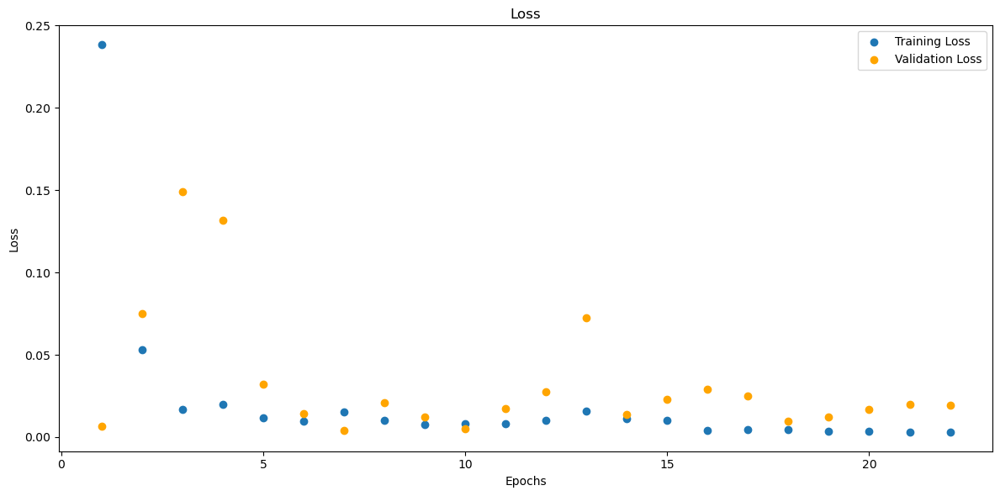

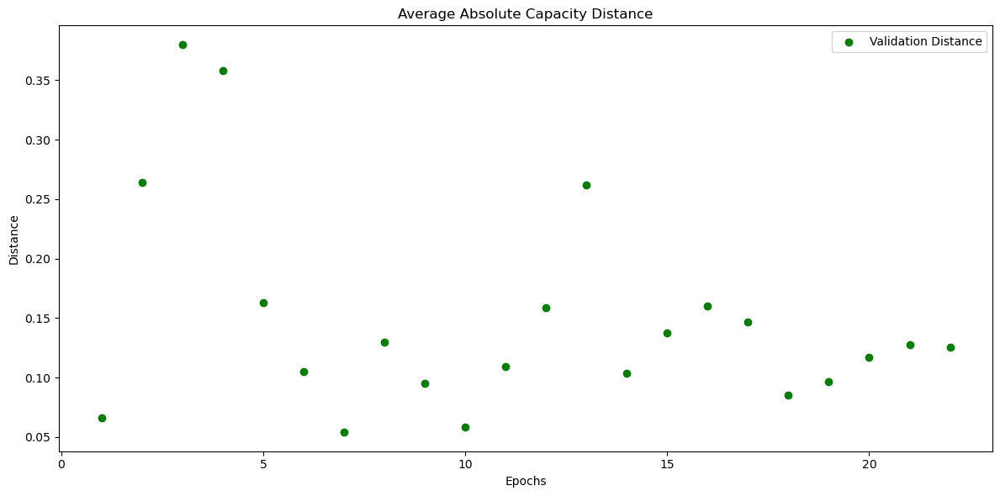

In [179]:
# B0005_charge_mm
model_B0005_charge_mm = CustomCNN(input_shape=input_shape_single)
model_B0005_charge_mm, train_losses_B0005_charge_mm, val_losses_B0005_charge_mm, val_distances_B0005_charge_mm, metrics_history_B0005_charge_mm = train(data_loaders['B0005_charge_mm_val_loader'], data_loaders['B0005_charge_mm_train_loader'], model_B0005_charge_mm)
torch.save(model_B0005_charge_mm, os.path.join(folder_name, 'model_B0005_charge_mm.pth'))

Test Loss: 0.0836
Test Loss: 0.0836, Test Distance: 0.1967, Test Accuracy: 0.0000, SNR: -10.9232
##Metrics##:
MAE : 0.19703993201255798
MSE : 0.04204792529344559
RMSE : 0.4468405544757843
R-squared : -1844.9168701171875
Count: 26


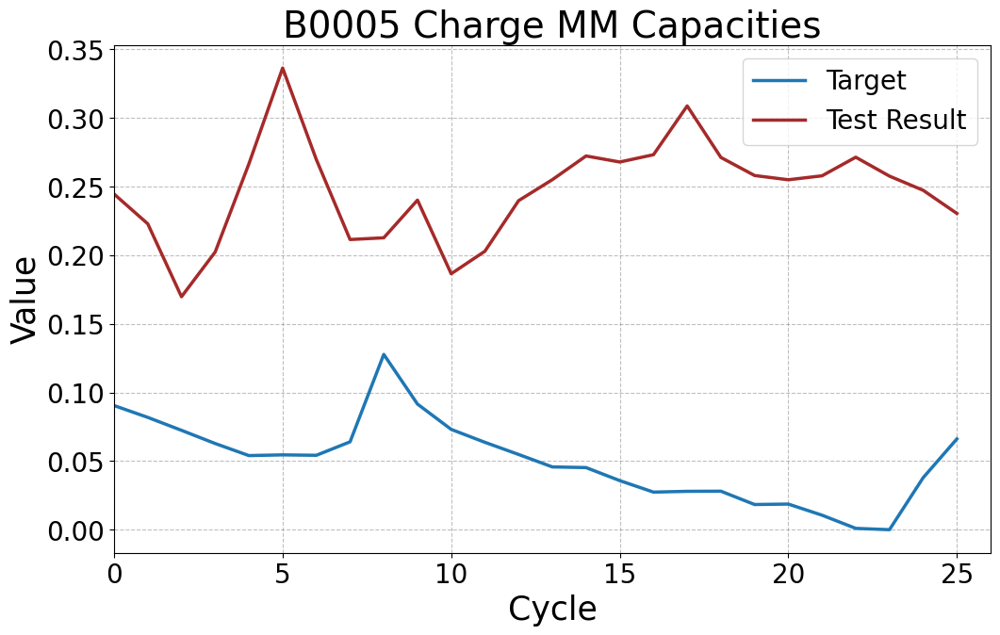

In [180]:
# B0005_charge_mm
model_B0005_charge_mm = torch.load('4. CNN Models/model_B0005_charge_mm.pth')
y_target_B0005_charge_mm, y_testresult_B0005_charge_mm = test(model_B0005_charge_mm, data_loaders['B0005_charge_mm_test_loader'])
y_target_B0005_charge_mm = flatten_and_concatenate(y_target_B0005_charge_mm)
y_testresult_B0005_charge_mm = flatten_and_concatenate(y_testresult_B0005_charge_mm)
plot_tensors(y_target_B0005_charge_mm, y_testresult_B0005_charge_mm, labels=["Target", "Test Result"], title="B0005 Charge MM Capacities")


Test on complete dataset.

Test Loss: 0.0392
Test Loss: 0.0392, Test Distance: 0.1206, Test Accuracy: 1.7857, SNR: 12.6677
##Metrics##:
MAE : 0.1205887570977211
MSE : 0.019598672166466713
RMSE : 0.35422906279563904
R-squared : -810.2116088867188
Count: 168


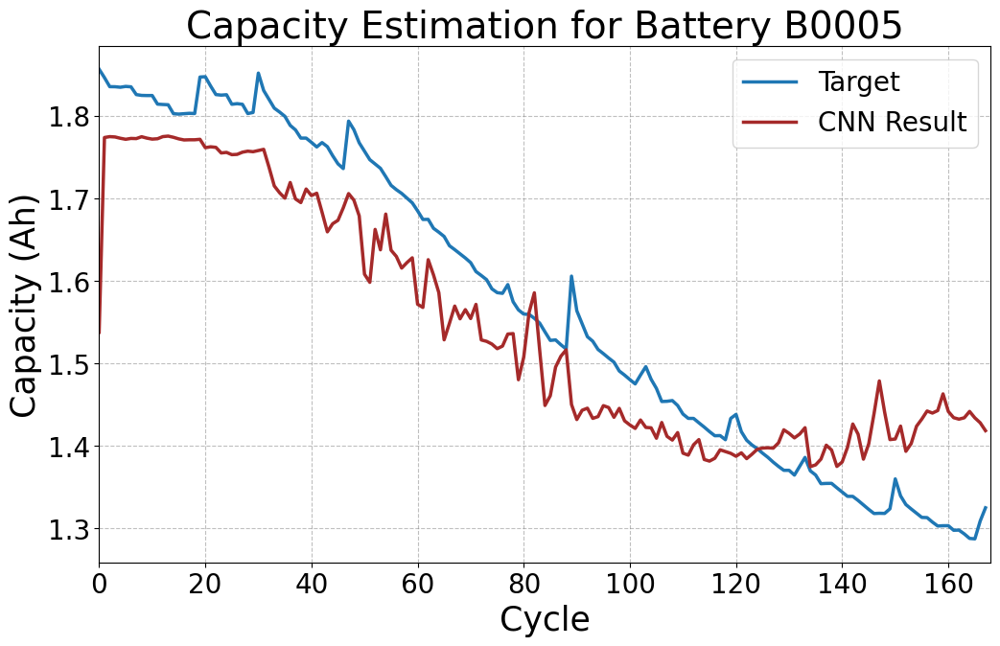

In [181]:
# Run the test on the model
y_target_B0005_charge_mm, y_testresult_B0005_charge_mm = test(model_B0005_charge_mm, data_loaders['B0005_charge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_charge_mm = flatten_and_concatenate(y_target_B0005_charge_mm)
y_testresult_B0005_charge_mm = flatten_and_concatenate(y_testresult_B0005_charge_mm)

# Assuming scaler_y_charge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_charge_mm = scaler_y_charge_mm_B0005.inverse_transform(y_target_B0005_charge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0005_charge_mm = scaler_y_charge_mm_B0005.inverse_transform(y_testresult_B0005_charge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_charge_mm = torch.tensor(original_y_target_B0005_charge_mm)
original_y_testresult_B0005_charge_mm = torch.tensor(original_y_testresult_B0005_charge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_charge_mm, original_y_testresult_B0005_charge_mm, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_charge_mm", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


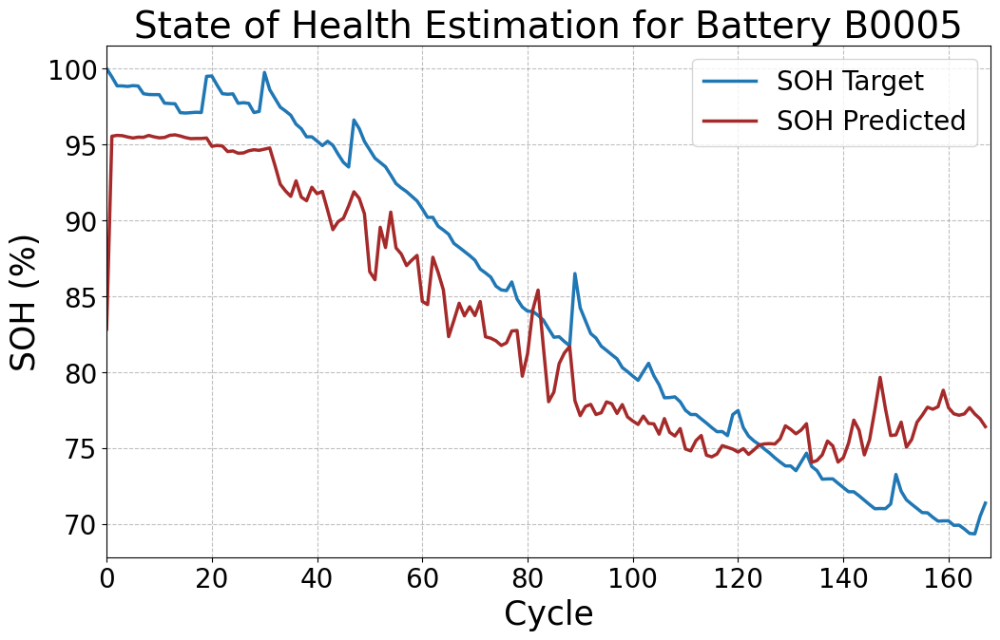

In [182]:
plot_soh(original_y_target_B0005_charge_mm, original_y_testresult_B0005_charge_mm, "State of Health Estimation for Battery B0005", file_name="B0005_charge_mm")


Model 2 - B0005 - Standard Scaler - Charging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.5708, Validation Loss: 0.0754
Validation Distance: 0.2403, Validation Accuracy: 4.0000, SNR: 11.5930
##Metrics##:
MAE : 0.17176872491836548
MSE : 0.053736768662929535
RMSE : 0.4336647391319275
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.1114, Validation Loss: 0.1990
Validation Distance: 0.3907, Validation Accuracy: 0.0000, SNR: 5.8750
##Metrics##:
MAE : 0.27345624566078186
MSE : 0.1350414901971817
RMSE : 0.5315868258476257
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0698, Validation Loss: 0.3161
Validation Distance: 0.4956, Validation Accuracy: 0.0000, SNR: 4.0906
##Metrics##:
MAE : 0.3483986556529999
MSE : 0.21630966663360596
RMSE : 0.6013453006744385
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0732, Validation Loss: 0.2341
Validation Distance: 0.4143, Validation Accuracy: 0.0000, SNR: 5.1235
##Metrics##:
MAE : 0.28891998529434204
MSE : 0.15855735540390015
RMSE : 0.5523592829704285
R-squared : -inf
Count: 34
Epoch 5/

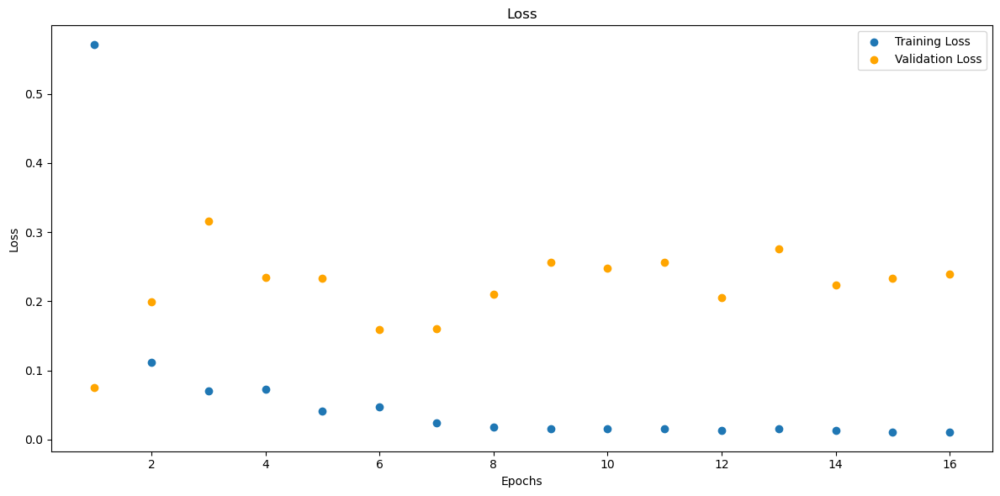

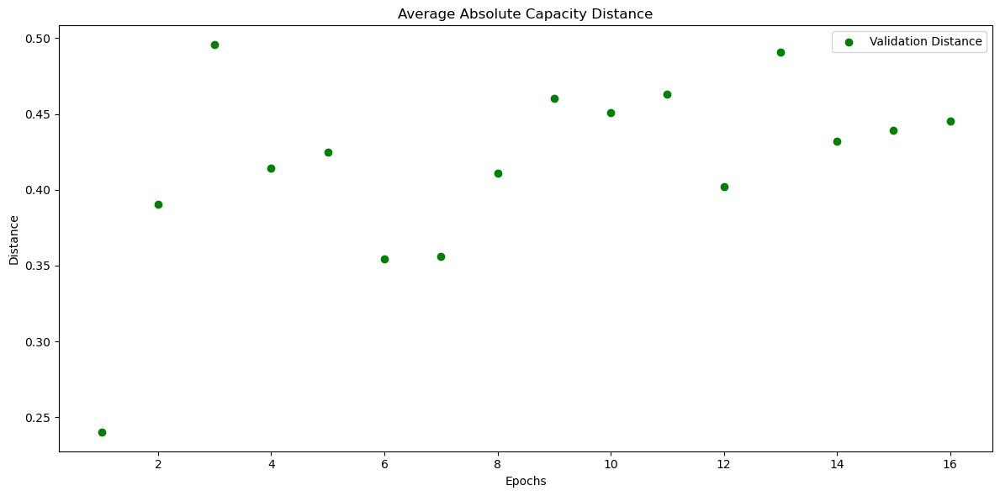

In [183]:
# B0005_charge_std
model_B0005_charge_std = CustomCNN(input_shape=input_shape_single)
model_B0005_charge_std, train_losses_B0005_charge_std, val_losses_B0005_charge_std, val_distances_B0005_charge_std, metrics_history_B0005_charge_std = train(data_loaders['B0005_charge_std_val_loader'], data_loaders['B0005_charge_std_train_loader'], model_B0005_charge_std)
torch.save(model_B0005_charge_std, os.path.join(folder_name, 'model_B0005_charge_std.pth'))

Test Loss: 1.4168
Test Loss: 1.4168, Test Distance: 0.8077, Test Accuracy: 0.0000, SNR: 4.1051
##Metrics##:
MAE : 0.8089097738265991
MSE : 0.7120310664176941
RMSE : 0.9077926278114319
R-squared : -3440.328125
Count: 26


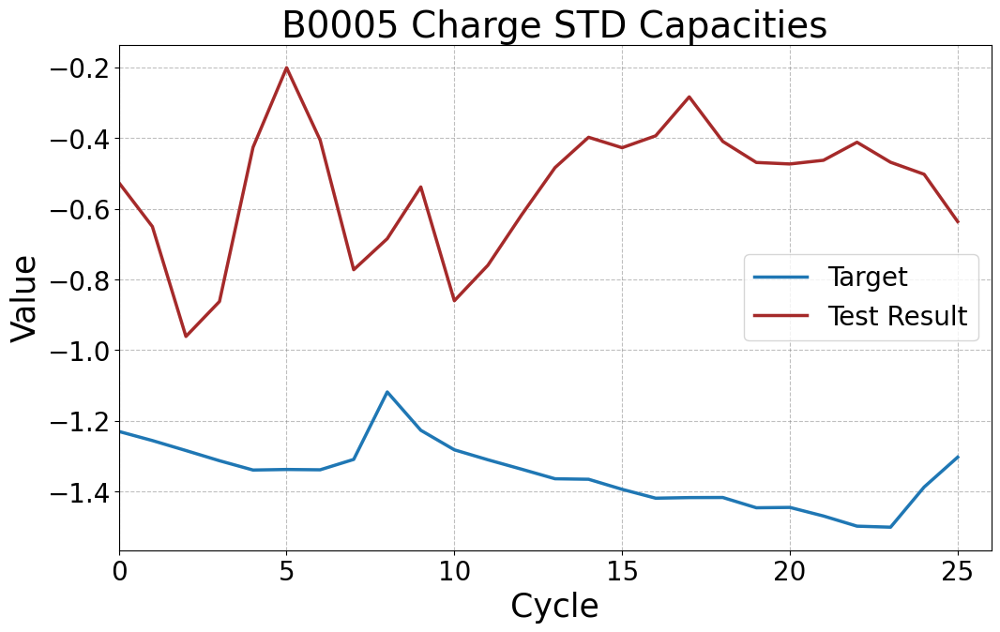

In [184]:
# B0005_charge_std
model_B0005_charge_std = torch.load('4. CNN Models/model_B0005_charge_std.pth')
y_target_B0005_charge_std, y_testresult_B0005_charge_std = test(model_B0005_charge_std, data_loaders['B0005_charge_std_test_loader'])
y_target_B0005_charge_std = flatten_and_concatenate(y_target_B0005_charge_std)
y_testresult_B0005_charge_std = flatten_and_concatenate(y_testresult_B0005_charge_std)
plot_tensors(y_target_B0005_charge_std, y_testresult_B0005_charge_std, labels=["Target", "Test Result"], title="B0005 Charge STD Capacities")


Test on Complete dataset

Test Loss: 0.4778
Test Loss: 0.4778, Test Distance: 0.3892, Test Accuracy: 2.3810, SNR: 6.2175
##Metrics##:
MAE : 0.3891584873199463
MSE : 0.23891998827457428
RMSE : 0.6467616558074951
R-squared : -1126.119873046875
Count: 168


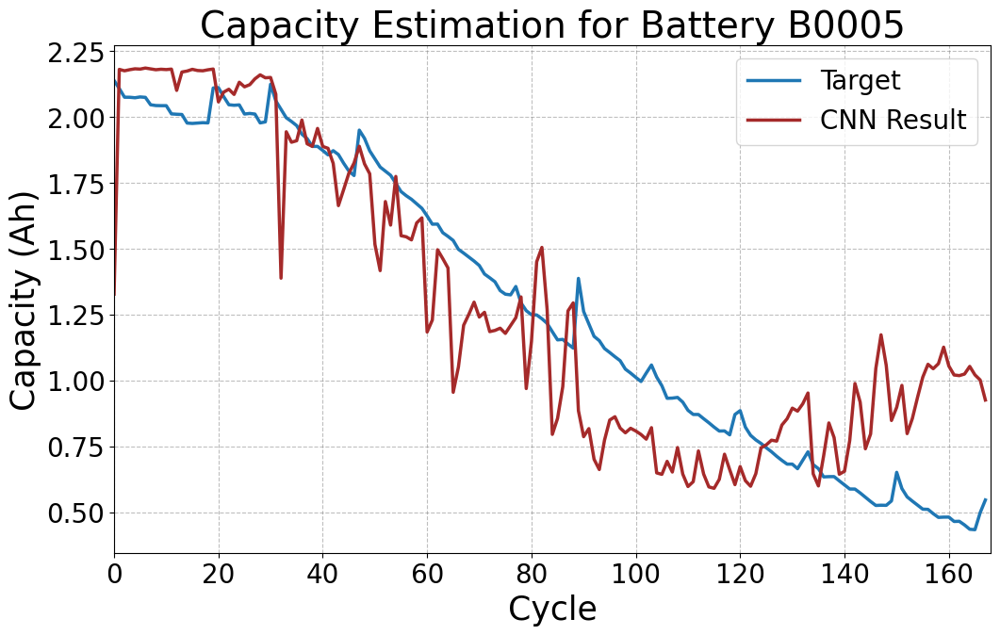

In [185]:
# Run the test on the model
y_target_B0005_charge_std, y_testresult_B0005_charge_std = test(model_B0005_charge_std, data_loaders['B0005_charge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_charge_std = flatten_and_concatenate(y_target_B0005_charge_std)
y_testresult_B0005_charge_std = flatten_and_concatenate(y_testresult_B0005_charge_std)

# Assuming scaler_y_charge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_charge_std = scaler_y_charge_mm_B0005.inverse_transform(y_target_B0005_charge_std.numpy().reshape(-1, 1))
original_y_testresult_B0005_charge_std = scaler_y_charge_mm_B0005.inverse_transform(y_testresult_B0005_charge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_charge_std = torch.tensor(original_y_target_B0005_charge_std)
original_y_testresult_B0005_charge_std = torch.tensor(original_y_testresult_B0005_charge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_charge_std, original_y_testresult_B0005_charge_std, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_charge_std", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


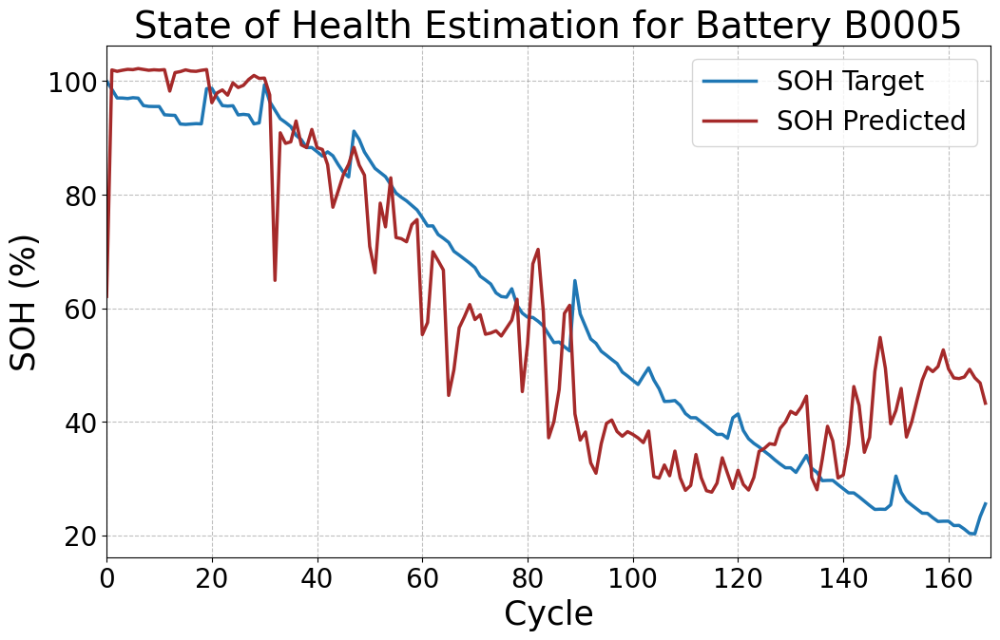

In [186]:
plot_soh(original_y_target_B0005_charge_std, original_y_testresult_B0005_charge_std, "State of Health Estimation for Battery B0005", file_name="B0005_charge_std")


Model 3 - B0005 - Robust Scaler - Charging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.3197, Validation Loss: 0.3468
Validation Distance: 0.5654, Validation Accuracy: 0.0000, SNR: -0.7086
##Metrics##:
MAE : 0.4122522175312042
MSE : 0.2524745762348175
RMSE : 0.6457250118255615
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0510, Validation Loss: 0.1523
Validation Distance: 0.3333, Validation Accuracy: 8.0000, SNR: 2.7470
##Metrics##:
MAE : 0.24000059068202972
MSE : 0.1106376051902771
RMSE : 0.5043745636940002
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0112, Validation Loss: 0.0353
Validation Distance: 0.1507, Validation Accuracy: 4.0000, SNR: 9.3169
##Metrics##:
MAE : 0.10811597108840942
MSE : 0.025714915245771408
RMSE : 0.3450113832950592
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0115, Validation Loss: 0.0354
Validation Distance: 0.1543, Validation Accuracy: 0.0000, SNR: 8.8393
##Metrics##:
MAE : 0.11033359169960022
MSE : 0.025575116276741028
RMSE : 0.34732598066329956
R-squared : -inf
Count: 34
Epoch 5

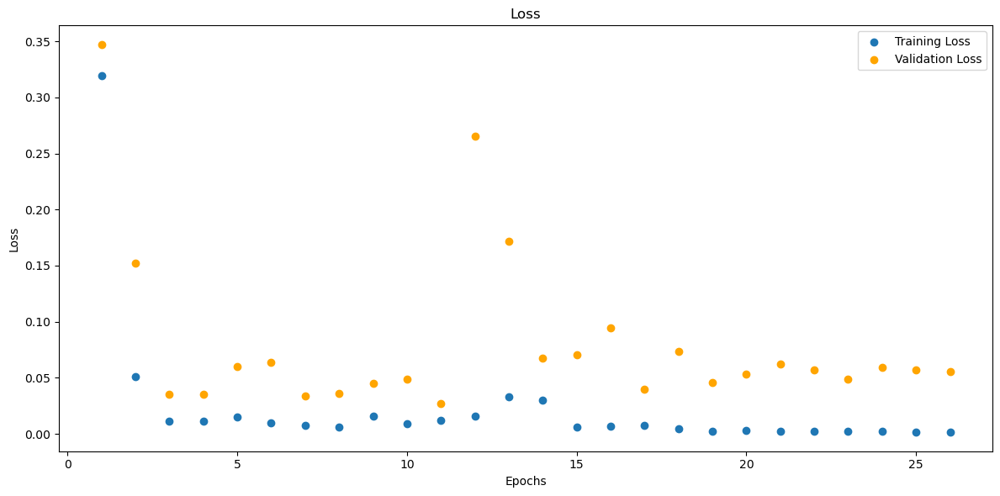

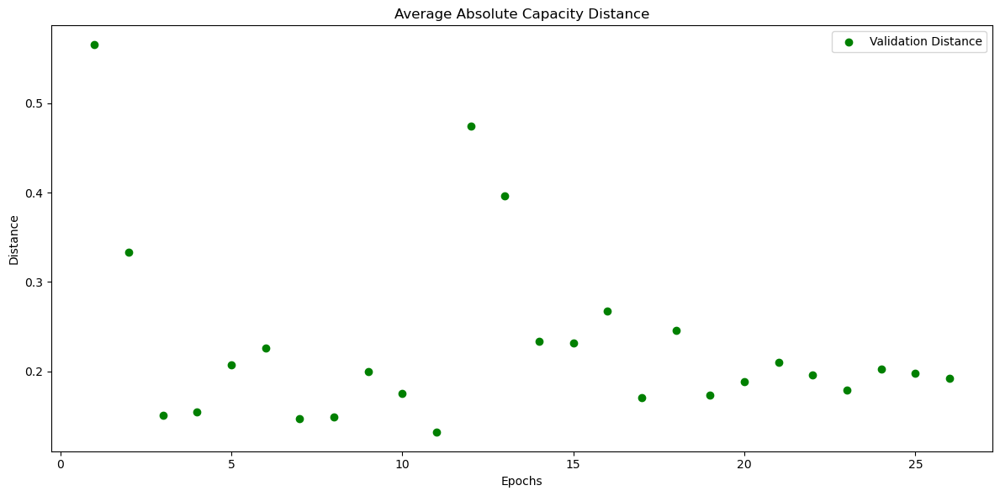

In [187]:
# B0005_charge_rob
model_B0005_charge_rob = CustomCNN(input_shape=input_shape_single)
model_B0005_charge_rob, train_losses_B0005_charge_rob, val_losses_B0005_charge_rob, val_distances_B0005_charge_rob, metrics_history_B0005_charge_rob = train(data_loaders['B0005_charge_rob_val_loader'], data_loaders['B0005_charge_rob_train_loader'], model_B0005_charge_rob)
torch.save(model_B0005_charge_rob, os.path.join(folder_name, 'model_B0005_charge_rob.pth'))

Test Loss: 0.4988
Test Loss: 0.4988, Test Distance: 0.4825, Test Accuracy: 0.0000, SNR: 2.1079
##Metrics##:
MAE : 0.48266711831092834
MSE : 0.24992062151432037
RMSE : 0.7018744945526123
R-squared : -4560.93212890625
Count: 26


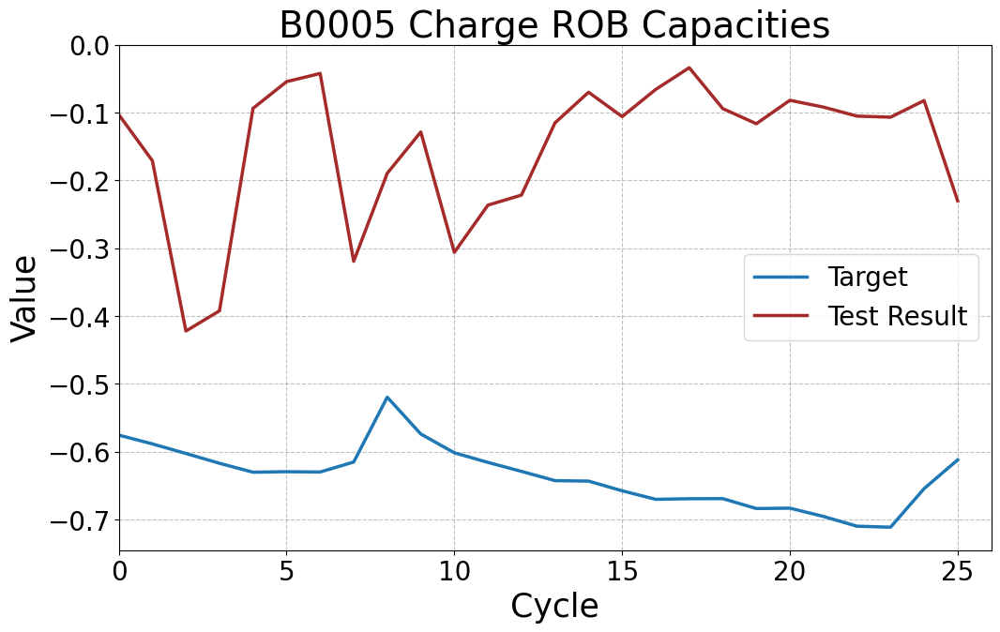

In [188]:
# B0005_charge_rob
model_B0005_charge_rob = torch.load('4. CNN Models/model_B0005_charge_rob.pth')
y_target_B0005_charge_rob, y_testresult_B0005_charge_rob = test(model_B0005_charge_rob, data_loaders['B0005_charge_rob_test_loader'])
y_target_B0005_charge_rob = flatten_and_concatenate(y_target_B0005_charge_rob)
y_testresult_B0005_charge_rob = flatten_and_concatenate(y_testresult_B0005_charge_rob)
plot_tensors(y_target_B0005_charge_rob, y_testresult_B0005_charge_rob, labels=["Target", "Test Result"], title="B0005 Charge ROB Capacities")


Test on complete dataset.

In [189]:
# Run the test on the model
y_target_B0005_charge_rob, y_testresult_B0005_charge_rob = test(model_B0005_charge_rob, data_loaders['B0005_charge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_charge_rob = flatten_and_concatenate(y_target_B0005_charge_rob)
y_testresult_B0005_charge_rob = flatten_and_concatenate(y_testresult_B0005_charge_rob)

# # Assuming scaler_y_charge_B0005 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0005_charge_rob = scaler_y_charge_rob_B0005.inverse_transform(y_target_B0005_charge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0005_charge_rob = scaler_y_charge_rob_B0005.inverse_transform(y_testresult_B0005_charge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0005_charge_rob = torch.tensor(original_y_target_B0005_charge_rob)
# original_y_testresult_B0005_charge_rob = torch.tensor(original_y_testresult_B0005_charge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0005_charge_rob, original_y_testresult_B0005_charge_rob, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_charge_rob", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


Test Loss: 0.0977
Test Loss: 0.0977, Test Distance: 0.1468, Test Accuracy: 4.1667, SNR: 7.1335
##Metrics##:
MAE : 0.14675013720989227
MSE : 0.048831064254045486
RMSE : 0.39469337463378906
R-squared : -765.914794921875
Count: 168


SOH plot.

In [190]:
# plot_soh(original_y_target_B0005_charge_rob, original_y_testresult_B0005_charge_rob, "State of Health Estimation for Battery B0005", file_name="B0005_charge_rob")


Model 4 - B0005 - MinMax Scaler - Discharging Data

Epoch 1/120, Training Loss: 0.1925, Validation Loss: 0.0187
Validation Distance: 0.1155, Validation Accuracy: 4.0000, SNR: 10.1432
##Metrics##:
MAE : 0.09003390371799469
MSE : 0.014789088629186153
RMSE : 0.31218111515045166
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0134, Validation Loss: 0.0392
Validation Distance: 0.1867, Validation Accuracy: 0.0000, SNR: -10.2302
##Metrics##:
MAE : 0.130991593003273
MSE : 0.026033971458673477
RMSE : 0.36607104539871216
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0100, Validation Loss: 0.0067
Validation Distance: 0.0728, Validation Accuracy: 4.0000, SNR: 5.8499
##Metrics##:
MAE : 0.05509825795888901
MSE : 0.005229352042078972
RMSE : 0.2427946925163269
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0075, Validation Loss: 0.0062
Validation Distance: 0.0619, Validation Accuracy: 4.0000, SNR: -4.0821
##Metrics##:
MAE : 0.04059934243559837
MSE : 0.00367035367526114
RMSE : 0.20614643394947052
R-squared : -inf
Count: 34


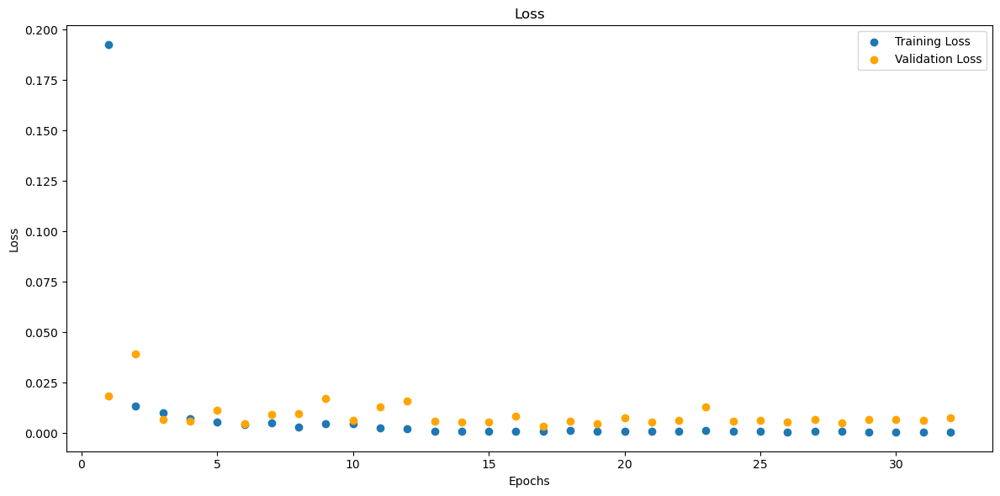

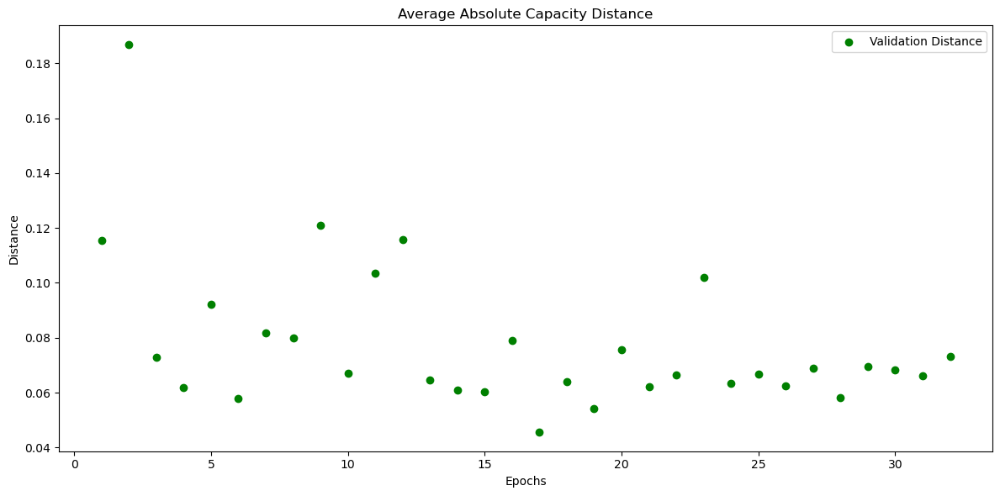

In [191]:
# B0005_discharge_mm
model_B0005_discharge_mm = CustomCNN(input_shape=input_shape_single)
model_B0005_discharge_mm, train_losses_B0005_discharge_mm, val_losses_B0005_discharge_mm, val_distances_B0005_discharge_mm, metrics_history_B0005_discharge_mm = train(data_loaders['B0005_discharge_mm_val_loader'], data_loaders['B0005_discharge_mm_train_loader'], model_B0005_discharge_mm)
torch.save(model_B0005_discharge_mm, os.path.join(folder_name, 'model_B0005_discharge_mm.pth'))

Test Loss: 0.0116
Test Loss: 0.0116, Test Distance: 0.0690, Test Accuracy: 0.0000, SNR: -2.3693
##Metrics##:
MAE : 0.06927631795406342
MSE : 0.005866136867552996
RMSE : 0.2664417624473572
R-squared : -167.62991333007812
Count: 26


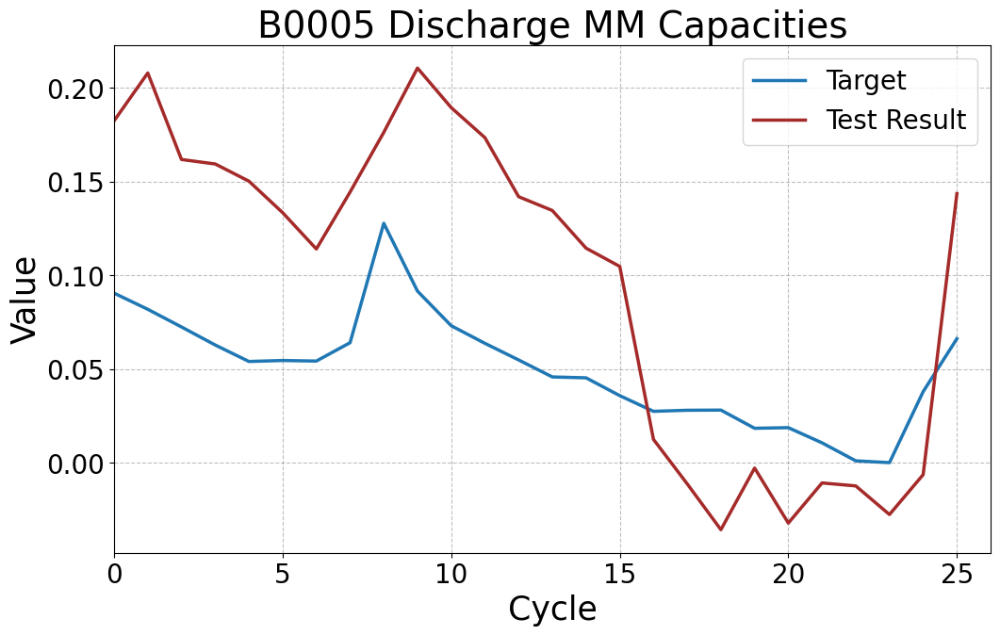

In [192]:
# B0005_discharge_mm
model_B0005_discharge_mm = torch.load('4. CNN Models/model_B0005_discharge_mm.pth')
y_target_B0005_discharge_mm, y_testresult_B0005_discharge_mm = test(model_B0005_discharge_mm, data_loaders['B0005_discharge_mm_test_loader'])
y_target_B0005_discharge_mm = flatten_and_concatenate(y_target_B0005_discharge_mm)
y_testresult_B0005_discharge_mm = flatten_and_concatenate(y_testresult_B0005_discharge_mm)
plot_tensors(y_target_B0005_discharge_mm, y_testresult_B0005_discharge_mm, labels=["Target", "Test Result"], title="B0005 Discharge MM Capacities")


Test on complete dataset.

Test Loss: 0.0044
Test Loss: 0.0044, Test Distance: 0.0353, Test Accuracy: 31.5476, SNR: 22.1833
##Metrics##:
MAE : 0.0352851040661335
MSE : 0.0021911386866122484
RMSE : 0.1949559450149536
R-squared : -62.76020050048828
Count: 168


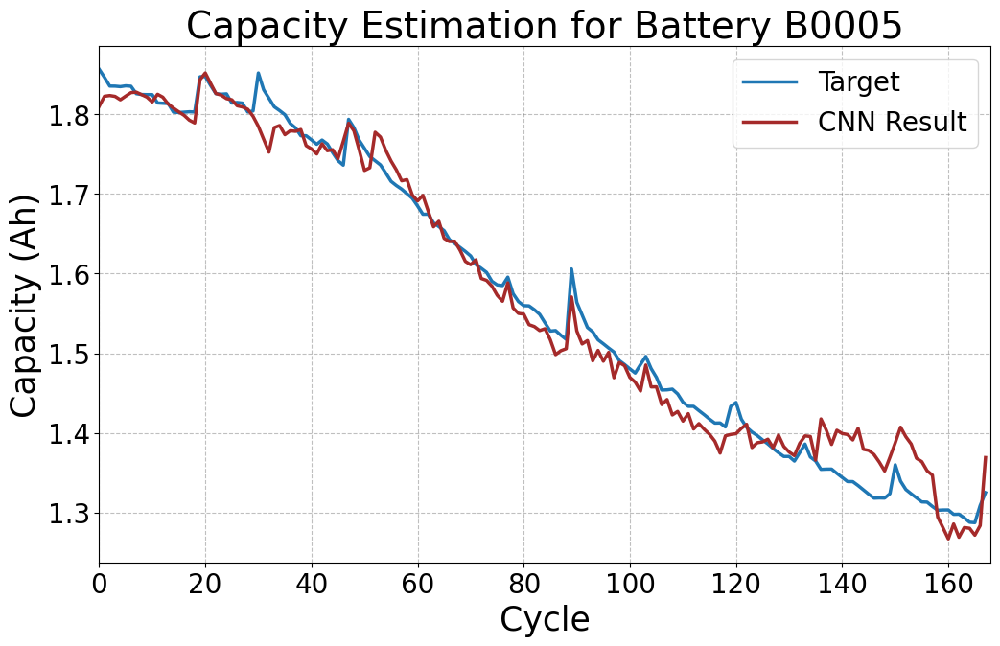

In [193]:
# Run the test on the model
y_target_B0005_discharge_mm, y_testresult_B0005_discharge_mm = test(model_B0005_discharge_mm, data_loaders['B0005_discharge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_discharge_mm = flatten_and_concatenate(y_target_B0005_discharge_mm)
y_testresult_B0005_discharge_mm = flatten_and_concatenate(y_testresult_B0005_discharge_mm)

# Assuming scaler_y_discharge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_discharge_mm = scaler_y_dis_mm_B0005.inverse_transform(y_target_B0005_discharge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0005_discharge_mm = scaler_y_dis_mm_B0005.inverse_transform(y_testresult_B0005_discharge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_discharge_mm = torch.tensor(original_y_target_B0005_discharge_mm)
original_y_testresult_B0005_discharge_mm = torch.tensor(original_y_testresult_B0005_discharge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_discharge_mm, original_y_testresult_B0005_discharge_mm, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_discharge_mm", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


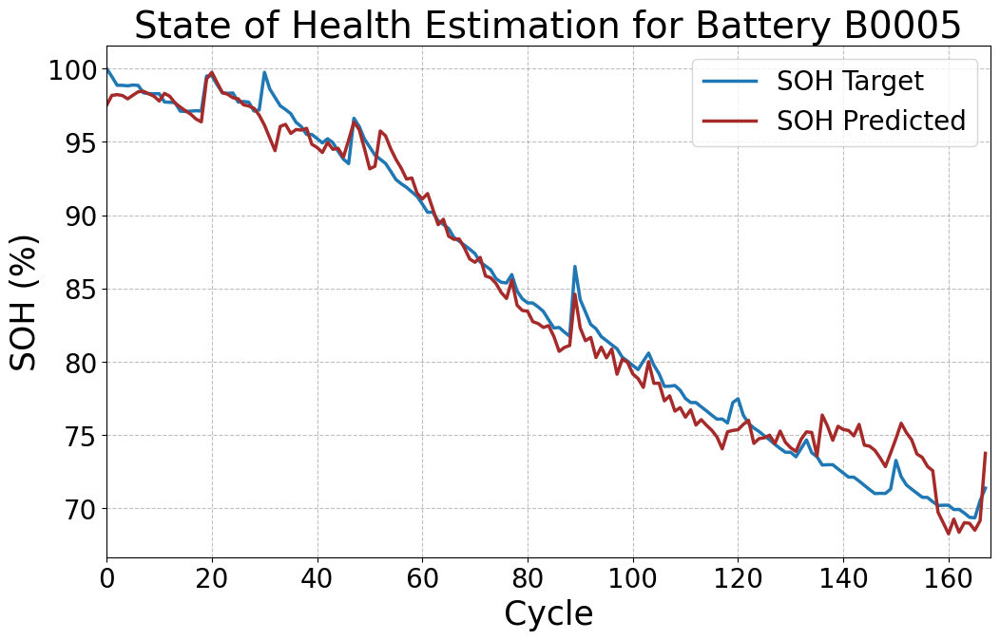

In [194]:
plot_soh(original_y_target_B0005_discharge_mm, original_y_testresult_B0005_discharge_mm, "State of Health Estimation for Battery B0005", file_name="B0005_discharge_mm")

Model 5 - B0005 - Standard Scaler - Discharging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.3280, Validation Loss: 0.1329
Validation Distance: 0.3119, Validation Accuracy: 0.0000, SNR: 5.0841
##Metrics##:
MAE : 0.20738542079925537
MSE : 0.07794029265642166
RMSE : 0.46539542078971863
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0429, Validation Loss: 0.2507
Validation Distance: 0.4534, Validation Accuracy: 0.0000, SNR: 3.7140
##Metrics##:
MAE : 0.31287506222724915
MSE : 0.16126005351543427
RMSE : 0.5623362064361572
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0670, Validation Loss: 0.0616
Validation Distance: 0.2024, Validation Accuracy: 4.0000, SNR: 7.3621
##Metrics##:
MAE : 0.12971526384353638
MSE : 0.03254666551947594
RMSE : 0.37155160307884216
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0312, Validation Loss: 0.0645
Validation Distance: 0.2005, Validation Accuracy: 12.0000, SNR: 6.9815
##Metrics##:
MAE : 0.12680399417877197
MSE : 0.033360209316015244
RMSE : 0.36831769347190857
R-squared : -inf
Count: 34
Epo

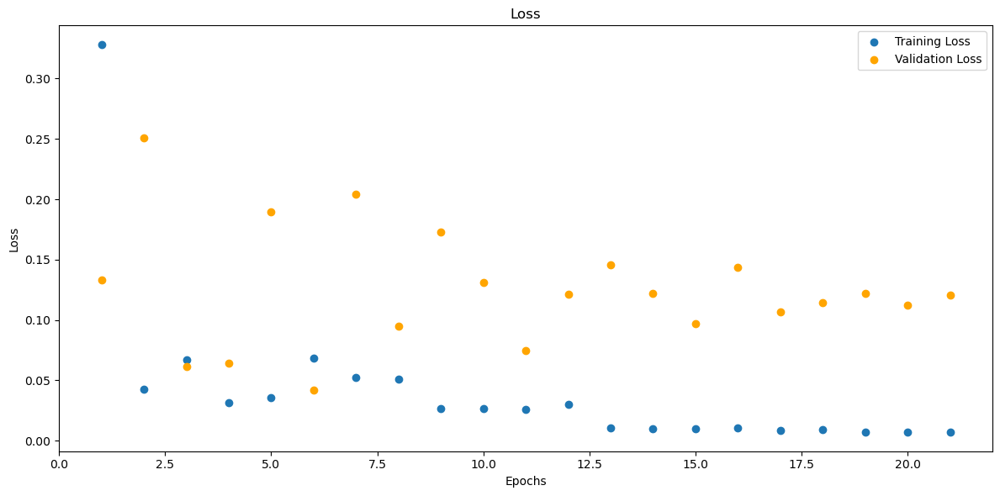

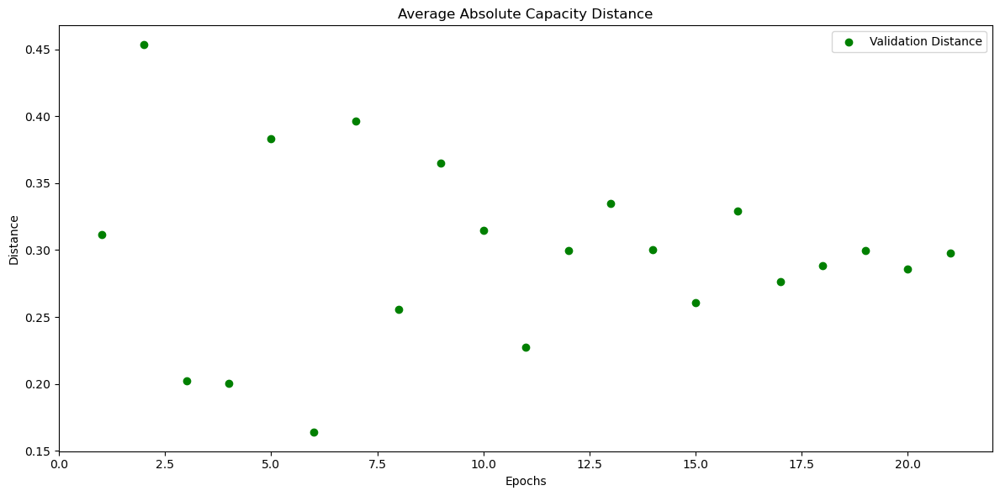

In [195]:
# B0005_discharge_std
model_B0005_discharge_std = CustomCNN(input_shape=input_shape_single)
model_B0005_discharge_std, train_losses_B0005_discharge_std, val_losses_B0005_discharge_std, val_distances_B0005_discharge_std, metrics_history_B0005_discharge_std = train(data_loaders['B0005_discharge_std_val_loader'], data_loaders['B0005_discharge_std_train_loader'], model_B0005_discharge_std)
torch.save(model_B0005_discharge_std, os.path.join(folder_name, 'model_B0005_discharge_std.pth'))

Test Loss: 0.1692
Test Loss: 0.1692, Test Distance: 0.2715, Test Accuracy: 0.0000, SNR: 13.2419
##Metrics##:
MAE : 0.2758144736289978
MSE : 0.08686080574989319
RMSE : 0.5341070294380188
R-squared : -386.109375
Count: 26


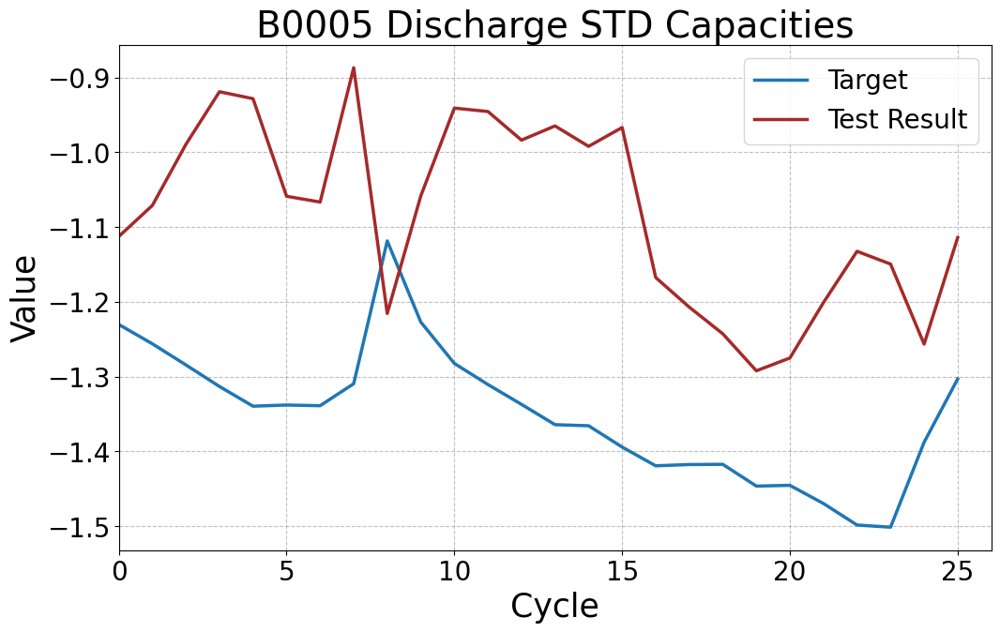

In [196]:
# B0005_discharge_std
model_B0005_discharge_std = torch.load('4. CNN Models/model_B0005_discharge_std.pth')
y_target_B0005_discharge_std, y_testresult_B0005_discharge_std = test(model_B0005_discharge_std, data_loaders['B0005_discharge_std_test_loader'])
y_target_B0005_discharge_std = flatten_and_concatenate(y_target_B0005_discharge_std)
y_testresult_B0005_discharge_std = flatten_and_concatenate(y_testresult_B0005_discharge_std)
plot_tensors(y_target_B0005_discharge_std, y_testresult_B0005_discharge_std, labels=["Target", "Test Result"], title="B0005 Discharge STD Capacities")


Test on complete dataset.

Test Loss: 0.1249
Test Loss: 0.1249, Test Distance: 0.2197, Test Accuracy: 2.9762, SNR: 12.0436
##Metrics##:
MAE : 0.21973823010921478
MSE : 0.06246597319841385
RMSE : 0.47605329751968384
R-squared : -346.7270202636719
Count: 168


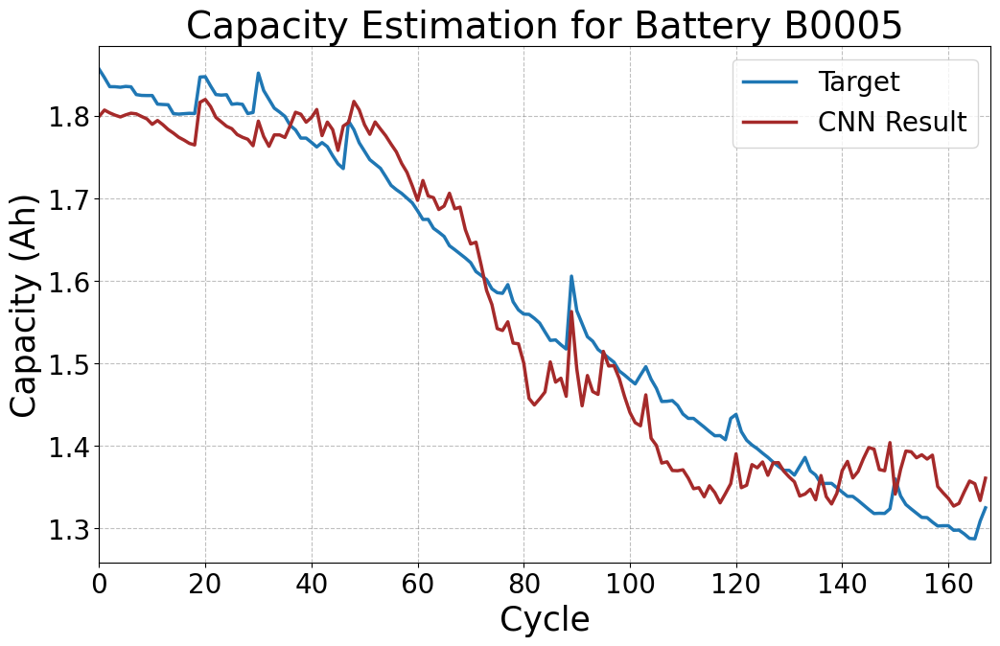

In [197]:
# Run the test on the model
y_target_B0005_discharge_std, y_testresult_B0005_discharge_std = test(model_B0005_discharge_std, data_loaders['B0005_discharge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_discharge_std = flatten_and_concatenate(y_target_B0005_discharge_std)
y_testresult_B0005_discharge_std = flatten_and_concatenate(y_testresult_B0005_discharge_std)

# Assuming scaler_y_discharge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_discharge_std = scaler_y_dis_std_B0005.inverse_transform(y_target_B0005_discharge_std.numpy().reshape(-1, 1))
original_y_testresult_B0005_discharge_std = scaler_y_dis_std_B0005.inverse_transform(y_testresult_B0005_discharge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_discharge_std = torch.tensor(original_y_target_B0005_discharge_std)
original_y_testresult_B0005_discharge_std = torch.tensor(original_y_testresult_B0005_discharge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_discharge_std, original_y_testresult_B0005_discharge_std, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_discharge_std", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


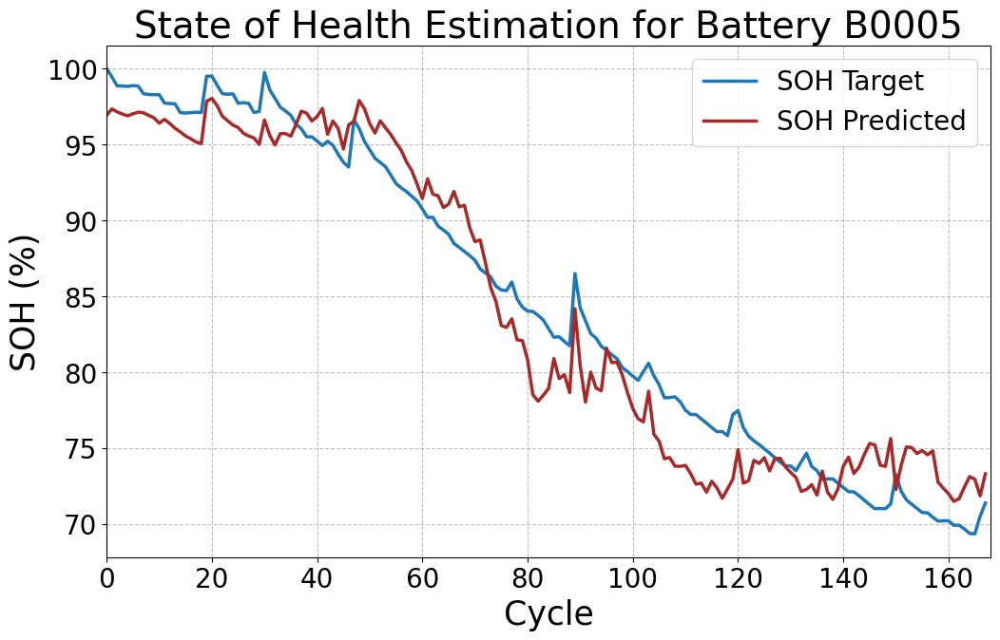

In [198]:
plot_soh(original_y_target_B0005_discharge_std, original_y_testresult_B0005_discharge_std, "State of Health Estimation for Battery B0005", file_name="B0005_discharge_std")

Model 6 - B0005 - Robust Scaler - Discharging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.4816, Validation Loss: 0.0332
Validation Distance: 0.1694, Validation Accuracy: 0.0000, SNR: 8.5527
##Metrics##:
MAE : 0.12186960875988007
MSE : 0.02364513836801052
RMSE : 0.3567017614841461
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0562, Validation Loss: 0.0137
Validation Distance: 0.0971, Validation Accuracy: 4.0000, SNR: 28.7561
##Metrics##:
MAE : 0.07590056210756302
MSE : 0.010849296115338802
RMSE : 0.28564804792404175
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0161, Validation Loss: 0.0268
Validation Distance: 0.1487, Validation Accuracy: 0.0000, SNR: 16.1259
##Metrics##:
MAE : 0.11283870041370392
MSE : 0.020795363932847977
RMSE : 0.34297069907188416
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0062, Validation Loss: 0.0142
Validation Distance: 0.1053, Validation Accuracy: 4.0000, SNR: 20.2360
##Metrics##:
MAE : 0.08030695468187332
MSE : 0.011056823655962944
RMSE : 0.2923828363418579
R-squared : -inf
Count: 34


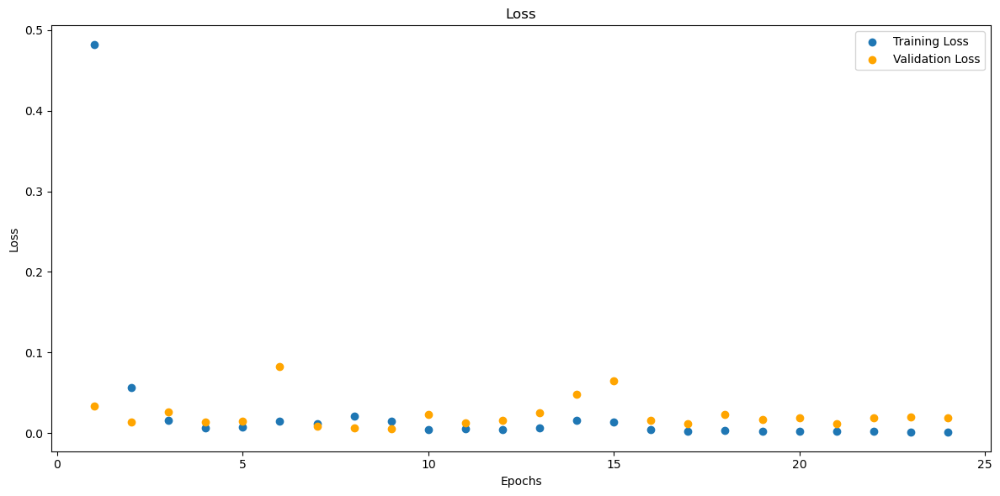

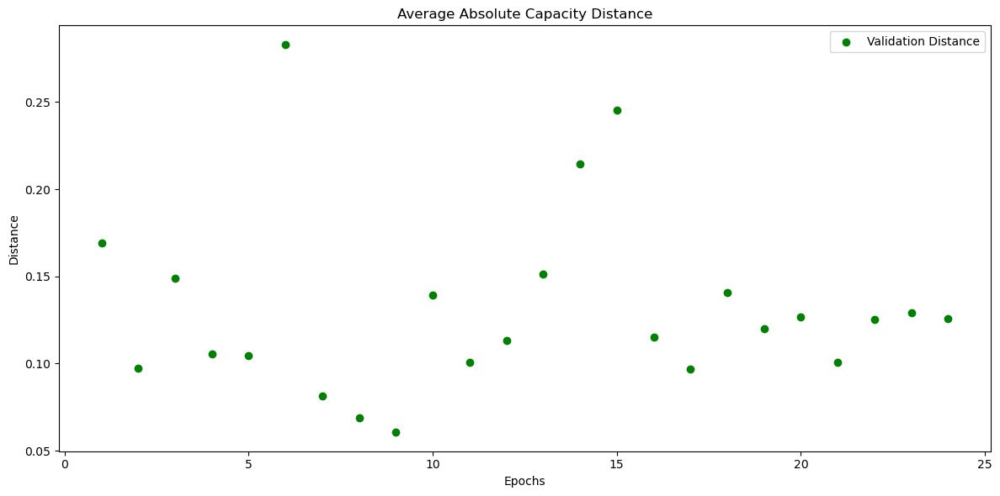

In [199]:
# B0005_discharge_rob
model_B0005_discharge_rob = CustomCNN(input_shape=input_shape_single)
model_B0005_discharge_rob, train_losses_B0005_discharge_rob, val_losses_B0005_discharge_rob, val_distances_B0005_discharge_rob, metrics_history_B0005_discharge_rob = train(data_loaders['B0005_discharge_rob_val_loader'], data_loaders['B0005_discharge_rob_train_loader'], model_B0005_discharge_rob)
torch.save(model_B0005_discharge_rob, os.path.join(folder_name, 'model_B0005_discharge_rob.pth'))

Test Loss: 0.0430
Test Loss: 0.0430, Test Distance: 0.1371, Test Accuracy: 3.8462, SNR: 12.7231
##Metrics##:
MAE : 0.13747736811637878
MSE : 0.021691329777240753
RMSE : 0.37501901388168335
R-squared : -442.6220703125
Count: 26


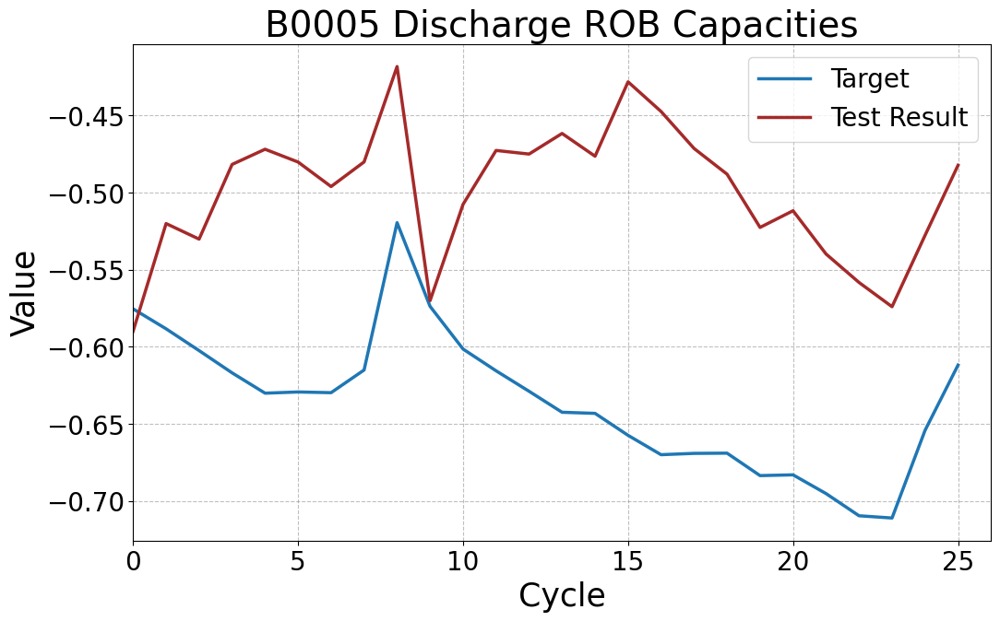

In [200]:
# B0005_discharge_rob
model_B0005_discharge_rob = torch.load('4. CNN Models/model_B0005_discharge_rob.pth')
y_target_B0005_discharge_rob, y_testresult_B0005_discharge_rob = test(model_B0005_discharge_rob, data_loaders['B0005_discharge_rob_test_loader'])
y_target_B0005_discharge_rob = flatten_and_concatenate(y_target_B0005_discharge_rob)
y_testresult_B0005_discharge_rob = flatten_and_concatenate(y_testresult_B0005_discharge_rob)
plot_tensors(y_target_B0005_discharge_rob, y_testresult_B0005_discharge_rob, labels=["Target", "Test Result"], title="B0005 Discharge ROB Capacities")


Test on complete dataset

In [201]:
# Run the test on the model
y_target_B0005_discharge_rob, y_testresult_B0005_discharge_rob = test(model_B0005_discharge_rob, data_loaders['B0005_discharge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_discharge_rob = flatten_and_concatenate(y_target_B0005_discharge_rob)
y_testresult_B0005_discharge_rob = flatten_and_concatenate(y_testresult_B0005_discharge_rob)

# # Assuming scaler_y_discharge_B0005 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0005_discharge_rob = scaler_y_dis_rob_B0005.inverse_transform(y_target_B0005_discharge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0005_discharge_rob = scaler_y_dis_rob_B0005.inverse_transform(y_testresult_B0005_discharge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0005_discharge_rob = torch.tensor(original_y_target_B0005_discharge_rob)
# original_y_testresult_B0005_discharge_rob = torch.tensor(original_y_testresult_B0005_discharge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0005_discharge_rob, original_y_testresult_B0005_discharge_rob, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_discharge_rob", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


Test Loss: 0.0178
Test Loss: 0.0178, Test Distance: 0.0745, Test Accuracy: 10.1190, SNR: 14.5253
##Metrics##:
MAE : 0.0744653046131134
MSE : 0.008902670815587044
RMSE : 0.28092822432518005
R-squared : -84.47798156738281
Count: 168


SOH plot.

In [202]:
# plot_soh(original_y_target_B0005_discharge_rob, original_y_testresult_B0005_discharge_rob, "State of Health Estimation for Battery B0005", file_name="B0005_discharge_rob")

Model 7 - B0005 - MinMax Scaler - Combined Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1651, Validation Loss: 0.0176
Validation Distance: 0.1269, Validation Accuracy: 0.0000, SNR: 1.3179
##Metrics##:
MAE : 0.09623228758573532
MSE : 0.01363938394933939
RMSE : 0.31336939334869385
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0169, Validation Loss: 0.0019
Validation Distance: 0.0364, Validation Accuracy: 4.0000, SNR: 8.6901
##Metrics##:
MAE : 0.026934698224067688
MSE : 0.0014463572297245264
RMSE : 0.1700194627046585
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0292, Validation Loss: 0.0031
Validation Distance: 0.0443, Validation Accuracy: 4.0000, SNR: 20.0849
##Metrics##:
MAE : 0.034641120582818985
MSE : 0.0024603926576673985
RMSE : 0.19362890720367432
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0053, Validation Loss: 0.0096
Validation Distance: 0.0886, Validation Accuracy: 0.0000, SNR: 2.4440
##Metrics##:
MAE : 0.06637009978294373
MSE : 0.007317636627703905
RMSE : 0.25964120030403137
R-squared : -inf
Count: 

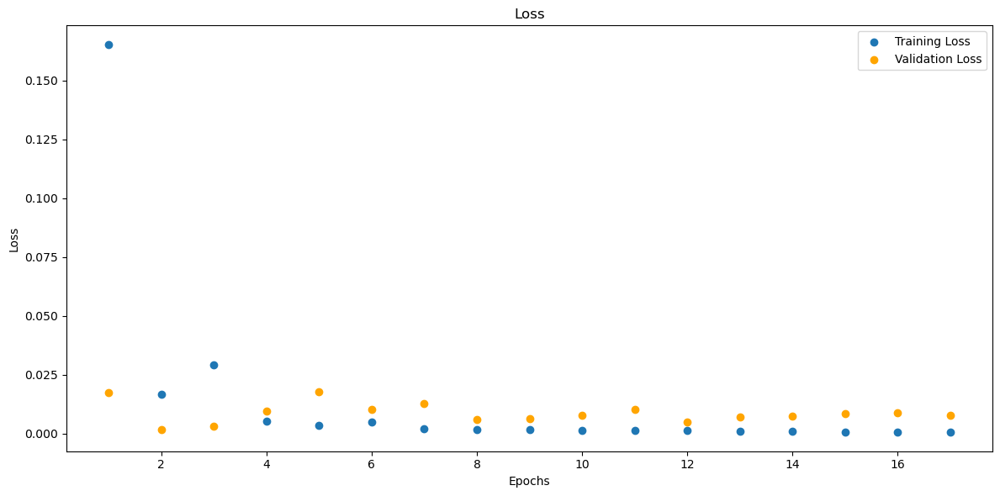

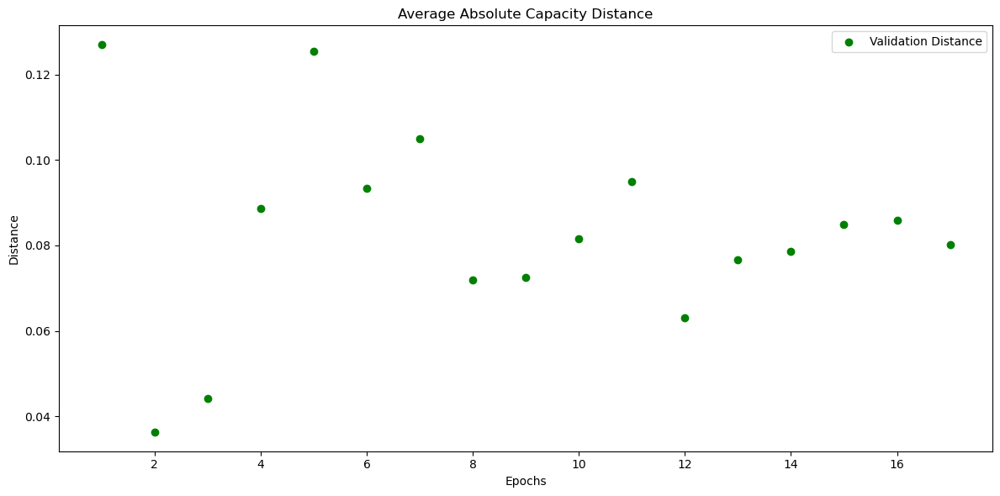

In [294]:
# B0005_combined_mm
model_B0005_combined_mm = CustomCNN(input_shape=input_shape_combined)
model_B0005_combined_mm, train_losses_B0005_combined_mm, val_losses_B0005_combined_mm, val_distances_B0005_combined_mm, metrics_history_B0005_combined_mm = train(data_loaders['B0005_combined_mm_val_loader'], data_loaders['B0005_combined_mm_train_loader'], model_B0005_combined_mm)
torch.save(model_B0005_combined_mm, os.path.join(folder_name, 'model_B0005_combined_mm.pth'))

Test Loss: 0.0082
Test Loss: 0.0082, Test Distance: 0.0570, Test Accuracy: 3.8462, SNR: -0.5934
##Metrics##:
MAE : 0.05555344000458717
MSE : 0.0038973046466708183
RMSE : 0.2425096184015274
R-squared : -150.4195098876953
Count: 26


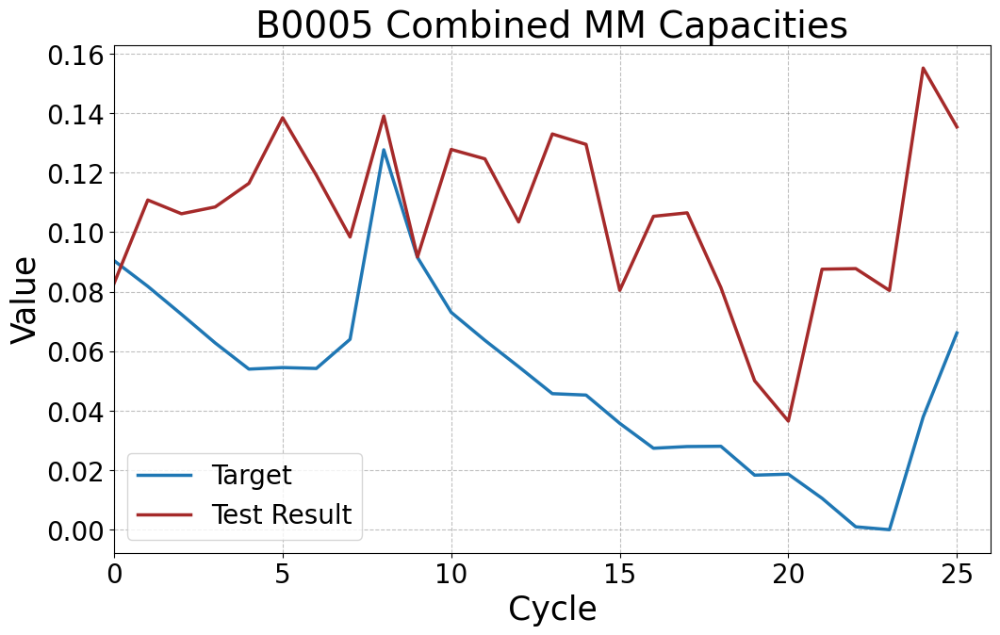

In [295]:
# B0005_combined_mm
model_B0005_combined_mm = torch.load('4. CNN Models/model_B0005_combined_mm.pth')
y_target_B0005_combined_mm, y_testresult_B0005_combined_mm = test(model_B0005_combined_mm, data_loaders['B0005_combined_mm_test_loader'])
y_target_B0005_combined_mm = flatten_and_concatenate(y_target_B0005_combined_mm)
y_testresult_B0005_combined_mm = flatten_and_concatenate(y_testresult_B0005_combined_mm)
plot_tensors(y_target_B0005_combined_mm, y_testresult_B0005_combined_mm, labels=["Target", "Test Result"], title="B0005 Combined MM Capacities")


Test on complete dataset.

Test Loss: 0.0084
Test Loss: 0.0084, Test Distance: 0.0499, Test Accuracy: 20.8333, SNR: 19.3616
##Metrics##:
MAE : 0.049940403550863266
MSE : 0.004196008201688528
RMSE : 0.2345409393310547
R-squared : -73.96131134033203
Count: 168


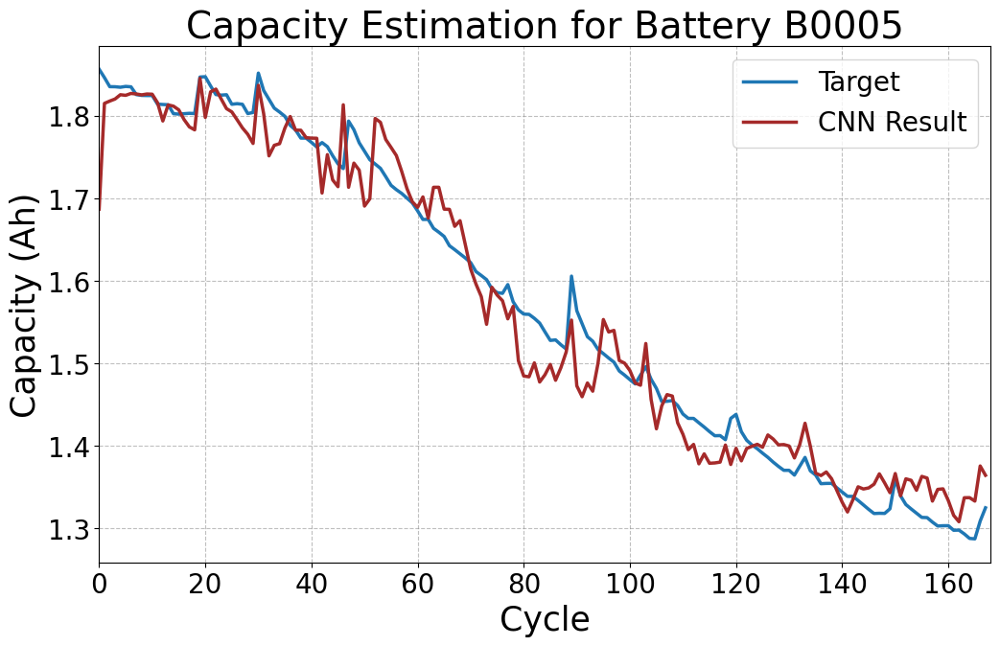

In [296]:
# Run the test on the model
y_target_B0005_combined_mm, y_testresult_B0005_combined_mm = test(model_B0005_combined_mm, data_loaders['B0005_combined_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_combined_mm = flatten_and_concatenate(y_target_B0005_combined_mm)
y_testresult_B0005_combined_mm = flatten_and_concatenate(y_testresult_B0005_combined_mm)

# Assuming scaler_y_comb_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_combined_mm = scaler_y_comb_mm_B0005.inverse_transform(y_target_B0005_combined_mm.numpy().reshape(-1, 1))
original_y_testresult_B0005_combined_mm = scaler_y_comb_mm_B0005.inverse_transform(y_testresult_B0005_combined_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_combined_mm = torch.tensor(original_y_target_B0005_combined_mm)
original_y_testresult_B0005_combined_mm = torch.tensor(original_y_testresult_B0005_combined_mm)
# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_combined_mm, original_y_testresult_B0005_combined_mm, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0005",file_name="B0005_combined_mm", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")

Save data to compare with other models.

In [206]:
# # Convert tensors to numpy arrays and flatten to 1D
# original_y_target_B0005_combined_mm = original_y_target_B0005_combined_mm.numpy().flatten()
# original_y_testresult_B0005_combined_mm = original_y_testresult_B0005_combined_mm.numpy().flatten()

# # Create a DataFrame to store the data with new column names
# df = pd.DataFrame({
#     "y_target_B0005_CNN": original_y_target_B0005_combined_mm,
#     "y_test_B0005_CNN": original_y_testresult_B0005_combined_mm
# })

# # Define the directory and file path
# save_dir = "15. Results"
# if not os.path.exists(save_dir):
#     os.makedirs(save_dir)  # Create the directory if it doesn't exist

# csv_file_path = os.path.join(save_dir, "B0005_CNN_results.csv")

# # Save the DataFrame to a CSV file
# df.to_csv(csv_file_path, index=False)

# print(f"Data has been saved to {csv_file_path}")

Data has been saved to 15. Results\B0005_CNN_results.csv


SOH plot

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


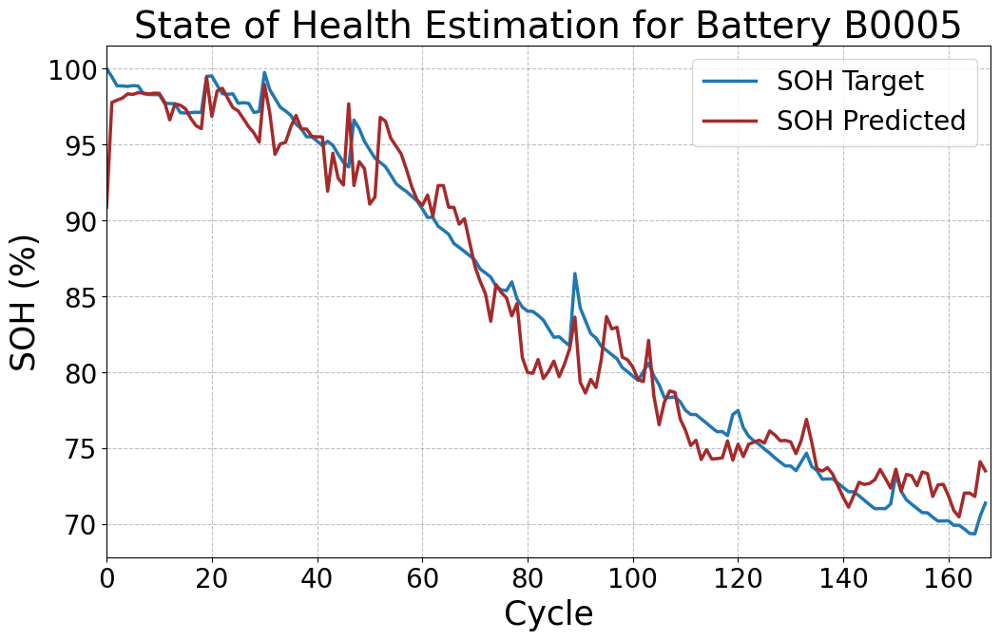

In [297]:
plot_soh(original_y_target_B0005_combined_mm, original_y_testresult_B0005_combined_mm,"State of Health Estimation for Battery B0005", file_name="B0005_combined_mm")

Model 8 - B0005 - Standard Scaler - Combined Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.5345, Validation Loss: 0.1537
Validation Distance: 0.3683, Validation Accuracy: 0.0000, SNR: 7.2511
##Metrics##:
MAE : 0.2610560953617096
MSE : 0.10526614636182785
RMSE : 0.5138372182846069
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0582, Validation Loss: 0.2498
Validation Distance: 0.4839, Validation Accuracy: 0.0000, SNR: 5.1317
##Metrics##:
MAE : 0.3441592752933502
MSE : 0.1710851490497589
RMSE : 0.5879978537559509
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0484, Validation Loss: 0.0784
Validation Distance: 0.2423, Validation Accuracy: 0.0000, SNR: 8.0752
##Metrics##:
MAE : 0.16386009752750397
MSE : 0.04841034114360809
RMSE : 0.41018205881118774
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0510, Validation Loss: 0.1714
Validation Distance: 0.3952, Validation Accuracy: 0.0000, SNR: 6.6359
##Metrics##:
MAE : 0.2801019549369812
MSE : 0.11684180796146393
RMSE : 0.5333902835845947
R-squared : -inf
Count: 34
Epoch 5/120

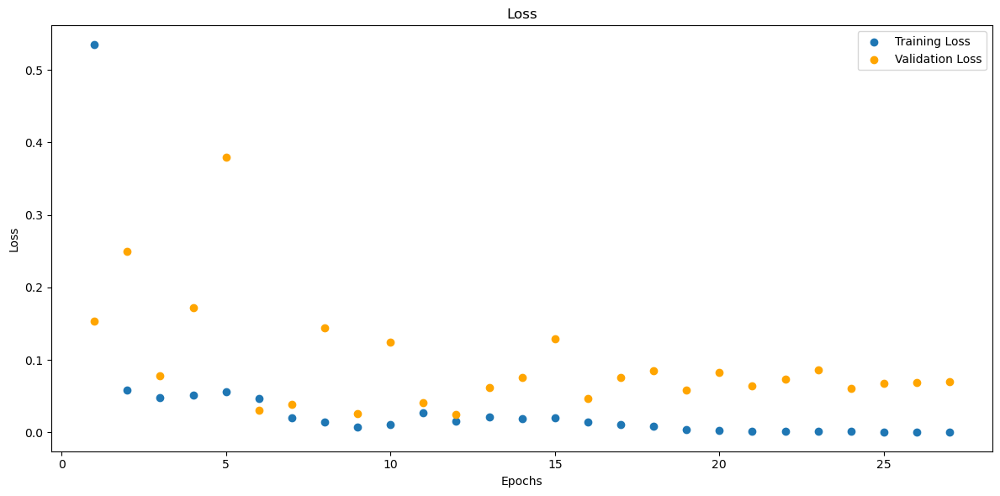

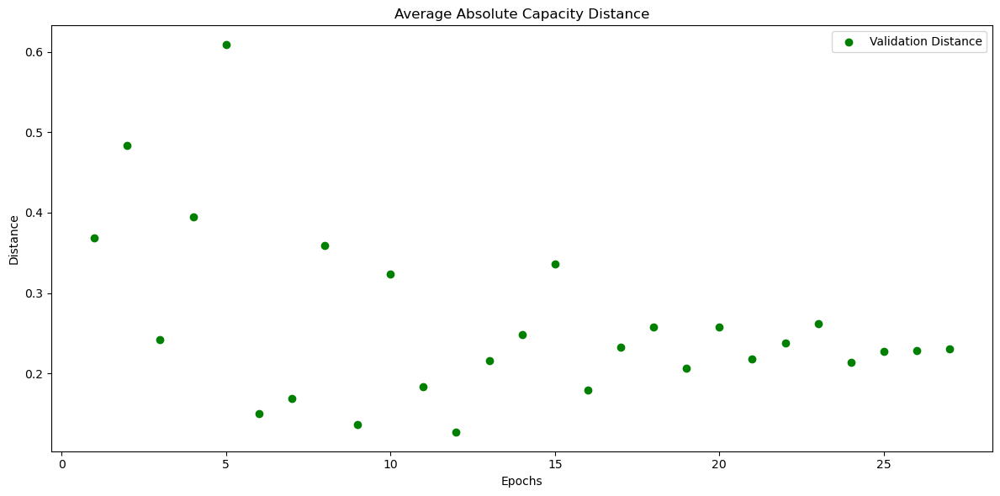

In [208]:
# B0005_combined_std
model_B0005_combined_std = CustomCNN(input_shape=input_shape_combined)
model_B0005_combined_std, train_losses_B0005_combined_std, val_losses_B0005_combined_std, val_distances_B0005_combined_std, metrics_history_B0005_combined_std = train(data_loaders['B0005_combined_std_val_loader'], data_loaders['B0005_combined_std_train_loader'], model_B0005_combined_std)
torch.save(model_B0005_combined_std, os.path.join(folder_name, 'model_B0005_combined_std.pth'))

Test Loss: 0.6100
Test Loss: 0.6100, Test Distance: 0.5396, Test Accuracy: 0.0000, SNR: 7.8084
##Metrics##:
MAE : 0.5379067659378052
MSE : 0.30350473523139954
RMSE : 0.7369483113288879
R-squared : -1402.035888671875
Count: 26


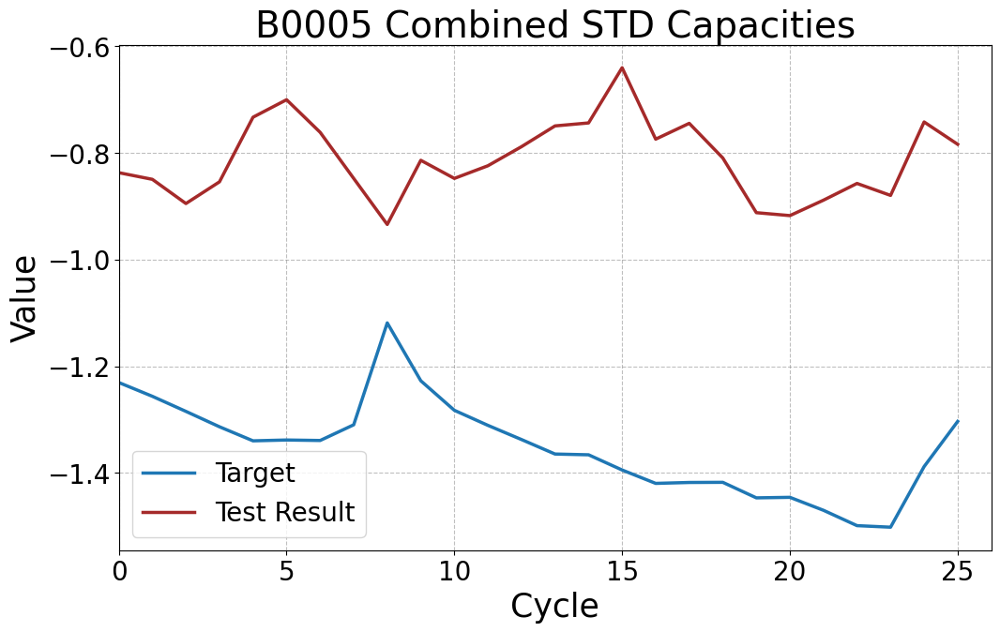

In [209]:
# B0005_combined_std
model_B0005_combined_std = torch.load('4. CNN Models/model_B0005_combined_std.pth')
y_target_B0005_combined_std, y_testresult_B0005_combined_std = test(model_B0005_combined_std, data_loaders['B0005_combined_std_test_loader'])
y_target_B0005_combined_std = flatten_and_concatenate(y_target_B0005_combined_std)
y_testresult_B0005_combined_std = flatten_and_concatenate(y_testresult_B0005_combined_std)
plot_tensors(y_target_B0005_combined_std, y_testresult_B0005_combined_std, labels=["Target", "Test Result"], title="B0005 Combined STD Capacities")


Test on complete dataset.

Test Loss: 0.1288
Test Loss: 0.1288, Test Distance: 0.1898, Test Accuracy: 4.1667, SNR: 11.9100
##Metrics##:
MAE : 0.18975718319416046
MSE : 0.06441665440797806
RMSE : 0.4429435431957245
R-squared : -345.0802001953125
Count: 168


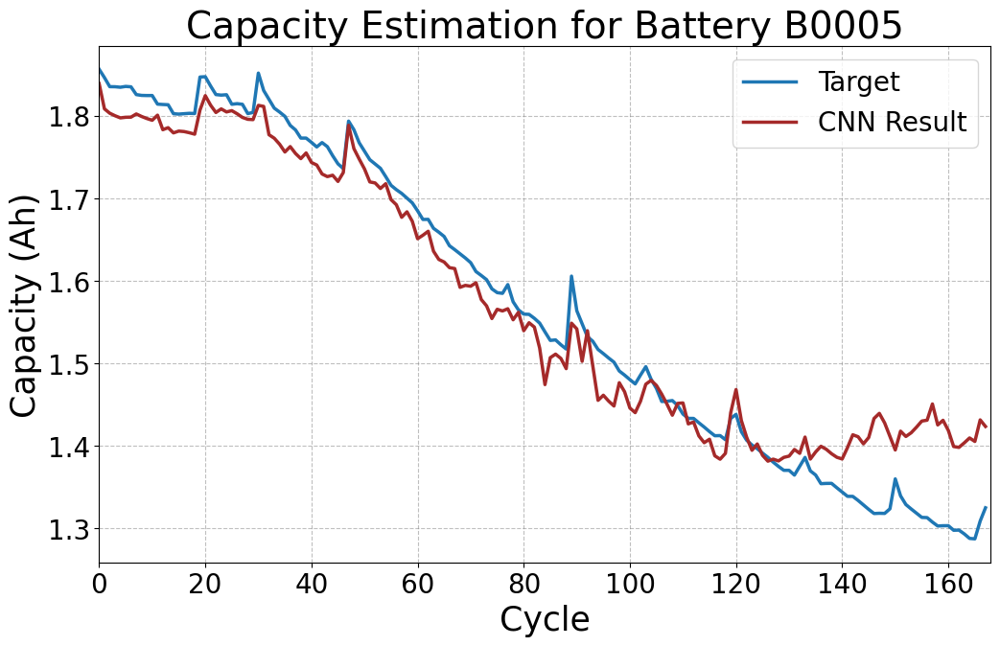

In [210]:
# Run the test on the model
y_target_B0005_combined_std, y_testresult_B0005_combined_std = test(model_B0005_combined_std, data_loaders['B0005_combined_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_combined_std = flatten_and_concatenate(y_target_B0005_combined_std)
y_testresult_B0005_combined_std = flatten_and_concatenate(y_testresult_B0005_combined_std)

# Assuming scaler_y_comb_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_combined_std = scaler_y_comb_std_B0005.inverse_transform(y_target_B0005_combined_std.numpy().reshape(-1, 1))
original_y_testresult_B0005_combined_std = scaler_y_comb_std_B0005.inverse_transform(y_testresult_B0005_combined_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_combined_std = torch.tensor(original_y_target_B0005_combined_std)
original_y_testresult_B0005_combined_std = torch.tensor(original_y_testresult_B0005_combined_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_combined_std, original_y_testresult_B0005_combined_std, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_combined_std", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


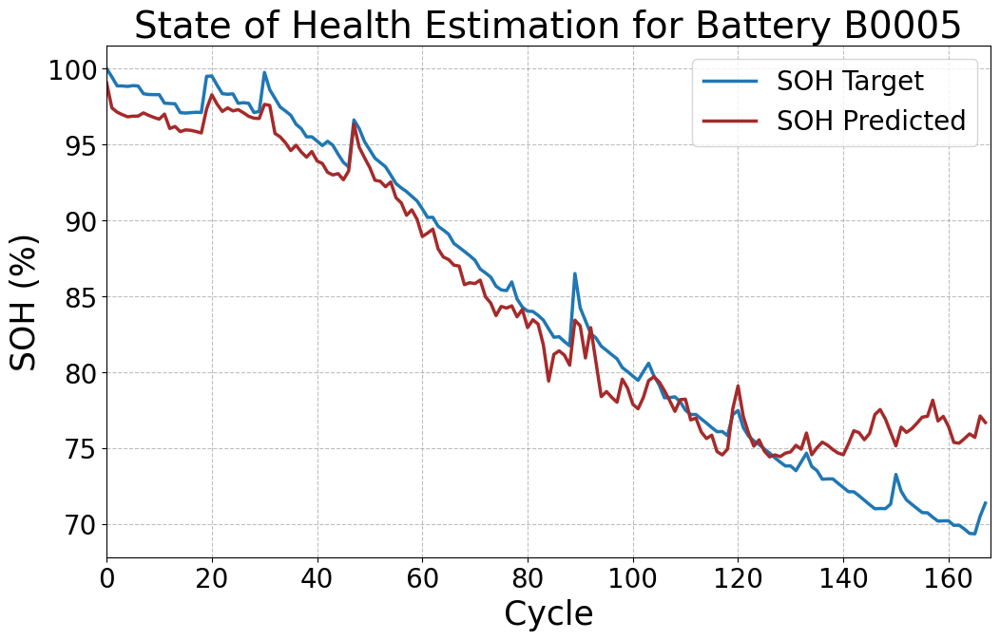

In [211]:
plot_soh(original_y_target_B0005_combined_std, original_y_testresult_B0005_combined_std,"State of Health Estimation for Battery B0005", file_name="B0005_combined_std")

Model 9 - B0005 - Robust Scaler - Combined Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.4190, Validation Loss: 0.1034
Validation Distance: 0.2829, Validation Accuracy: 0.0000, SNR: 0.7888
##Metrics##:
MAE : 0.1937749683856964
MSE : 0.06584322452545166
RMSE : 0.44640663266181946
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0612, Validation Loss: 0.1143
Validation Distance: 0.3020, Validation Accuracy: 0.0000, SNR: 0.4263
##Metrics##:
MAE : 0.2075739949941635
MSE : 0.07315737754106522
RMSE : 0.4624841809272766
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0223, Validation Loss: 0.0960
Validation Distance: 0.2894, Validation Accuracy: 0.0000, SNR: 2.2814
##Metrics##:
MAE : 0.2037622183561325
MSE : 0.06474969536066055
RMSE : 0.4555494785308838
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0126, Validation Loss: 0.0236
Validation Distance: 0.1271, Validation Accuracy: 8.0000, SNR: 6.1955
##Metrics##:
MAE : 0.08437859266996384
MSE : 0.014034047722816467
RMSE : 0.3036847412586212
R-squared : -inf
Count: 34
Epoch 5/1

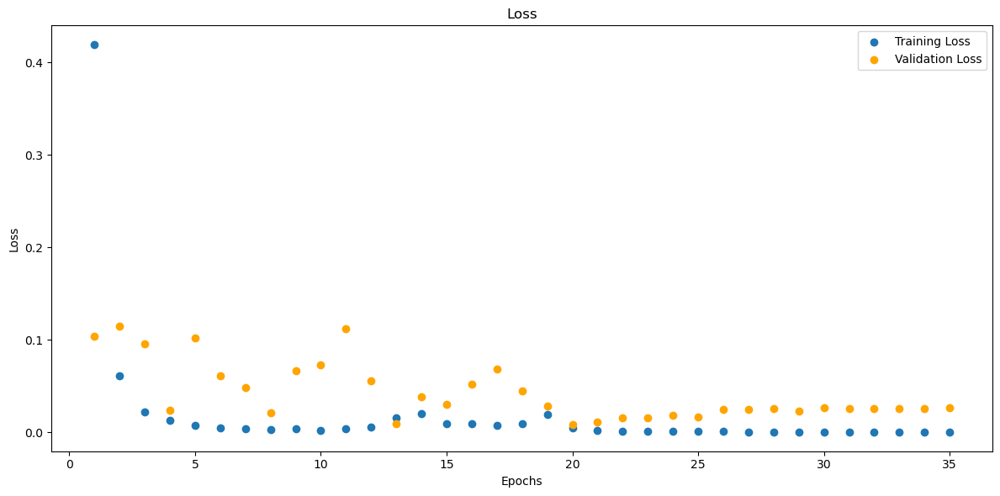

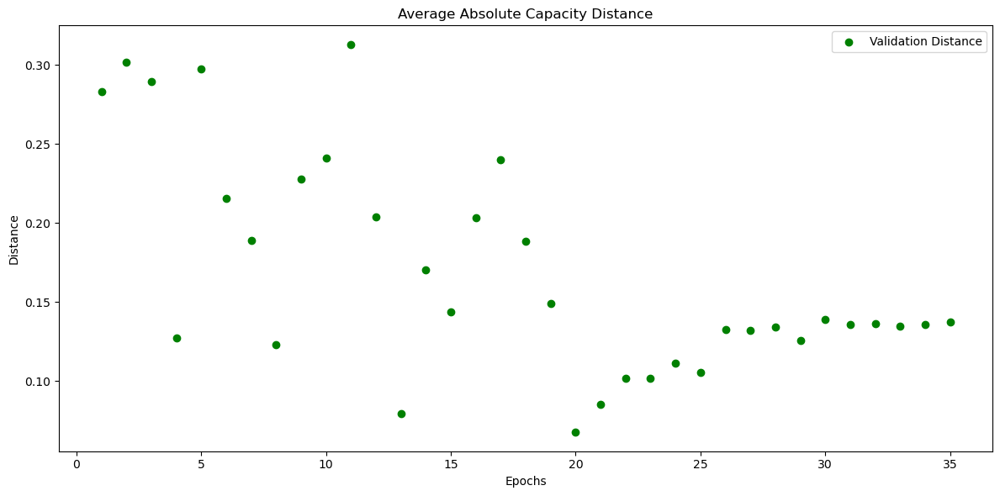

In [212]:
# B0005_combined_rob
model_B0005_combined_rob = CustomCNN(input_shape=input_shape_combined)
model_B0005_combined_rob, train_losses_B0005_combined_rob, val_losses_B0005_combined_rob, val_distances_B0005_combined_rob, metrics_history_B0005_combined_rob = train(data_loaders['B0005_combined_rob_val_loader'], data_loaders['B0005_combined_rob_train_loader'], model_B0005_combined_rob)
torch.save(model_B0005_combined_rob, os.path.join(folder_name, 'model_B0005_combined_rob.pth'))

Test Loss: 0.2756
Test Loss: 0.2756, Test Distance: 0.3542, Test Accuracy: 3.8462, SNR: 4.6902
##Metrics##:
MAE : 0.3536944091320038
MSE : 0.13790501654148102
RMSE : 0.6011237502098083
R-squared : -2698.234375
Count: 26


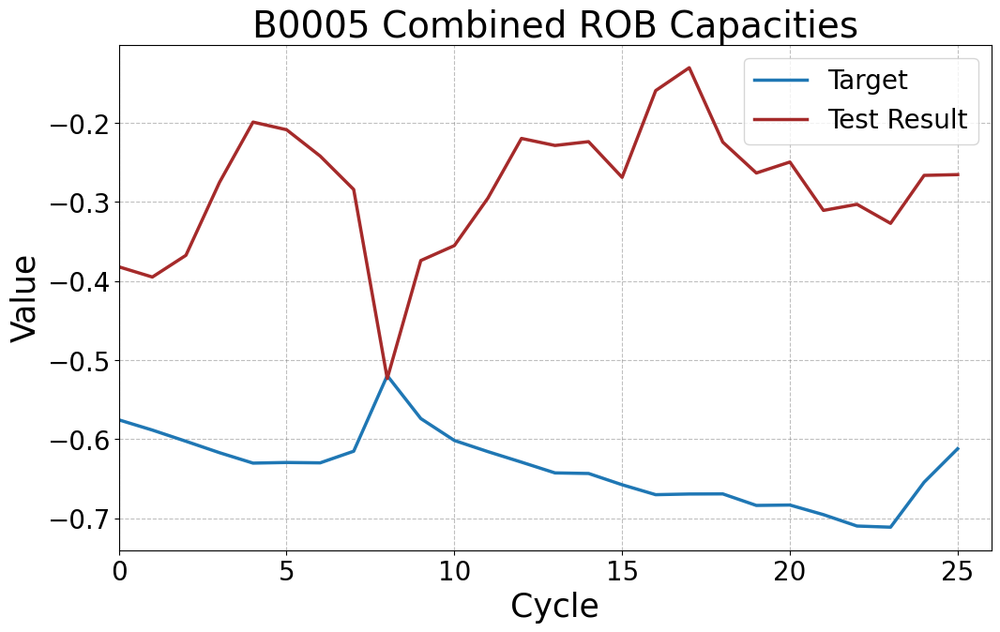

In [213]:
# B0005_combined_rob
model_B0005_combined_rob = torch.load('4. CNN Models/model_B0005_combined_rob.pth')
y_target_B0005_combined_rob, y_testresult_B0005_combined_rob = test(model_B0005_combined_rob, data_loaders['B0005_combined_rob_test_loader'])
y_target_B0005_combined_rob = flatten_and_concatenate(y_target_B0005_combined_rob)
y_testresult_B0005_combined_rob = flatten_and_concatenate(y_testresult_B0005_combined_rob)
plot_tensors(y_target_B0005_combined_rob, y_testresult_B0005_combined_rob, labels=["Target", "Test Result"], title="B0005 Combined ROB Capacities")


Test on complete dataset.

In [214]:
# Run the test on the model
y_target_B0005_combined_rob, y_testresult_B0005_combined_rob = test(model_B0005_combined_rob, data_loaders['B0005_combined_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_combined_rob = flatten_and_concatenate(y_target_B0005_combined_rob)
y_testresult_B0005_combined_rob = flatten_and_concatenate(y_testresult_B0005_combined_rob)

# # Assuming scaler_y_comb_B0005 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0005_combined_rob = scaler_y_comb_rob_B0005.inverse_transform(y_target_B0005_combined_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0005_combined_rob = scaler_y_comb_rob_B0005.inverse_transform(y_testresult_B0005_combined_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0005_combined_rob = torch.tensor(original_y_target_B0005_combined_rob)
# original_y_testresult_B0005_combined_rob = torch.tensor(original_y_testresult_B0005_combined_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0005_combined_rob, original_y_testresult_B0005_combined_rob, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_combined_rob", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


Test Loss: 0.0477
Test Loss: 0.0477, Test Distance: 0.0880, Test Accuracy: 19.0476, SNR: 10.2478
##Metrics##:
MAE : 0.08802618086338043
MSE : 0.02383812889456749
RMSE : 0.3046269714832306
R-squared : -275.5143737792969
Count: 168


SOH Plot.

In [215]:
# plot_soh(original_y_target_B0005_combined_rob, original_y_testresult_B0005_combined_rob, "State of Health Estimation for Battery B0005", file_name="B0005_combined_rob")

Model 10 - B0006 - MinMax Scaler - Charging Data

Epoch 1/120, Training Loss: 0.1746, Validation Loss: 0.0545
Validation Distance: 0.2275, Validation Accuracy: 0.0000, SNR: -6.4974
##Metrics##:
MAE : 0.1629982739686966
MSE : 0.037967830896377563
RMSE : 0.4043881595134735
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0286, Validation Loss: 0.0037
Validation Distance: 0.0514, Validation Accuracy: 8.0000, SNR: 4.5128
##Metrics##:
MAE : 0.03580635413527489
MSE : 0.0024864240549504757
RMSE : 0.19513580203056335
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0218, Validation Loss: 0.0042
Validation Distance: 0.0549, Validation Accuracy: 8.0000, SNR: 2.0028
##Metrics##:
MAE : 0.036913782358169556
MSE : 0.0025959755294024944
RMSE : 0.20046576857566833
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0205, Validation Loss: 0.0109
Validation Distance: 0.0887, Validation Accuracy: 0.0000, SNR: 24.6000
##Metrics##:
MAE : 0.06995464116334915
MSE : 0.008679007180035114
RMSE : 0.2675364315509796
R-squared : -inf
Count: 3

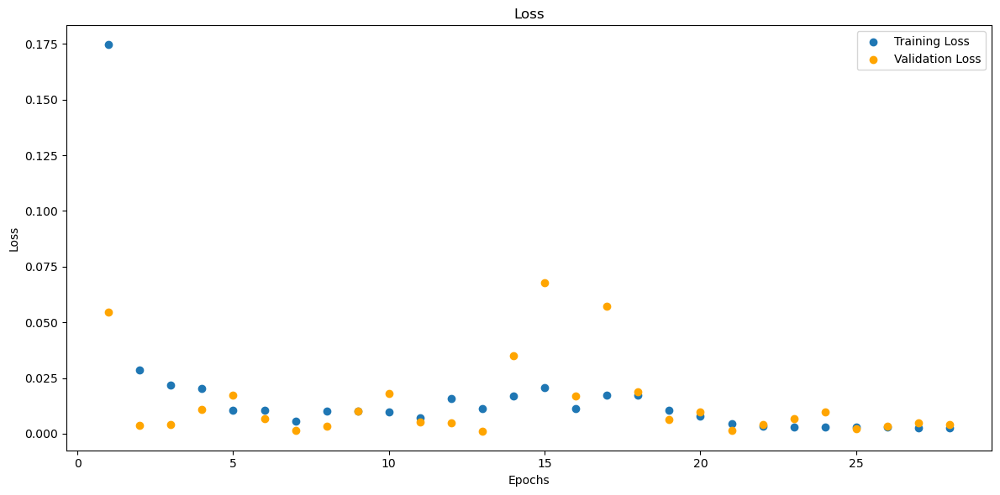

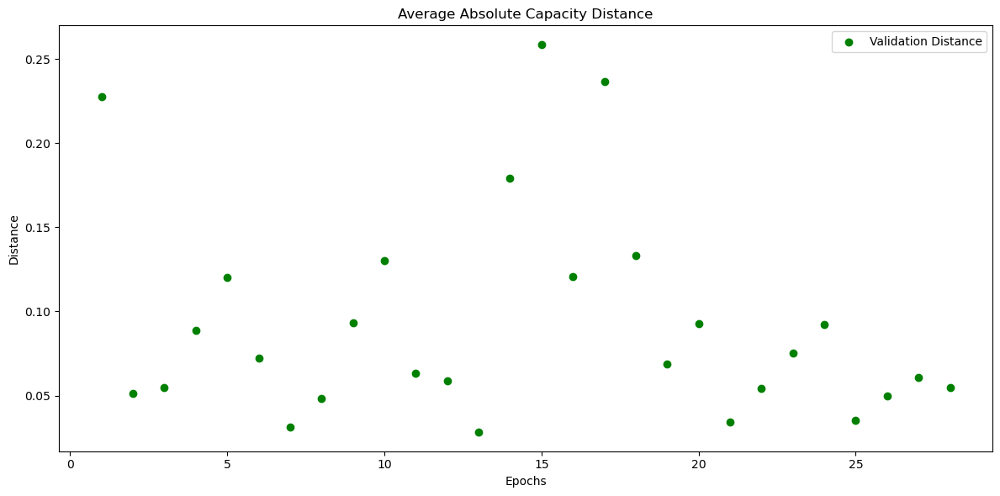

In [216]:
# B0006_charge_mm
model_B0006_charge_mm = CustomCNN(input_shape=input_shape_single)
model_B0006_charge_mm, train_losses_B0006_charge_mm, val_losses_B0006_charge_mm, val_distances_B0006_charge_mm, metrics_history_B0006_charge_mm = train(data_loaders['B0006_charge_mm_val_loader'], data_loaders['B0006_charge_mm_train_loader'], model_B0006_charge_mm)
torch.save(model_B0006_charge_mm, os.path.join(folder_name, 'model_B0006_charge_mm.pth'))

Test Loss: 0.0230
Test Loss: 0.0230, Test Distance: 0.0997, Test Accuracy: 0.0000, SNR: -1.5937
##Metrics##:
MAE : 0.09894242882728577
MSE : 0.011373721994459629
RMSE : 0.3167252242565155
R-squared : -454.5419616699219
Count: 26


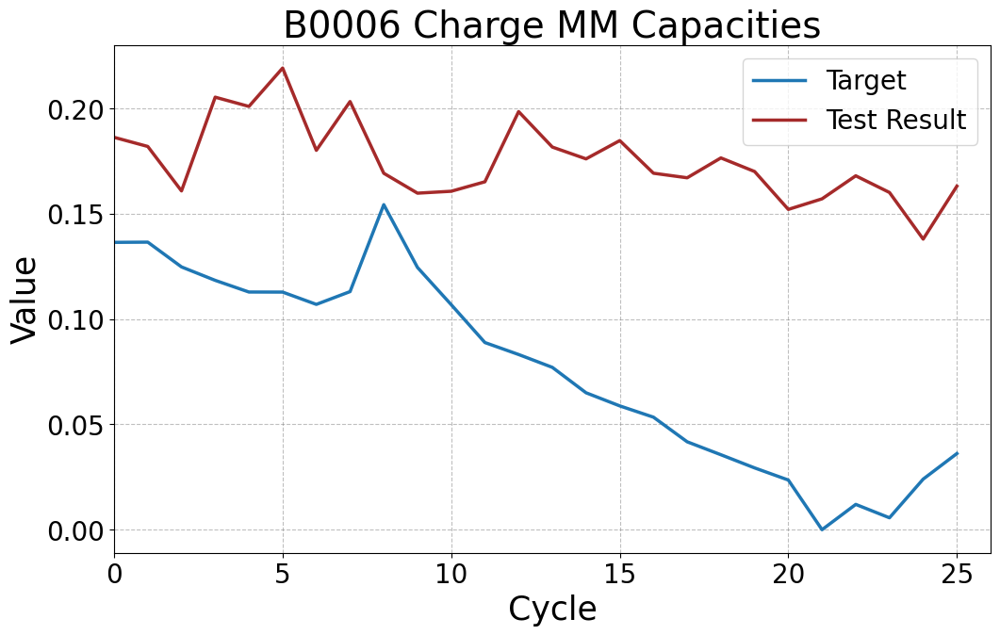

In [217]:
# B0006_charge_mm
model_B0006_charge_mm = torch.load('4. CNN Models/model_B0006_charge_mm.pth')
y_target_B0006_charge_mm, y_testresult_B0006_charge_mm = test(model_B0006_charge_mm, data_loaders['B0006_charge_mm_test_loader'])
y_target_B0006_charge_mm = flatten_and_concatenate(y_target_B0006_charge_mm)
y_testresult_B0006_charge_mm = flatten_and_concatenate(y_testresult_B0006_charge_mm)
plot_tensors(y_target_B0006_charge_mm, y_testresult_B0006_charge_mm, labels=["Target", "Test Result"], title="B0006 Charge MM Capacities")


Test on complete dataset.

Test Loss: 0.0209
Test Loss: 0.0209, Test Distance: 0.0697, Test Accuracy: 10.7143, SNR: 14.2792
##Metrics##:
MAE : 0.0697442814707756
MSE : 0.010454707778990269
RMSE : 0.27801015973091125
R-squared : -138.5966033935547
Count: 168


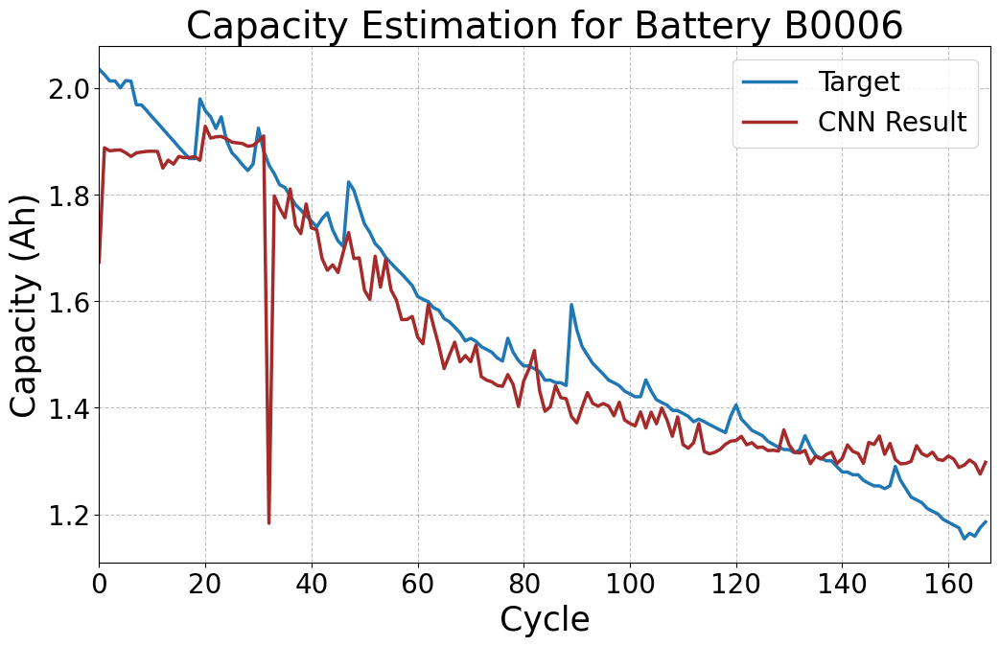

In [218]:
# Run the test on the model
y_target_B0006_charge_mm, y_testresult_B0006_charge_mm = test(model_B0006_charge_mm, data_loaders['B0006_charge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_charge_mm = flatten_and_concatenate(y_target_B0006_charge_mm)
y_testresult_B0006_charge_mm = flatten_and_concatenate(y_testresult_B0006_charge_mm)

# Assuming scaler_y_charge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_charge_mm = scaler_y_charge_mm_B0006.inverse_transform(y_target_B0006_charge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0006_charge_mm = scaler_y_charge_mm_B0006.inverse_transform(y_testresult_B0006_charge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_charge_mm = torch.tensor(original_y_target_B0006_charge_mm)
original_y_testresult_B0006_charge_mm = torch.tensor(original_y_testresult_B0006_charge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_charge_mm, original_y_testresult_B0006_charge_mm, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_charge_mm", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


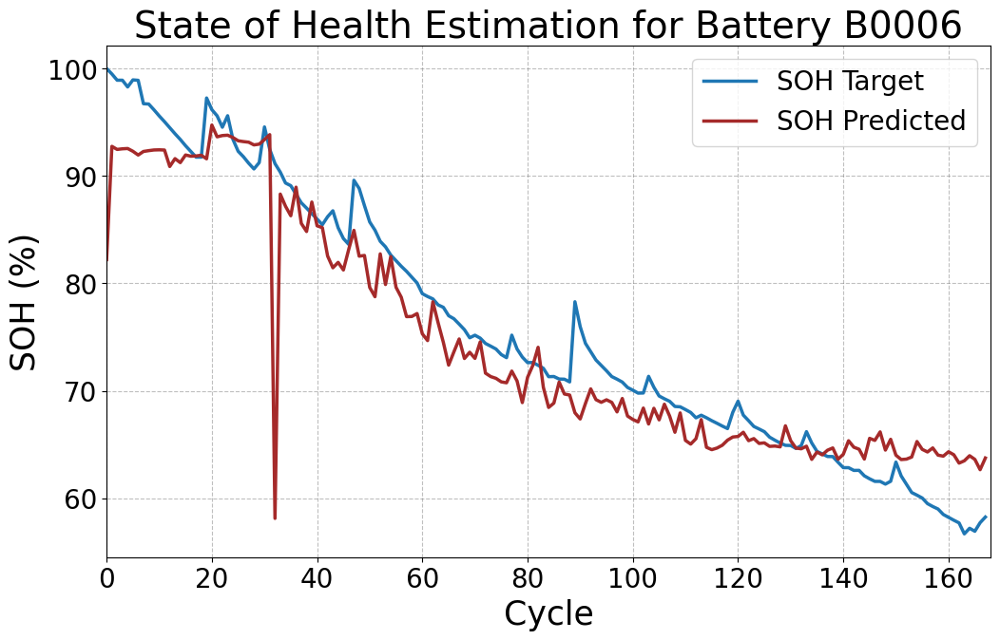

In [219]:
plot_soh(original_y_target_B0006_charge_mm, original_y_testresult_B0006_charge_mm, "State of Health Estimation for Battery B0006", file_name="B0006_charge_mm")

Model 11 - B0006 - Standard Scaler - Charging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.4780, Validation Loss: 0.2996
Validation Distance: 0.5216, Validation Accuracy: 0.0000, SNR: 2.9970
##Metrics##:
MAE : 0.36980336904525757
MSE : 0.20444008708000183
RMSE : 0.6103307604789734
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.1389, Validation Loss: 0.1828
Validation Distance: 0.3943, Validation Accuracy: 0.0000, SNR: 4.5047
##Metrics##:
MAE : 0.27579209208488464
MSE : 0.1215299740433693
RMSE : 0.5286593437194824
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0847, Validation Loss: 0.1202
Validation Distance: 0.3116, Validation Accuracy: 0.0000, SNR: 5.5951
##Metrics##:
MAE : 0.2145424485206604
MSE : 0.07702512294054031
RMSE : 0.47538691759109497
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0756, Validation Loss: 0.2721
Validation Distance: 0.4741, Validation Accuracy: 0.0000, SNR: 2.8197
##Metrics##:
MAE : 0.3311864137649536
MSE : 0.18122729659080505
RMSE : 0.5816947221755981
R-squared : -inf
Count: 34
Epoch 5/12

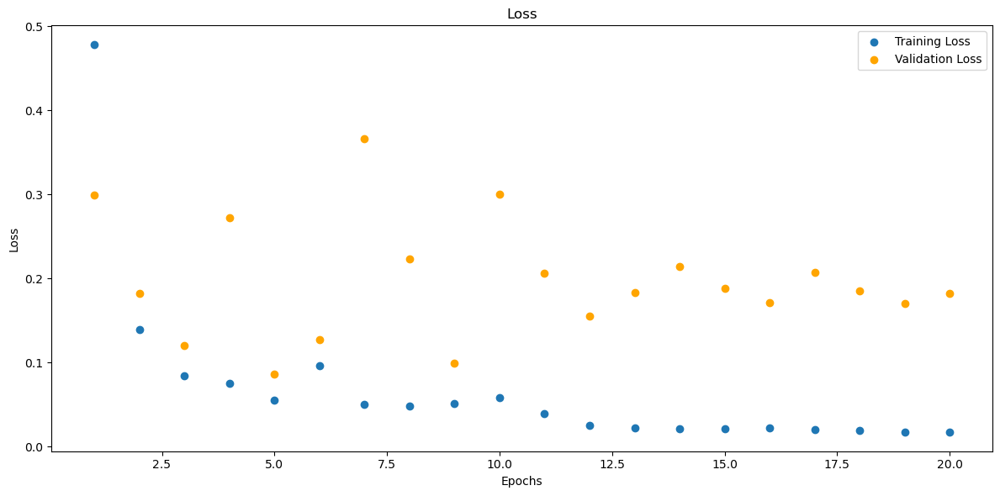

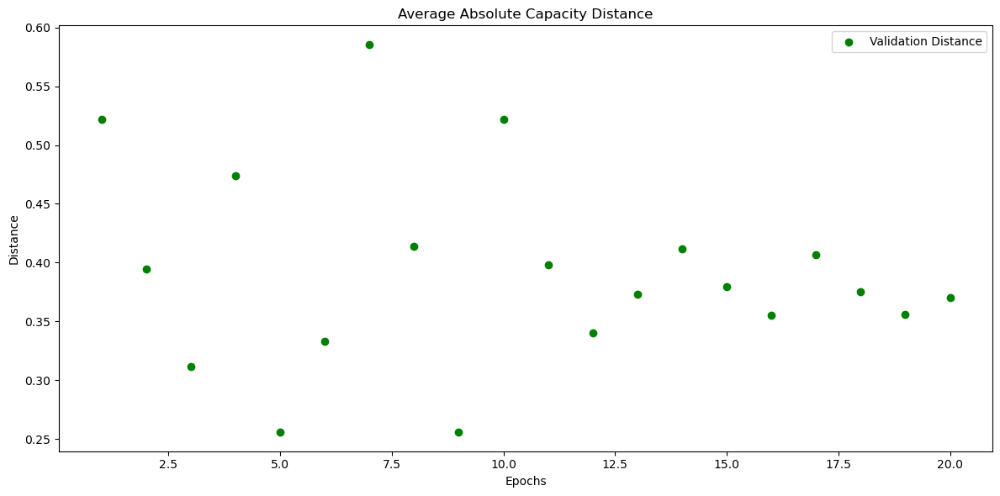

In [220]:
# B0006_charge_std
model_B0006_charge_std = CustomCNN(input_shape=input_shape_single)
model_B0006_charge_std, train_losses_B0006_charge_std, val_losses_B0006_charge_std, val_distances_B0006_charge_std, metrics_history_B0006_charge_std = train(data_loaders['B0006_charge_std_val_loader'], data_loaders['B0006_charge_std_train_loader'], model_B0006_charge_std)
torch.save(model_B0006_charge_std, os.path.join(folder_name, 'model_B0006_charge_std.pth'))

Test Loss: 1.8497
Test Loss: 1.8497, Test Distance: 0.9330, Test Accuracy: 0.0000, SNR: 2.7168
##Metrics##:
MAE : 0.9264096021652222
MSE : 0.9132573008537292
RMSE : 0.9656819105148315
R-squared : -2819.782958984375
Count: 26


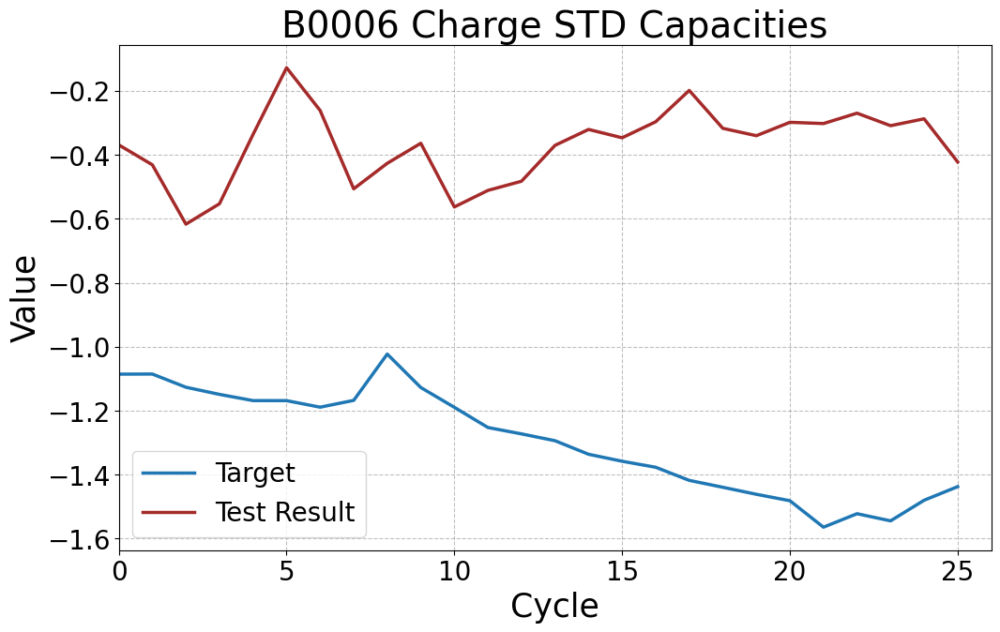

In [221]:
# B0006_charge_std
model_B0006_charge_std = torch.load('4. CNN Models/model_B0006_charge_std.pth')
y_target_B0006_charge_std, y_testresult_B0006_charge_std = test(model_B0006_charge_std, data_loaders['B0006_charge_std_test_loader'])
y_target_B0006_charge_std = flatten_and_concatenate(y_target_B0006_charge_std)
y_testresult_B0006_charge_std = flatten_and_concatenate(y_testresult_B0006_charge_std)
plot_tensors(y_target_B0006_charge_std, y_testresult_B0006_charge_std, labels=["Target", "Test Result"], title="B0006 Charge STD Capacities")


Test on complete dataset.

Test Loss: 0.3577
Test Loss: 0.3577, Test Distance: 0.2801, Test Accuracy: 2.9762, SNR: 7.4746
##Metrics##:
MAE : 0.2801003158092499
MSE : 0.17886927723884583
RMSE : 0.5412552952766418
R-squared : -534.3727416992188
Count: 168


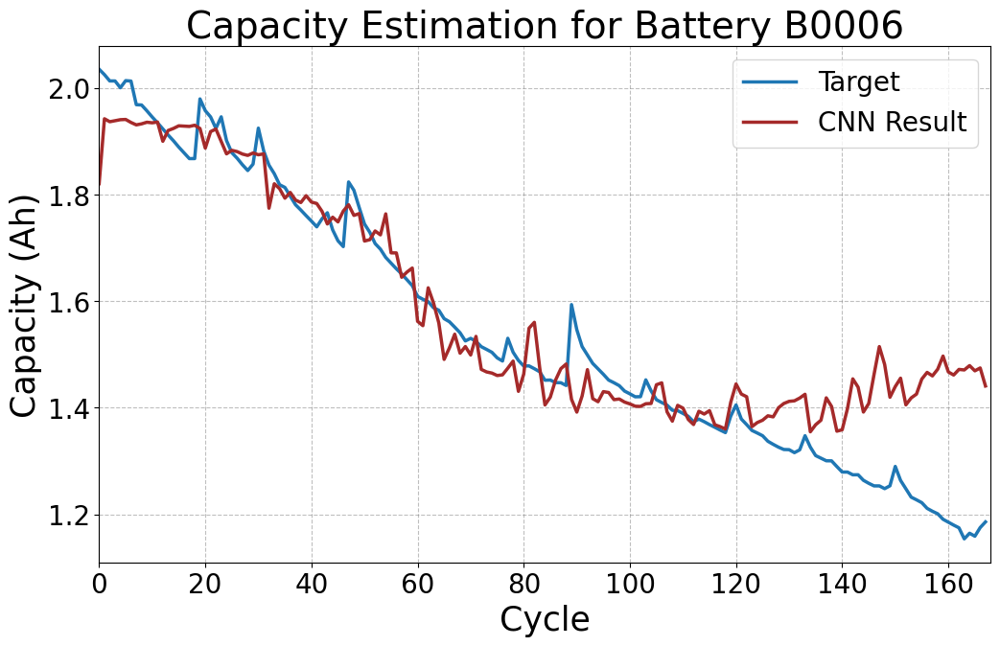

In [222]:
# Run the test on the model
y_target_B0006_charge_std, y_testresult_B0006_charge_std = test(model_B0006_charge_std, data_loaders['B0006_charge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_charge_std = flatten_and_concatenate(y_target_B0006_charge_std)
y_testresult_B0006_charge_std = flatten_and_concatenate(y_testresult_B0006_charge_std)

# Assuming scaler_y_charge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_charge_std = scaler_y_charge_std_B0006.inverse_transform(y_target_B0006_charge_std.numpy().reshape(-1, 1))
original_y_testresult_B0006_charge_std = scaler_y_charge_std_B0006.inverse_transform(y_testresult_B0006_charge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_charge_std = torch.tensor(original_y_target_B0006_charge_std)
original_y_testresult_B0006_charge_std = torch.tensor(original_y_testresult_B0006_charge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_charge_std, original_y_testresult_B0006_charge_std, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_charge_std", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


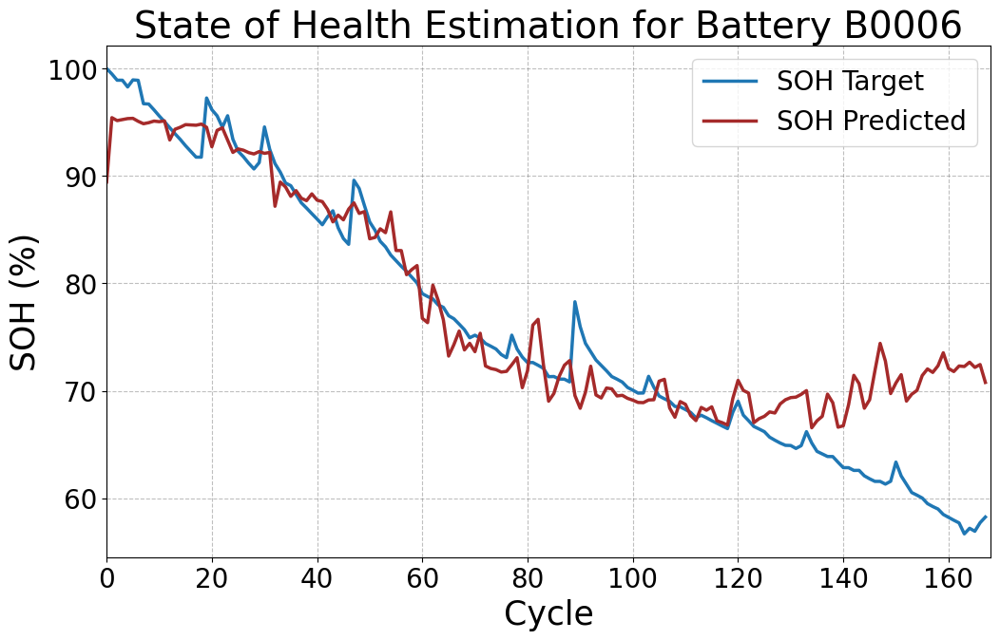

In [223]:
plot_soh(original_y_target_B0006_charge_std, original_y_testresult_B0006_charge_std, "State of Health Estimation for Battery B0006", file_name="B0006_charge_std")

Model 12 - B0006 - Robust Scaler - Charging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1828, Validation Loss: 0.1946
Validation Distance: 0.3904, Validation Accuracy: 0.0000, SNR: -1.6443
##Metrics##:
MAE : 0.27513840794563293
MSE : 0.1338166743516922
RMSE : 0.5359736084938049
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0317, Validation Loss: 0.0802
Validation Distance: 0.2440, Validation Accuracy: 0.0000, SNR: 1.2510
##Metrics##:
MAE : 0.16878348588943481
MSE : 0.05302504822611809
RMSE : 0.41883090138435364
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0385, Validation Loss: 0.2742
Validation Distance: 0.5079, Validation Accuracy: 0.0000, SNR: -2.4903
##Metrics##:
MAE : 0.36485666036605835
MSE : 0.19256925582885742
RMSE : 0.6057693362236023
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0281, Validation Loss: 0.0656
Validation Distance: 0.2352, Validation Accuracy: 0.0000, SNR: 2.0892
##Metrics##:
MAE : 0.1640297919511795
MSE : 0.04334418848156929
RMSE : 0.40899357199668884
R-squared : -inf
Count: 34
Epoch 

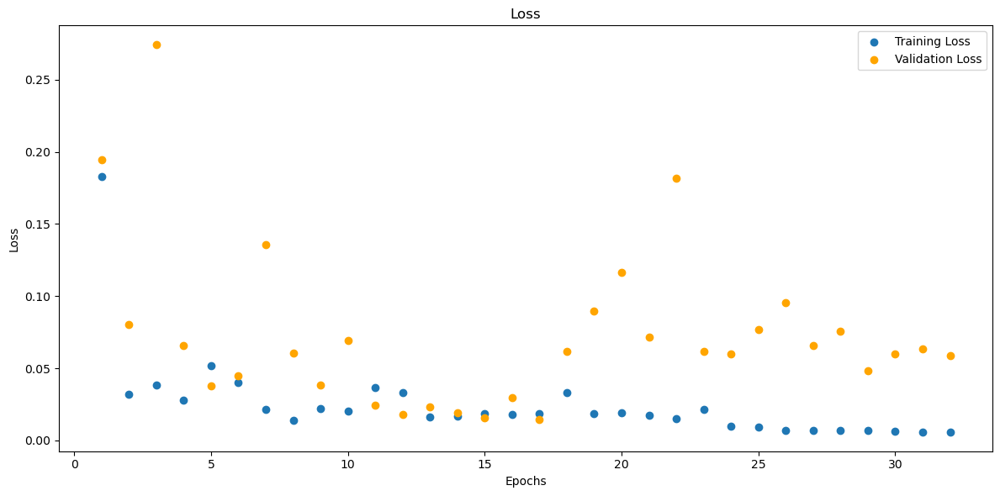

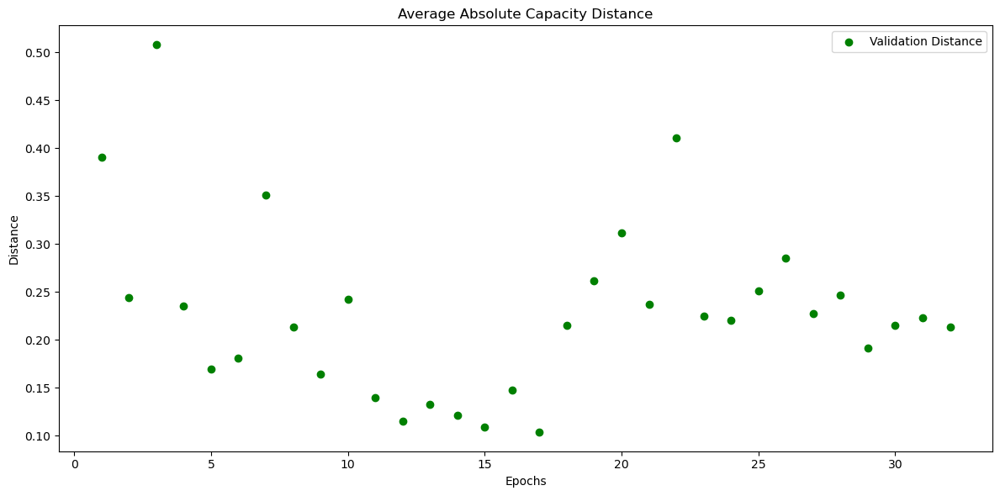

In [224]:
# B0006_charge_rob
model_B0006_charge_rob = CustomCNN(input_shape=input_shape_single)
model_B0006_charge_rob, train_losses_B0006_charge_rob, val_losses_B0006_charge_rob, val_distances_B0006_charge_rob, metrics_history_B0006_charge_rob = train(data_loaders['B0006_charge_rob_val_loader'], data_loaders['B0006_charge_rob_train_loader'], model_B0006_charge_rob)
torch.save(model_B0006_charge_rob, os.path.join(folder_name, 'model_B0006_charge_rob.pth'))

Test Loss: 0.3833
Test Loss: 0.3833, Test Distance: 0.4165, Test Accuracy: 0.0000, SNR: 3.3274
##Metrics##:
MAE : 0.4125528037548065
MSE : 0.18861760199069977
RMSE : 0.6457462310791016
R-squared : -1600.9010009765625
Count: 26


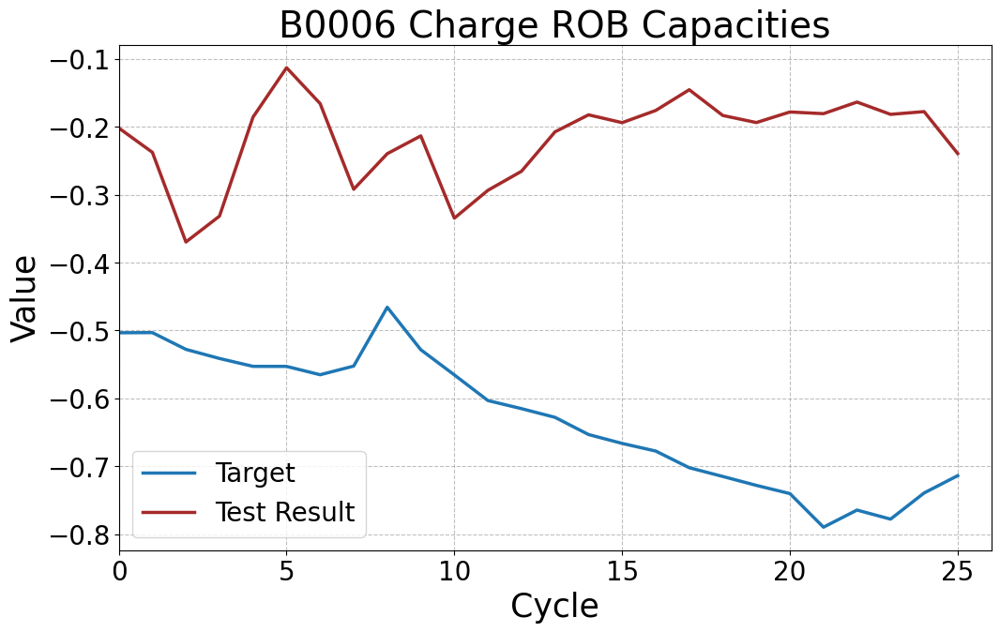

In [225]:
# B0006_charge_rob
model_B0006_charge_rob = torch.load('4. CNN Models/model_B0006_charge_rob.pth')
y_target_B0006_charge_rob, y_testresult_B0006_charge_rob = test(model_B0006_charge_rob, data_loaders['B0006_charge_rob_test_loader'])
y_target_B0006_charge_rob = flatten_and_concatenate(y_target_B0006_charge_rob)
y_testresult_B0006_charge_rob = flatten_and_concatenate(y_testresult_B0006_charge_rob)
plot_tensors(y_target_B0006_charge_rob, y_testresult_B0006_charge_rob, labels=["Target", "Test Result"], title="B0006 Charge ROB Capacities")


Test on complete dataset.

In [226]:
# Run the test on the model
y_target_B0006_charge_rob, y_testresult_B0006_charge_rob = test(model_B0006_charge_rob, data_loaders['B0006_charge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_charge_rob = flatten_and_concatenate(y_target_B0006_charge_rob)
y_testresult_B0006_charge_rob = flatten_and_concatenate(y_testresult_B0006_charge_rob)

# # Assuming scaler_y_charge_B0006 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0006_charge_rob = scaler_y_charge_rob_B0006.inverse_transform(y_target_B0006_charge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0006_charge_rob = scaler_y_charge_rob_B0006.inverse_transform(y_testresult_B0006_charge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0006_charge_rob = torch.tensor(original_y_target_B0006_charge_rob)
# original_y_testresult_B0006_charge_rob = torch.tensor(original_y_testresult_B0006_charge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0006_charge_rob, original_y_testresult_B0006_charge_rob, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_charge_rob", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


Test Loss: 0.1143
Test Loss: 0.1143, Test Distance: 0.1963, Test Accuracy: 2.3810, SNR: 8.2240
##Metrics##:
MAE : 0.19633159041404724
MSE : 0.05716622993350029
RMSE : 0.4525426924228668
R-squared : -356.124755859375
Count: 168


SOH Plot.

In [227]:
# plot_soh(original_y_target_B0006_charge_rob, original_y_testresult_B0006_charge_rob, "State of Health Estimation for Battery B0006", file_name="B0006_charge_rob")

Model 13 - B0006 - MinMax Scaler - Discharging Data

Epoch 1/120, Training Loss: 0.2470, Validation Loss: 0.0200
Validation Distance: 0.1102, Validation Accuracy: 0.0000, SNR: 6.5014
##Metrics##:
MAE : 0.08353432267904282
MSE : 0.015613921917974949
RMSE : 0.29438093304634094
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0313, Validation Loss: 0.0380
Validation Distance: 0.1854, Validation Accuracy: 0.0000, SNR: -4.1643
##Metrics##:
MAE : 0.13371601700782776
MSE : 0.02705315500497818
RMSE : 0.3686053156852722
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0060, Validation Loss: 0.0339
Validation Distance: 0.1777, Validation Accuracy: 0.0000, SNR: -3.2311
##Metrics##:
MAE : 0.1290026605129242
MSE : 0.02439701370894909
RMSE : 0.3610551059246063
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0022, Validation Loss: 0.0061
Validation Distance: 0.0728, Validation Accuracy: 0.0000, SNR: 4.8801
##Metrics##:
MAE : 0.05300358310341835
MSE : 0.0044451989233493805
RMSE : 0.23248571157455444
R-squared : -inf
Count: 34
Ep

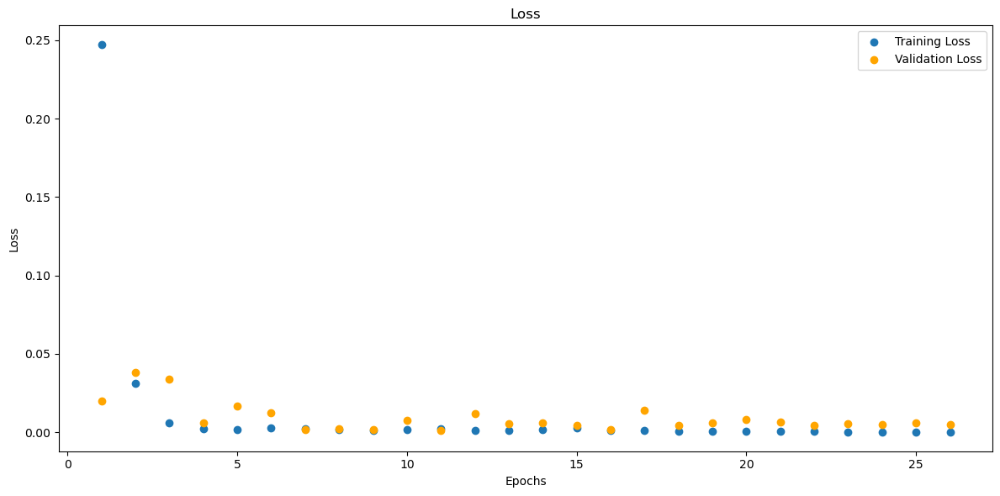

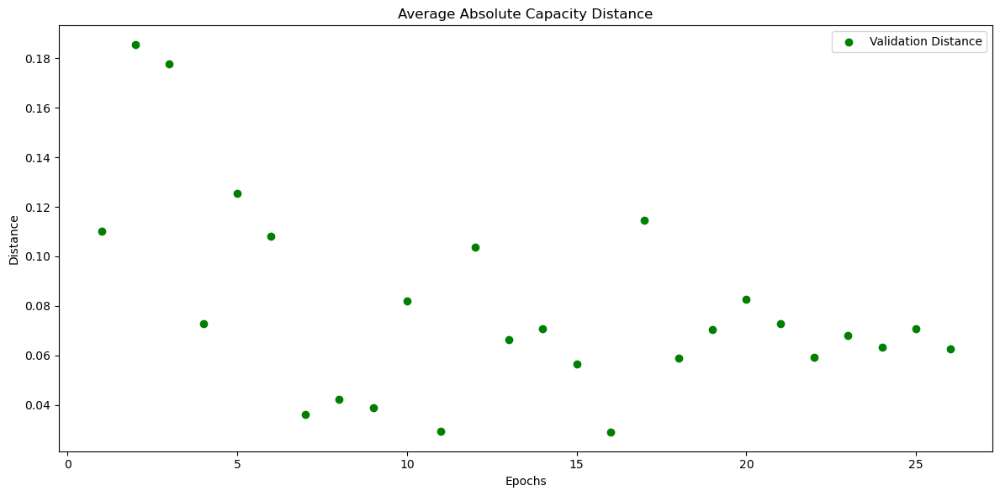

In [228]:
# B0006_discharge_mm
model_B0006_discharge_mm = CustomCNN(input_shape=input_shape_single)
model_B0006_discharge_mm, train_losses_B0006_discharge_mm, val_losses_B0006_discharge_mm, val_distances_B0006_discharge_mm, metrics_history_B0006_discharge_mm = train(data_loaders['B0006_discharge_mm_val_loader'], data_loaders['B0006_discharge_mm_train_loader'], model_B0006_discharge_mm)
torch.save(model_B0006_discharge_mm, os.path.join(folder_name, 'model_B0006_discharge_mm.pth'))

Test Loss: 0.0208
Test Loss: 0.0208, Test Distance: 0.0950, Test Accuracy: 0.0000, SNR: -1.0556
##Metrics##:
MAE : 0.09332275390625
MSE : 0.010048202238976955
RMSE : 0.30628979206085205
R-squared : -339.1145324707031
Count: 26


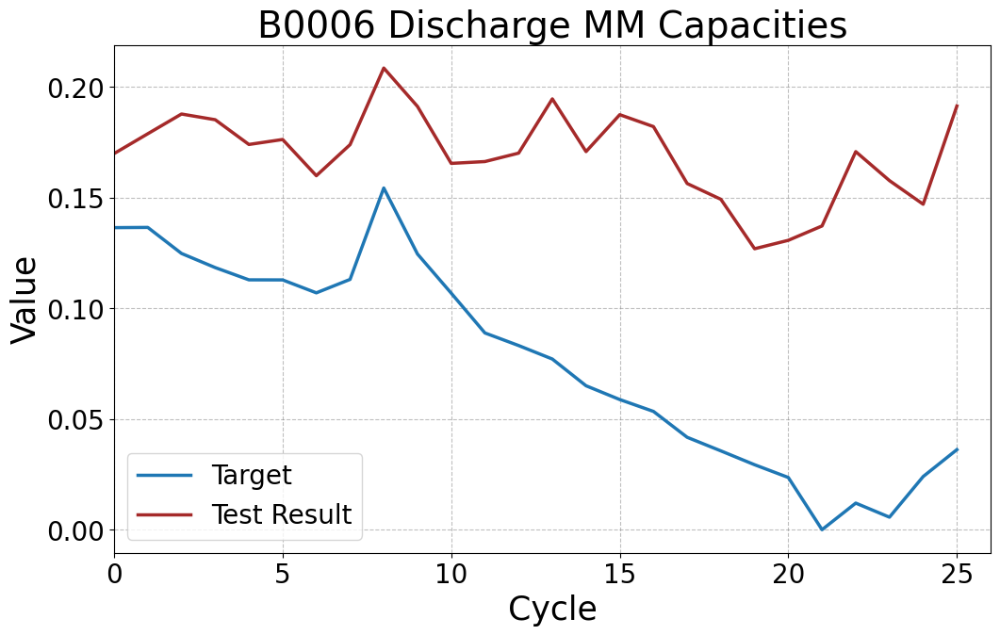

In [229]:
# B0006_discharge_mm
model_B0006_discharge_mm = torch.load('4. CNN Models/model_B0006_discharge_mm.pth')
y_target_B0006_discharge_mm, y_testresult_B0006_discharge_mm = test(model_B0006_discharge_mm, data_loaders['B0006_discharge_mm_test_loader'])
y_target_B0006_discharge_mm = flatten_and_concatenate(y_target_B0006_discharge_mm)
y_testresult_B0006_discharge_mm = flatten_and_concatenate(y_testresult_B0006_discharge_mm)
plot_tensors(y_target_B0006_discharge_mm, y_testresult_B0006_discharge_mm, labels=["Target", "Test Result"], title="B0006 Discharge MM Capacities")


Test on complete dataset.

Test Loss: 0.0052
Test Loss: 0.0052, Test Distance: 0.0392, Test Accuracy: 21.4286, SNR: 20.3309
##Metrics##:
MAE : 0.03915658965706825
MSE : 0.0025950446724891663
RMSE : 0.20277366042137146
R-squared : -74.18069458007812
Count: 168


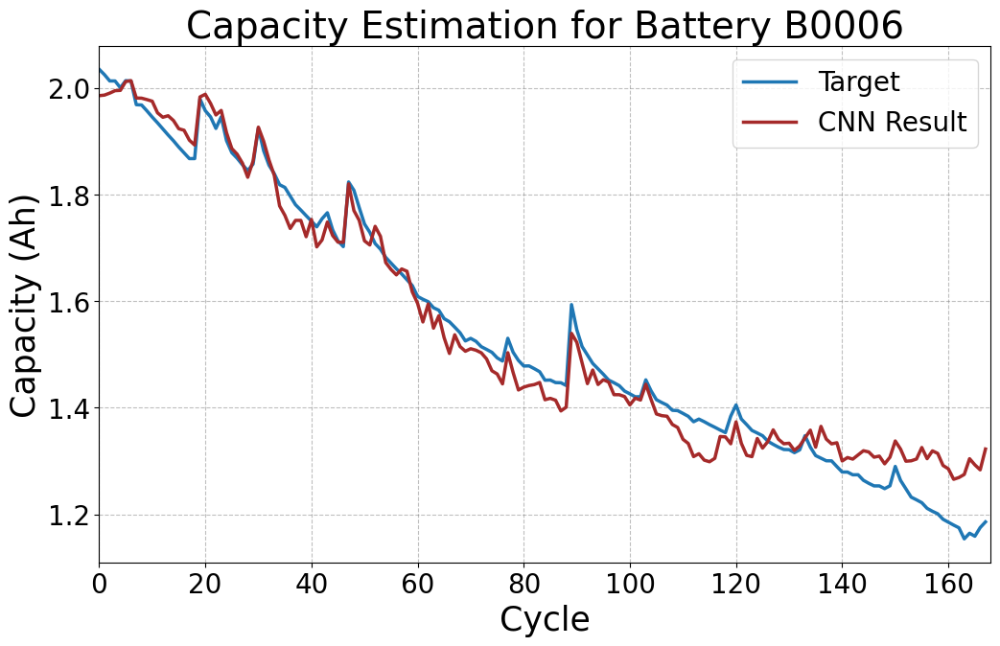

In [230]:
# Run the test on the model
y_target_B0006_discharge_mm, y_testresult_B0006_discharge_mm = test(model_B0006_discharge_mm, data_loaders['B0006_discharge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_discharge_mm = flatten_and_concatenate(y_target_B0006_discharge_mm)
y_testresult_B0006_discharge_mm = flatten_and_concatenate(y_testresult_B0006_discharge_mm)

# Assuming scaler_y_discharge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_discharge_mm = scaler_y_dis_mm_B0006.inverse_transform(y_target_B0006_discharge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0006_discharge_mm = scaler_y_dis_mm_B0006.inverse_transform(y_testresult_B0006_discharge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_discharge_mm = torch.tensor(original_y_target_B0006_discharge_mm)
original_y_testresult_B0006_discharge_mm = torch.tensor(original_y_testresult_B0006_discharge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_discharge_mm, original_y_testresult_B0006_discharge_mm, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_discharge_mm", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


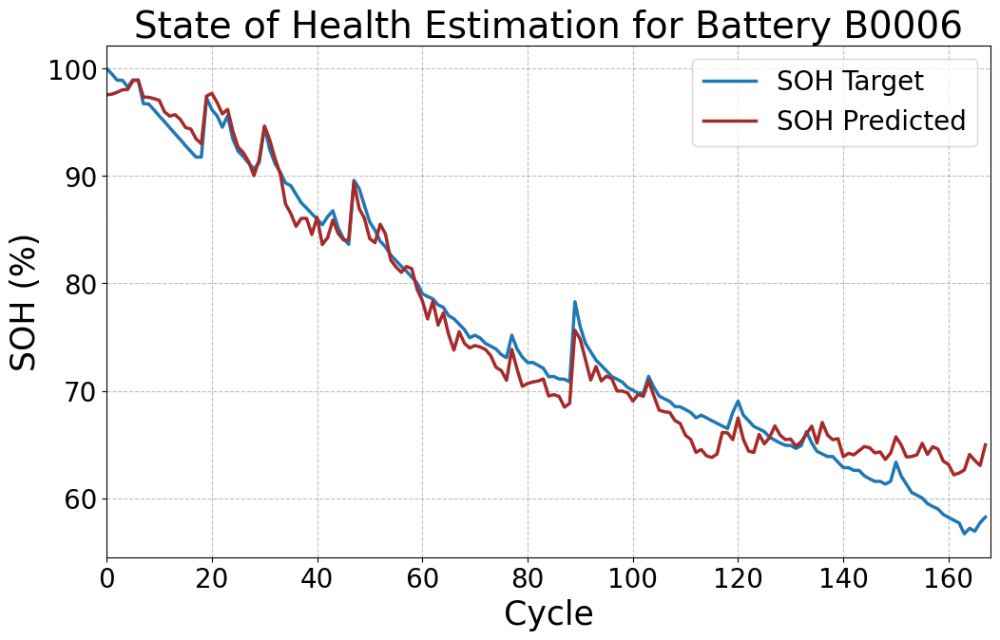

In [231]:
plot_soh(original_y_target_B0006_discharge_mm, original_y_testresult_B0006_discharge_mm, "State of Health Estimation for Battery B0006", file_name="B0006_discharge_mm")

Model 14 - B0006 - Standard Scaler - Discharging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.3201, Validation Loss: 0.0875
Validation Distance: 0.2053, Validation Accuracy: 20.0000, SNR: 3.7372
##Metrics##:
MAE : 0.12229011952877045
MSE : 0.0412396676838398
RMSE : 0.36573562026023865
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.1566, Validation Loss: 0.1329
Validation Distance: 0.2946, Validation Accuracy: 12.0000, SNR: 7.5201
##Metrics##:
MAE : 0.20755398273468018
MSE : 0.09372039139270782
RMSE : 0.473153680562973
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0816, Validation Loss: 0.2252
Validation Distance: 0.4057, Validation Accuracy: 4.0000, SNR: 1.9329
##Metrics##:
MAE : 0.2720404267311096
MSE : 0.13605520129203796
RMSE : 0.5275802612304688
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0183, Validation Loss: 0.1224
Validation Distance: 0.2842, Validation Accuracy: 8.0000, SNR: 4.2928
##Metrics##:
MAE : 0.18743161857128143
MSE : 0.07233799993991852
RMSE : 0.4435037672519684
R-squared : -inf
Count: 34
Epoch 5/

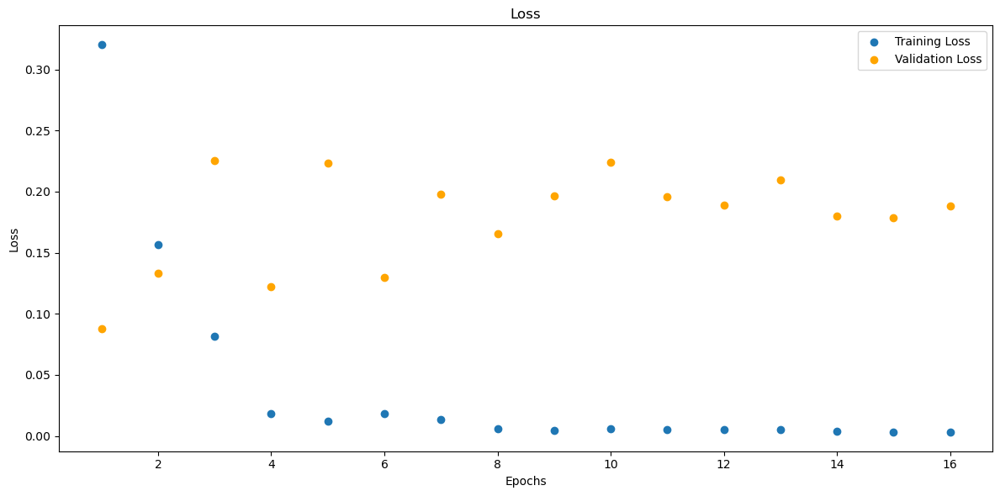

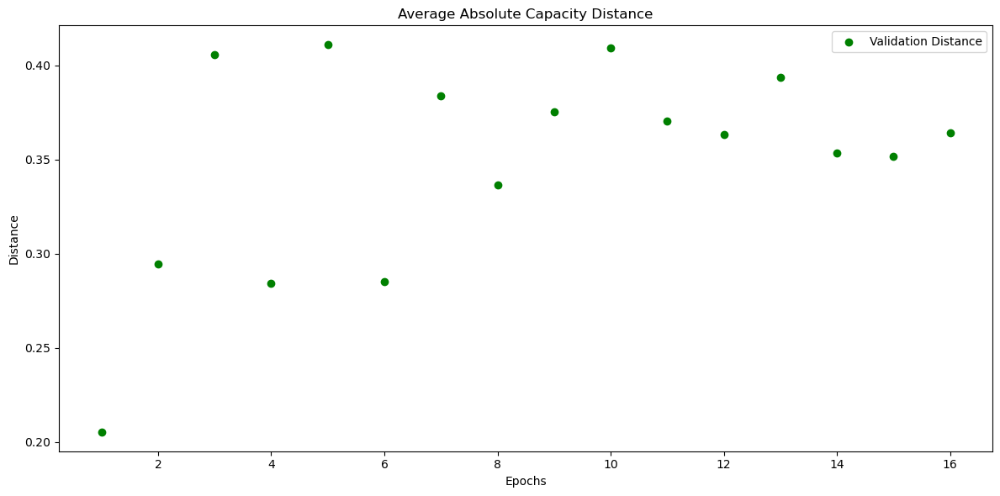

In [232]:
# B0006_discharge_std
model_B0006_discharge_std = CustomCNN(input_shape=input_shape_single)
model_B0006_discharge_std, train_losses_B0006_discharge_std, val_losses_B0006_discharge_std, val_distances_B0006_discharge_std, metrics_history_B0006_discharge_std = train(data_loaders['B0006_discharge_std_val_loader'], data_loaders['B0006_discharge_std_train_loader'], model_B0006_discharge_std)
torch.save(model_B0006_discharge_std, os.path.join(folder_name, 'model_B0006_discharge_std.pth'))

Test Loss: 1.0750
Test Loss: 1.0750, Test Distance: 0.7179, Test Accuracy: 0.0000, SNR: 5.0320
##Metrics##:
MAE : 0.7162902355194092
MSE : 0.5358856916427612
RMSE : 0.8517917990684509
R-squared : -1901.555908203125
Count: 26


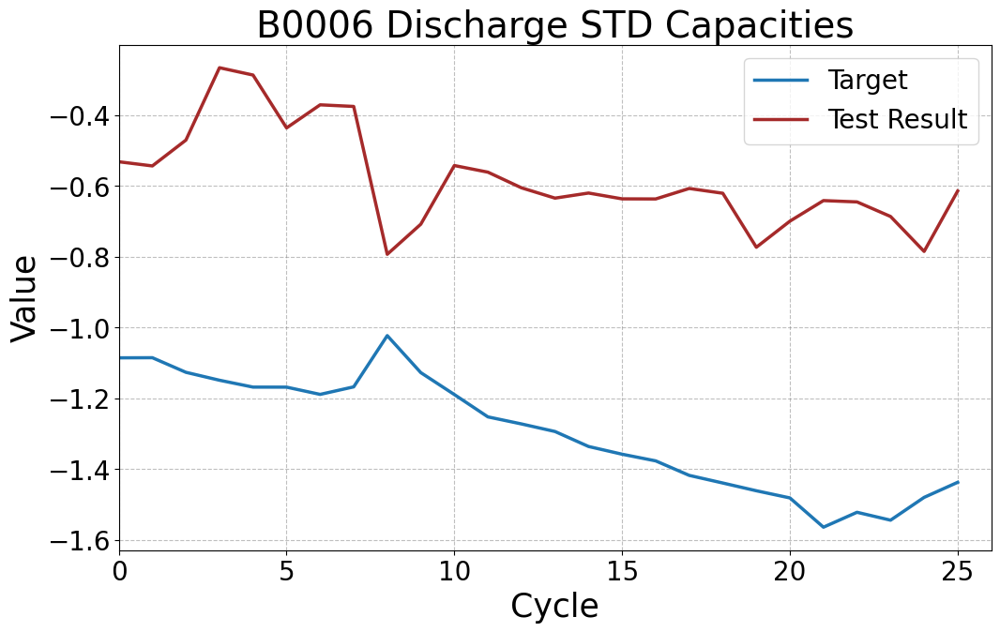

In [233]:
# B0006_discharge_std
model_B0006_discharge_std = torch.load('4. CNN Models/model_B0006_discharge_std.pth')
y_target_B0006_discharge_std, y_testresult_B0006_discharge_std = test(model_B0006_discharge_std, data_loaders['B0006_discharge_std_test_loader'])
y_target_B0006_discharge_std = flatten_and_concatenate(y_target_B0006_discharge_std)
y_testresult_B0006_discharge_std = flatten_and_concatenate(y_testresult_B0006_discharge_std)
plot_tensors(y_target_B0006_discharge_std, y_testresult_B0006_discharge_std, labels=["Target", "Test Result"], title="B0006 Discharge STD Capacities")


Test on complete dataset.

Test Loss: 0.3839
Test Loss: 0.3839, Test Distance: 0.3561, Test Accuracy: 6.5476, SNR: 7.1684
##Metrics##:
MAE : 0.3561283051967621
MSE : 0.19193671643733978
RMSE : 0.6064225435256958
R-squared : -469.5745544433594
Count: 168


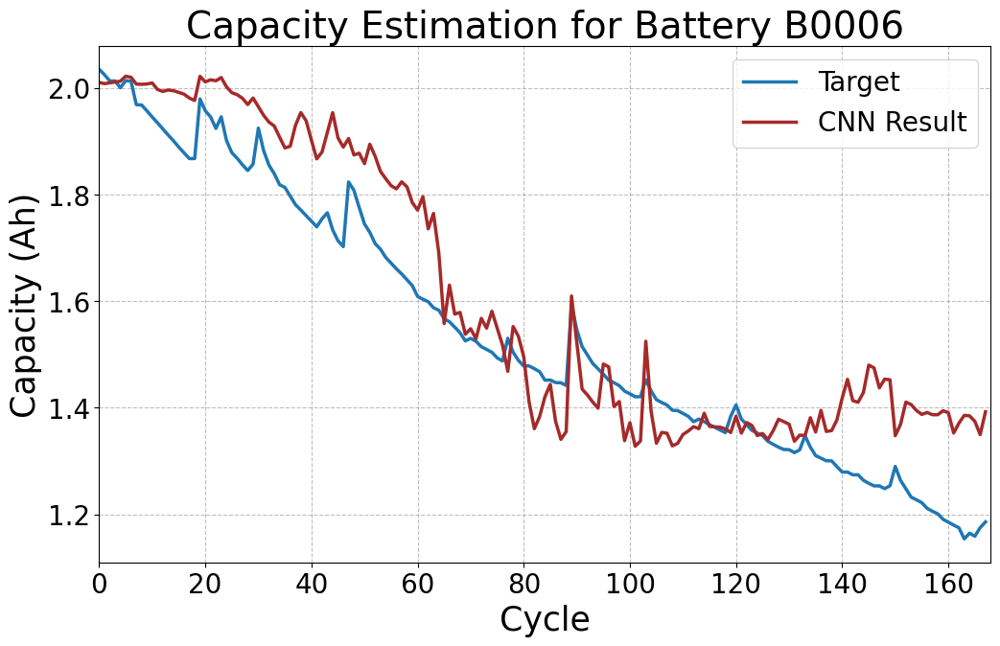

In [234]:
# Run the test on the model
y_target_B0006_discharge_std, y_testresult_B0006_discharge_std = test(model_B0006_discharge_std, data_loaders['B0006_discharge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_discharge_std = flatten_and_concatenate(y_target_B0006_discharge_std)
y_testresult_B0006_discharge_std = flatten_and_concatenate(y_testresult_B0006_discharge_std)

# Assuming scaler_y_discharge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_discharge_std = scaler_y_dis_std_B0006.inverse_transform(y_target_B0006_discharge_std.numpy().reshape(-1, 1))
original_y_testresult_B0006_discharge_std = scaler_y_dis_std_B0006.inverse_transform(y_testresult_B0006_discharge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_discharge_std = torch.tensor(original_y_target_B0006_discharge_std)
original_y_testresult_B0006_discharge_std = torch.tensor(original_y_testresult_B0006_discharge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_discharge_std, original_y_testresult_B0006_discharge_std, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_discharge_std", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


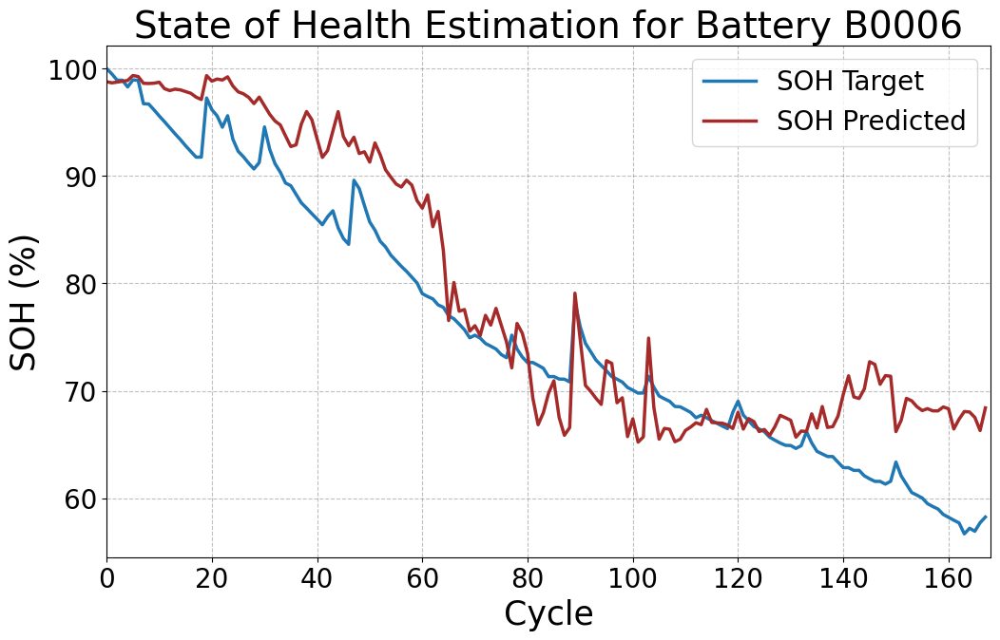

In [235]:
plot_soh(original_y_target_B0006_discharge_std, original_y_testresult_B0006_discharge_std, "State of Health Estimation for Battery B0006", file_name="B0006_discharge_std")

Model 15 - B0006 - Robust Scaler - Discharging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1204, Validation Loss: 0.2112
Validation Distance: 0.4286, Validation Accuracy: 0.0000, SNR: -0.6593
##Metrics##:
MAE : 0.3091943860054016
MSE : 0.15116360783576965
RMSE : 0.5610589385032654
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0509, Validation Loss: 0.0172
Validation Distance: 0.1027, Validation Accuracy: 4.0000, SNR: 24.4730
##Metrics##:
MAE : 0.07980404049158096
MSE : 0.013574492186307907
RMSE : 0.2924972474575043
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0239, Validation Loss: 0.0260
Validation Distance: 0.1393, Validation Accuracy: 0.0000, SNR: 13.3407
##Metrics##:
MAE : 0.1044020801782608
MSE : 0.020004257559776306
RMSE : 0.3316110670566559
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0215, Validation Loss: 0.1287
Validation Distance: 0.3519, Validation Accuracy: 0.0000, SNR: 3.6668
##Metrics##:
MAE : 0.2604900896549225
MSE : 0.09614212065935135
RMSE : 0.5113582611083984
R-squared : -inf
Count: 34
Epoch 

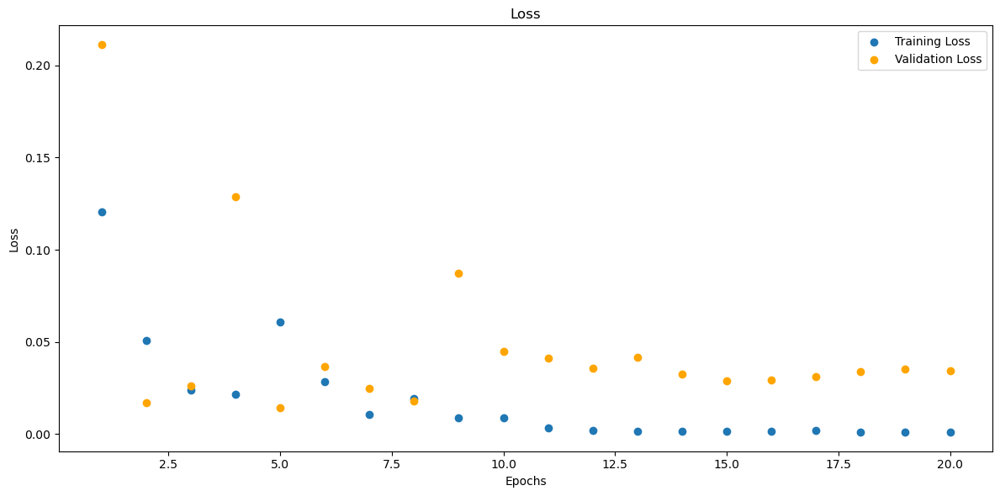

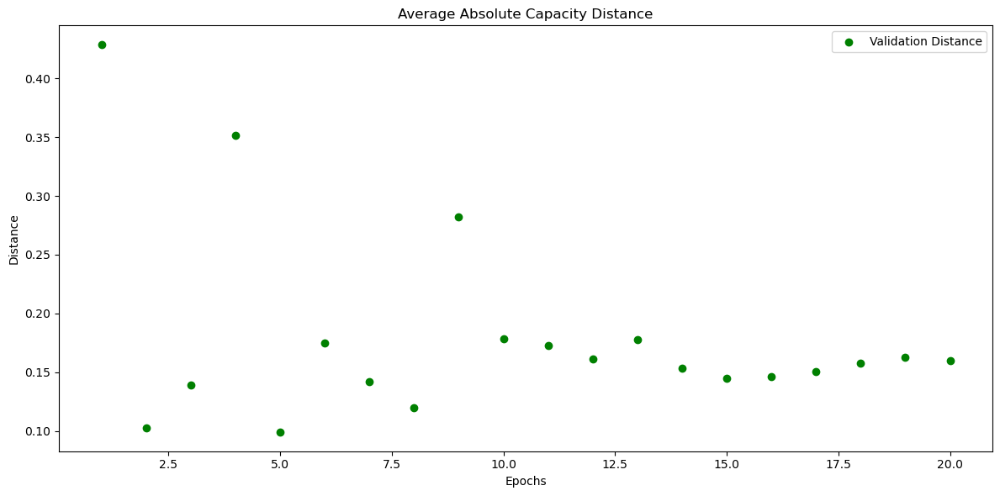

In [236]:
# B0006_discharge_rob
model_B0006_discharge_rob = CustomCNN(input_shape=input_shape_single)
model_B0006_discharge_rob, train_losses_B0006_discharge_rob, val_losses_B0006_discharge_rob, val_distances_B0006_discharge_rob, metrics_history_B0006_discharge_rob = train(data_loaders['B0006_discharge_rob_val_loader'], data_loaders['B0006_discharge_rob_train_loader'], model_B0006_discharge_rob)
torch.save(model_B0006_discharge_rob, os.path.join(folder_name, 'model_B0006_discharge_rob.pth'))

Test Loss: 0.1480
Test Loss: 0.1480, Test Distance: 0.2355, Test Accuracy: 11.5385, SNR: 7.5129
##Metrics##:
MAE : 0.23081108927726746
MSE : 0.07195089757442474
RMSE : 0.4883052408695221
R-squared : -534.852783203125
Count: 26


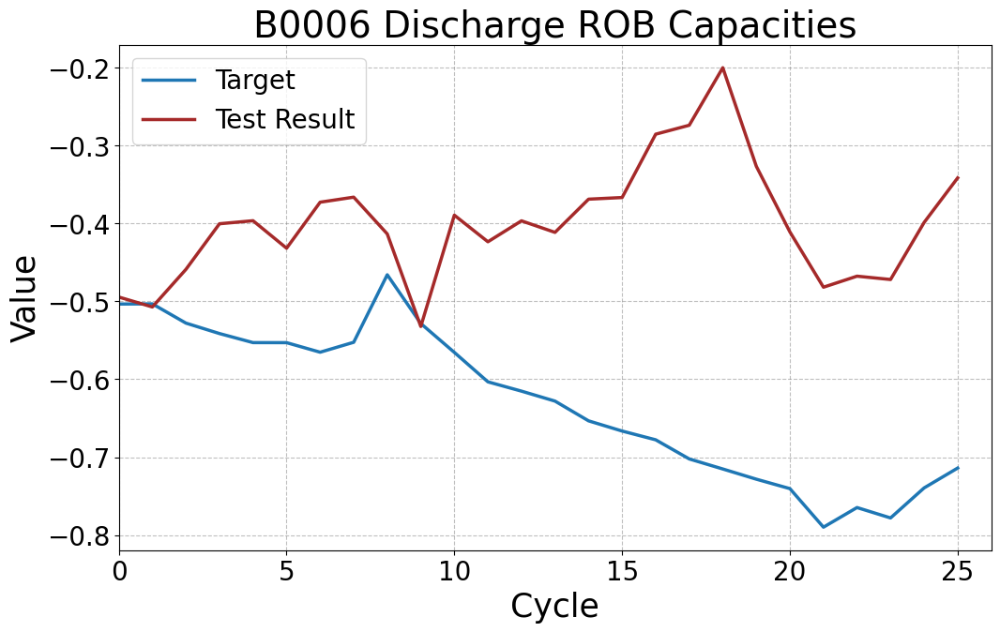

In [237]:
# B0006_discharge_rob
model_B0006_discharge_rob = torch.load('4. CNN Models/model_B0006_discharge_rob.pth')
y_target_B0006_discharge_rob, y_testresult_B0006_discharge_rob = test(model_B0006_discharge_rob, data_loaders['B0006_discharge_rob_test_loader'])
y_target_B0006_discharge_rob = flatten_and_concatenate(y_target_B0006_discharge_rob)
y_testresult_B0006_discharge_rob = flatten_and_concatenate(y_testresult_B0006_discharge_rob)
plot_tensors(y_target_B0006_discharge_rob, y_testresult_B0006_discharge_rob, labels=["Target", "Test Result"], title="B0006 Discharge ROB Capacities")


Test on complete dataset.

In [238]:
# Run the test on the model
y_target_B0006_discharge_rob, y_testresult_B0006_discharge_rob = test(model_B0006_discharge_rob, data_loaders['B0006_discharge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_discharge_rob = flatten_and_concatenate(y_target_B0006_discharge_rob)
y_testresult_B0006_discharge_rob = flatten_and_concatenate(y_testresult_B0006_discharge_rob)

# # Assuming scaler_y_discharge_B0006 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0006_discharge_rob = scaler_y_dis_rob_B0006.inverse_transform(y_target_B0006_discharge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0006_discharge_rob = scaler_y_dis_rob_B0006.inverse_transform(y_testresult_B0006_discharge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0006_discharge_rob = torch.tensor(original_y_target_B0006_discharge_rob)
# original_y_testresult_B0006_discharge_rob = torch.tensor(original_y_testresult_B0006_discharge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0006_discharge_rob, original_y_testresult_B0006_discharge_rob, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_discharge_rob", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


Test Loss: 0.0803
Test Loss: 0.0803, Test Distance: 0.1730, Test Accuracy: 4.1667, SNR: 9.7569
##Metrics##:
MAE : 0.17297959327697754
MSE : 0.04016552492976189
RMSE : 0.42221787571907043
R-squared : -241.44387817382812
Count: 168


SOH Plot.

In [239]:
# plot_soh(original_y_target_B0006_discharge_rob, original_y_testresult_B0006_discharge_rob, "State of Health Estimation for Battery B0006", file_name="B0006_discharge_rob")

Model 16 - B0006 - MinMax Scaler - Combined Data

Epoch 1/120, Training Loss: 0.2965, Validation Loss: 0.2205
Validation Distance: 0.4676, Validation Accuracy: 0.0000, SNR: -11.8043
##Metrics##:
MAE : 0.33872365951538086
MSE : 0.15708938241004944
RMSE : 0.5821510553359985
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0419, Validation Loss: 0.0159
Validation Distance: 0.1220, Validation Accuracy: 0.0000, SNR: -1.4719
##Metrics##:
MAE : 0.08694986999034882
MSE : 0.010967225767672062
RMSE : 0.29704925417900085
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0034, Validation Loss: 0.0031
Validation Distance: 0.0459, Validation Accuracy: 16.0000, SNR: 3.2840
##Metrics##:
MAE : 0.030706774443387985
MSE : 0.0019376324489712715
RMSE : 0.18228007853031158
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0040, Validation Loss: 0.0208
Validation Distance: 0.1395, Validation Accuracy: 0.0000, SNR: -2.8162
##Metrics##:
MAE : 0.09916851669549942
MSE : 0.014229829423129559
RMSE : 0.3161628842353821
R-squared : -inf
Count:

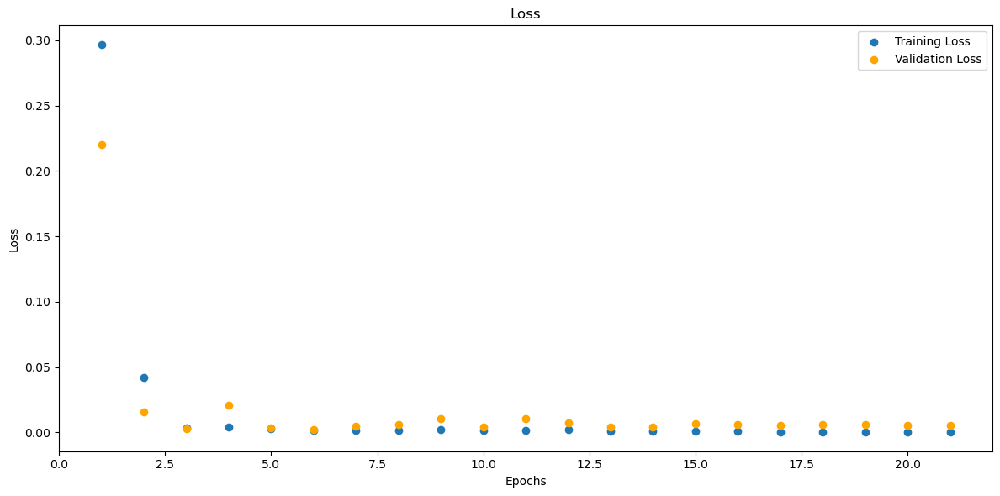

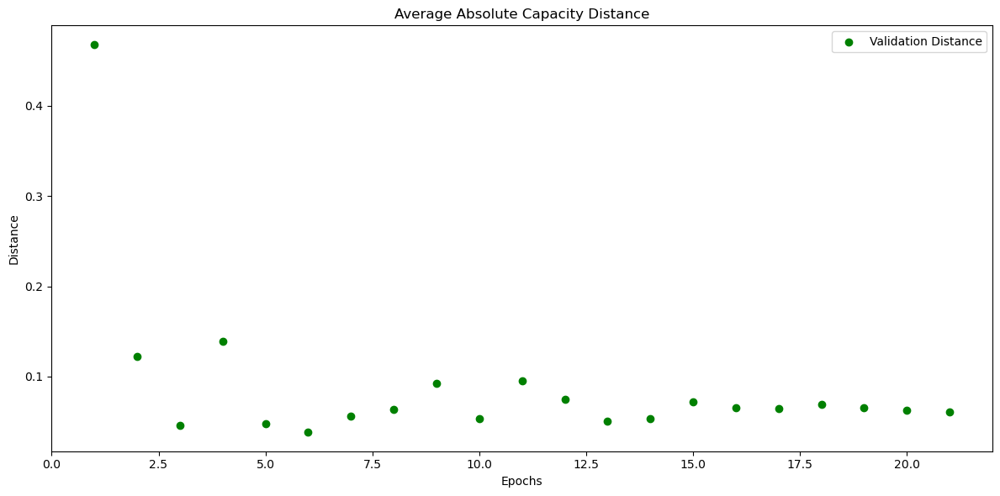

In [240]:
# B0006_combined_mm
model_B0006_combined_mm = CustomCNN(input_shape=input_shape_combined)
model_B0006_combined_mm, train_losses_B0006_combined_mm, val_losses_B0006_combined_mm, val_distances_B0006_combined_mm, metrics_history_B0006_combined_mm = train(data_loaders['B0006_combined_mm_val_loader'], data_loaders['B0006_combined_mm_train_loader'], model_B0006_combined_mm)
torch.save(model_B0006_combined_mm, os.path.join(folder_name, 'model_B0006_combined_mm.pth'))

Test Loss: 0.0415
Test Loss: 0.0415, Test Distance: 0.1406, Test Accuracy: 0.0000, SNR: -4.1026
##Metrics##:
MAE : 0.13899320363998413
MSE : 0.020267175510525703
RMSE : 0.37407049536705017
R-squared : -708.1475830078125
Count: 26


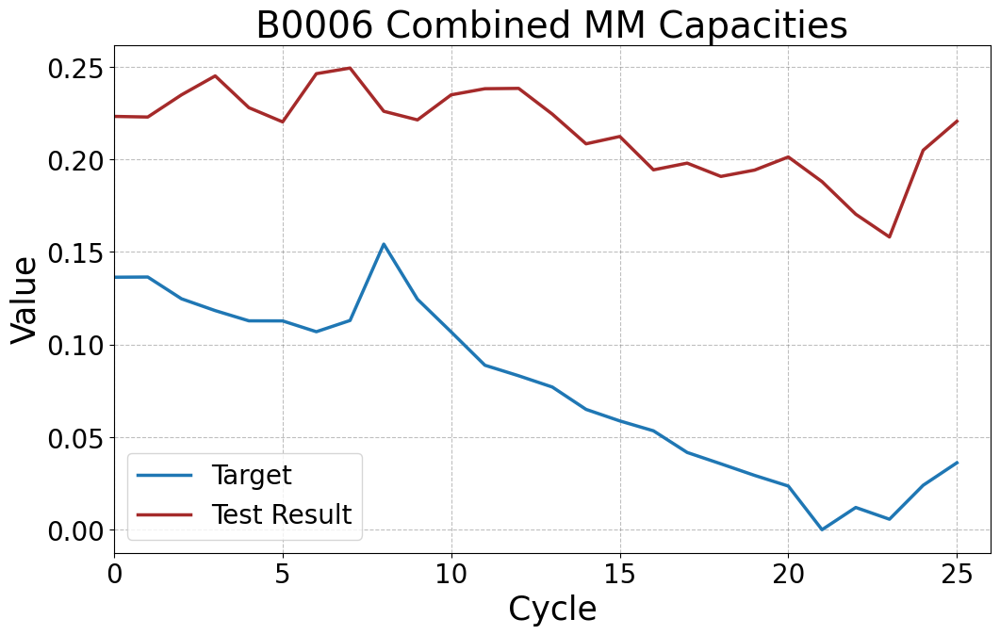

In [241]:
# B0006_combined_mm
model_B0006_combined_mm = torch.load('4. CNN Models/model_B0006_combined_mm.pth')
y_target_B0006_combined_mm, y_testresult_B0006_combined_mm = test(model_B0006_combined_mm, data_loaders['B0006_combined_mm_test_loader'])
y_target_B0006_combined_mm = flatten_and_concatenate(y_target_B0006_combined_mm)
y_testresult_B0006_combined_mm = flatten_and_concatenate(y_testresult_B0006_combined_mm)
plot_tensors(y_target_B0006_combined_mm, y_testresult_B0006_combined_mm, labels=["Target", "Test Result"], title="B0006 Combined MM Capacities")


Test on complete dataset.

Test Loss: 0.0096
Test Loss: 0.0096, Test Distance: 0.0524, Test Accuracy: 14.2857, SNR: 17.6791
##Metrics##:
MAE : 0.05237153545022011
MSE : 0.00477888248860836
RMSE : 0.2334945946931839
R-squared : -158.75228881835938
Count: 168


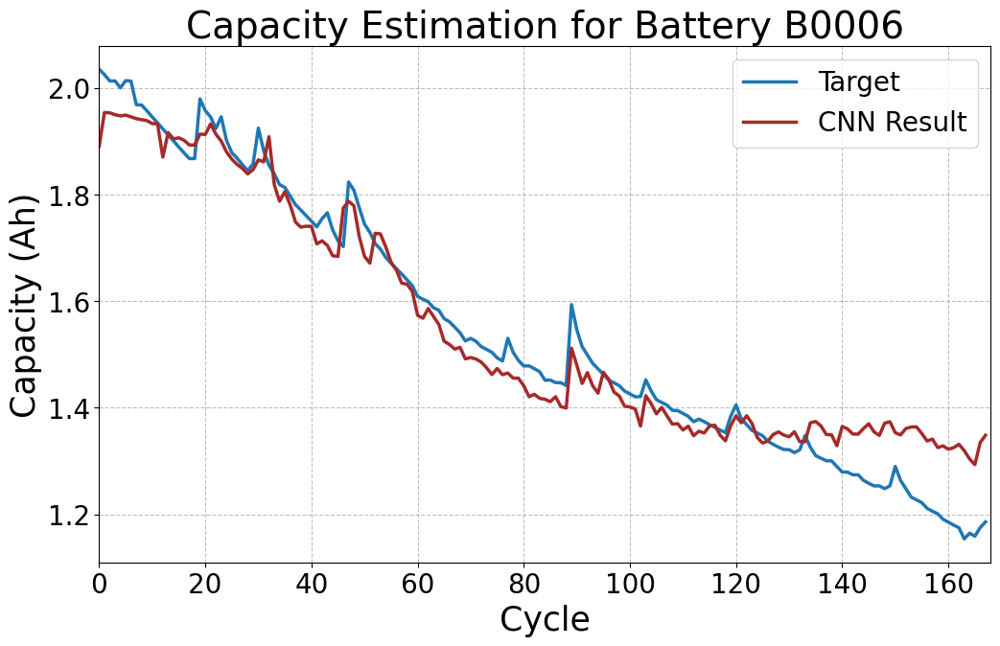

In [242]:
# Run the test on the model
y_target_B0006_combined_mm, y_testresult_B0006_combined_mm = test(model_B0006_combined_mm, data_loaders['B0006_combined_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_combined_mm = flatten_and_concatenate(y_target_B0006_combined_mm)
y_testresult_B0006_combined_mm = flatten_and_concatenate(y_testresult_B0006_combined_mm)

# Assuming scaler_y_combined_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_combined_mm = scaler_y_comb_mm_B0006.inverse_transform(y_target_B0006_combined_mm.numpy().reshape(-1, 1))
original_y_testresult_B0006_combined_mm = scaler_y_comb_mm_B0006.inverse_transform(y_testresult_B0006_combined_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_combined_mm = torch.tensor(original_y_target_B0006_combined_mm)
original_y_testresult_B0006_combined_mm = torch.tensor(original_y_testresult_B0006_combined_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_combined_mm, original_y_testresult_B0006_combined_mm, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_combined_mm", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


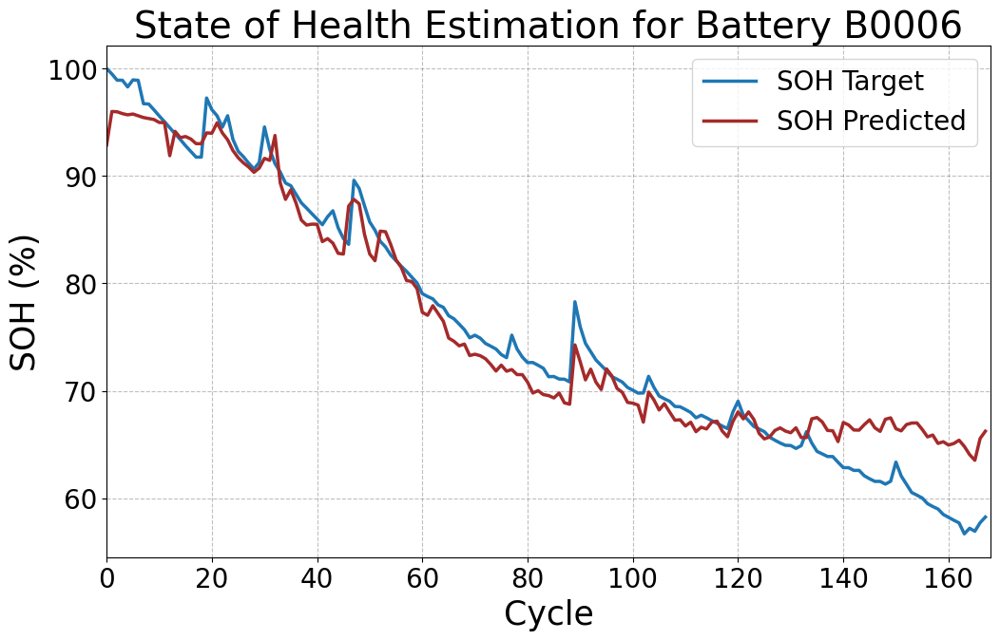

In [243]:
plot_soh(original_y_target_B0006_combined_mm, original_y_testresult_B0006_combined_mm, "State of Health Estimation for Battery B0006", file_name="B0006_combined_mm")

Model 17 - B0006 - Standard Scaler - Combined Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.6168, Validation Loss: 0.3178
Validation Distance: 0.4836, Validation Accuracy: 0.0000, SNR: 4.8816
##Metrics##:
MAE : 0.3483031988143921
MSE : 0.23072274029254913
RMSE : 0.6030949354171753
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.1292, Validation Loss: 0.0581
Validation Distance: 0.2036, Validation Accuracy: 4.0000, SNR: 8.9066
##Metrics##:
MAE : 0.13917255401611328
MSE : 0.0375228151679039
RMSE : 0.3858163058757782
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0498, Validation Loss: 0.0541
Validation Distance: 0.2013, Validation Accuracy: 8.0000, SNR: 9.6182
##Metrics##:
MAE : 0.13911999762058258
MSE : 0.035659778863191605
RMSE : 0.3806226849555969
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0317, Validation Loss: 0.0996
Validation Distance: 0.2662, Validation Accuracy: 4.0000, SNR: 6.0775
##Metrics##:
MAE : 0.18027932941913605
MSE : 0.06260351836681366
RMSE : 0.4300288259983063
R-squared : -inf
Count: 34
Epoch 5/1

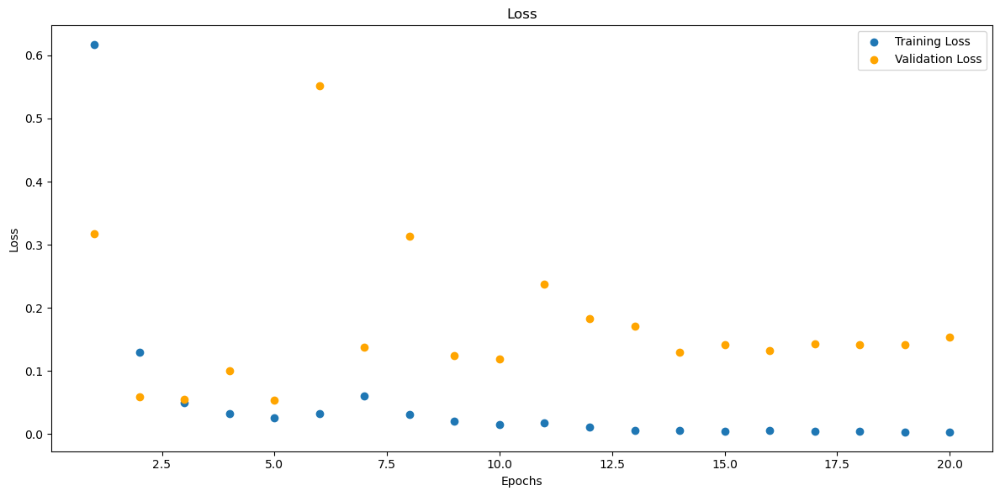

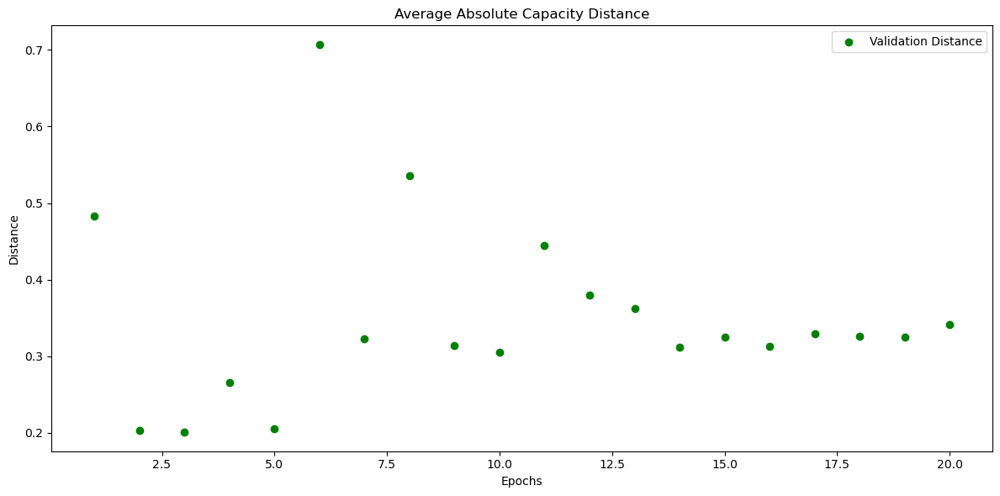

In [244]:
# B0006_combined_std
model_B0006_combined_std = CustomCNN(input_shape=input_shape_combined)
model_B0006_combined_std, train_losses_B0006_combined_std, val_losses_B0006_combined_std, val_distances_B0006_combined_std, metrics_history_B0006_combined_std = train(data_loaders['B0006_combined_std_val_loader'], data_loaders['B0006_combined_std_train_loader'], model_B0006_combined_std)
torch.save(model_B0006_combined_std, os.path.join(folder_name, 'model_B0006_combined_std.pth'))

Test Loss: 0.9118
Test Loss: 0.9118, Test Distance: 0.6628, Test Accuracy: 0.0000, SNR: 5.7676
##Metrics##:
MAE : 0.6598756313323975
MSE : 0.45238572359085083
RMSE : 0.8153975605964661
R-squared : -1529.868408203125
Count: 26


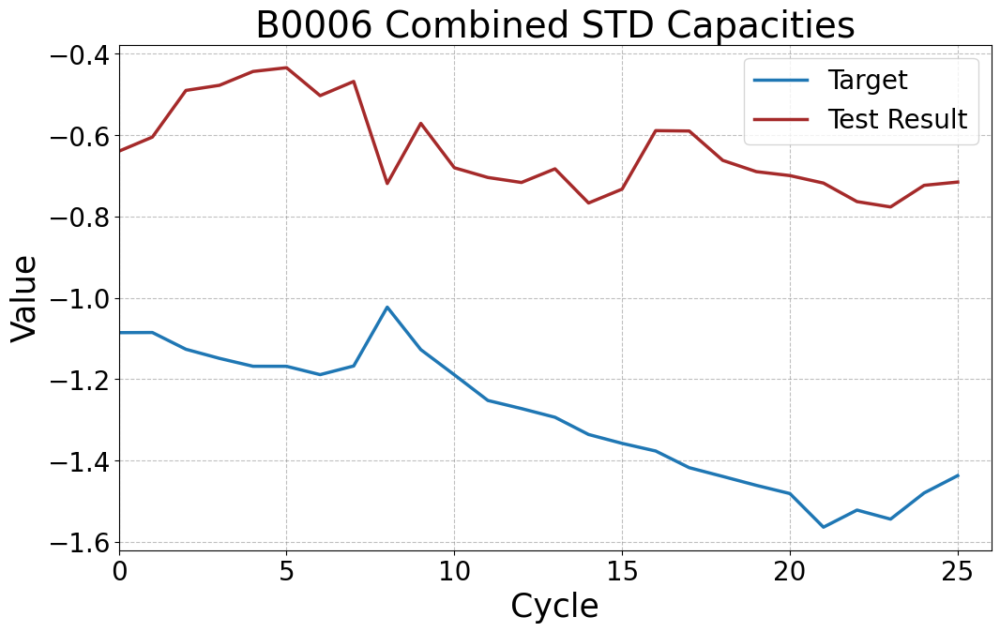

In [245]:
# B0006_combined_std
model_B0006_combined_std = torch.load('4. CNN Models/model_B0006_combined_std.pth')
y_target_B0006_combined_std, y_testresult_B0006_combined_std = test(model_B0006_combined_std, data_loaders['B0006_combined_std_test_loader'])
y_target_B0006_combined_std = flatten_and_concatenate(y_target_B0006_combined_std)
y_testresult_B0006_combined_std = flatten_and_concatenate(y_testresult_B0006_combined_std)
plot_tensors(y_target_B0006_combined_std, y_testresult_B0006_combined_std, labels=["Target", "Test Result"], title="B0006 Combined STD Capacities")


Test on complete dataset.

Test Loss: 0.2010
Test Loss: 0.2010, Test Distance: 0.2376, Test Accuracy: 4.7619, SNR: 9.9780
##Metrics##:
MAE : 0.23759238421916962
MSE : 0.1005084365606308
RMSE : 0.4969218671321869
R-squared : -317.5506286621094
Count: 168


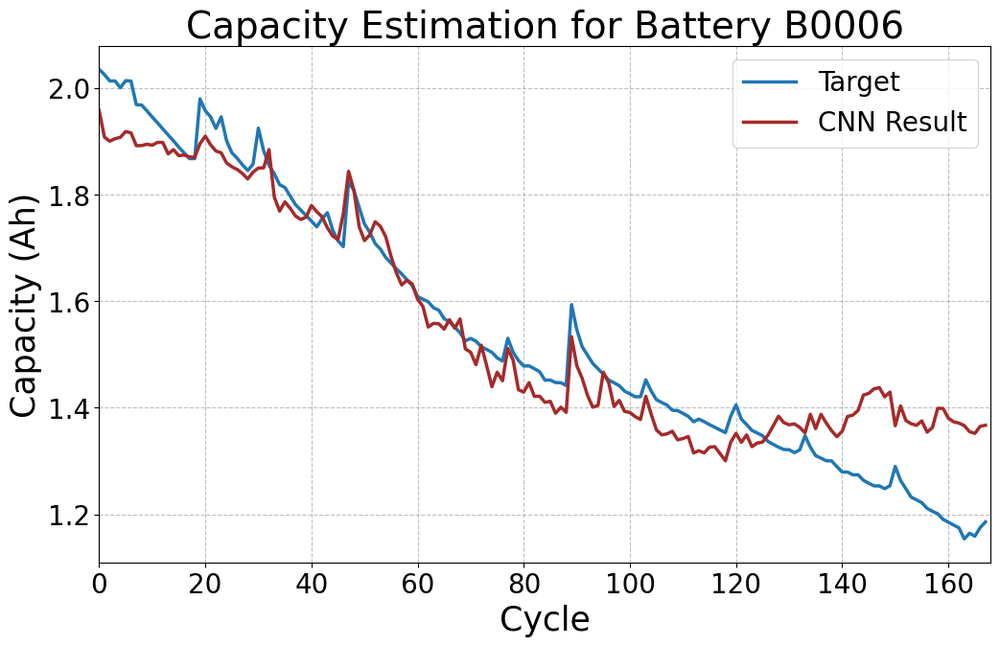

In [246]:
# Run the test on the model
y_target_B0006_combined_std, y_testresult_B0006_combined_std = test(model_B0006_combined_std, data_loaders['B0006_combined_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_combined_std = flatten_and_concatenate(y_target_B0006_combined_std)
y_testresult_B0006_combined_std = flatten_and_concatenate(y_testresult_B0006_combined_std)

# Assuming scaler_y_combined_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_combined_std = scaler_y_comb_std_B0006.inverse_transform(y_target_B0006_combined_std.numpy().reshape(-1, 1))
original_y_testresult_B0006_combined_std = scaler_y_comb_std_B0006.inverse_transform(y_testresult_B0006_combined_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_combined_std = torch.tensor(original_y_target_B0006_combined_std)
original_y_testresult_B0006_combined_std = torch.tensor(original_y_testresult_B0006_combined_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_combined_std, original_y_testresult_B0006_combined_std, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_combined_std", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


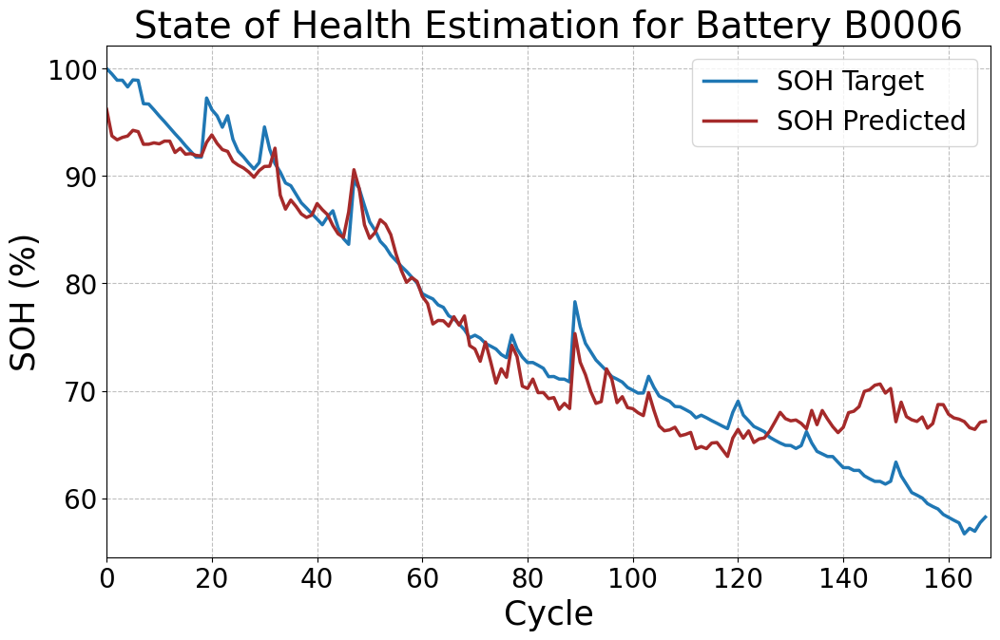

In [247]:
plot_soh(original_y_target_B0006_combined_std, original_y_testresult_B0006_combined_std, "State of Health Estimation for Battery B0006", file_name="B0006_combined_std")

Model 18 - B0006 - Robust Scaler - Combined Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.2649, Validation Loss: 0.1242
Validation Distance: 0.2964, Validation Accuracy: 8.0000, SNR: 32.2371
##Metrics##:
MAE : 0.2346723973751068
MSE : 0.09858649969100952
RMSE : 0.4979962706565857
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0429, Validation Loss: 0.0398
Validation Distance: 0.1832, Validation Accuracy: 0.0000, SNR: 4.6514
##Metrics##:
MAE : 0.12856177985668182
MSE : 0.026713887229561806
RMSE : 0.3700858950614929
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0292, Validation Loss: 0.0226
Validation Distance: 0.1300, Validation Accuracy: 12.0000, SNR: 14.9678
##Metrics##:
MAE : 0.09807462990283966
MSE : 0.017498953267931938
RMSE : 0.3279503285884857
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0186, Validation Loss: 0.0237
Validation Distance: 0.1384, Validation Accuracy: 0.0000, SNR: 23.6923
##Metrics##:
MAE : 0.10802795737981796
MSE : 0.018787497654557228
RMSE : 0.33749353885650635
R-squared : -inf
Count: 34
E

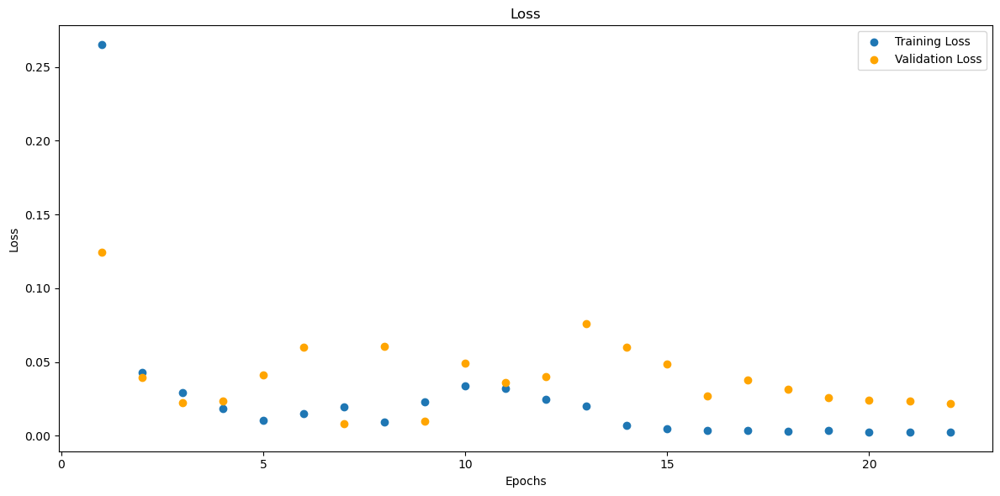

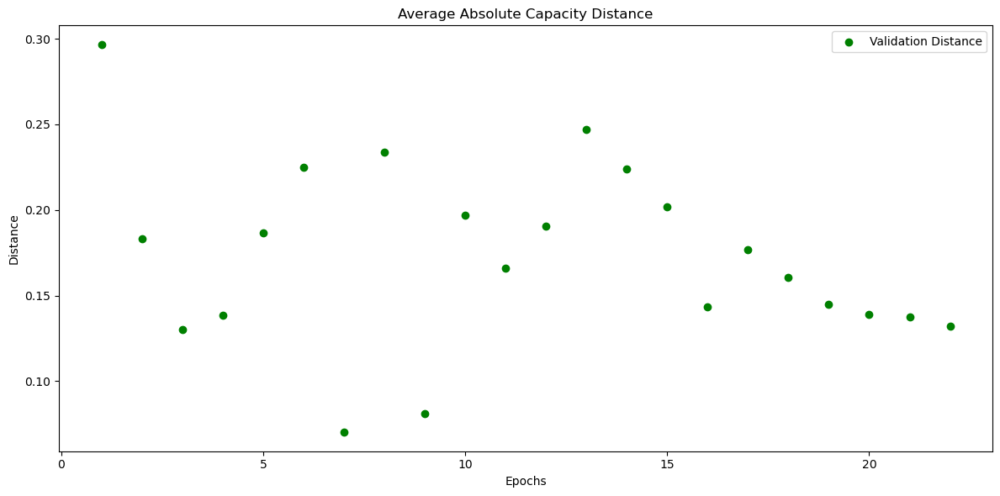

In [248]:
# B0006_combined_rob
model_B0006_combined_rob = CustomCNN(input_shape=input_shape_combined)
model_B0006_combined_rob, train_losses_B0006_combined_rob, val_losses_B0006_combined_rob, val_distances_B0006_combined_rob, metrics_history_B0006_combined_rob = train(data_loaders['B0006_combined_rob_val_loader'], data_loaders['B0006_combined_rob_train_loader'], model_B0006_combined_rob)
torch.save(model_B0006_combined_rob, os.path.join(folder_name, 'model_B0006_combined_rob.pth'))

Test Loss: 0.1308
Test Loss: 0.1308, Test Distance: 0.2317, Test Accuracy: 0.0000, SNR: 8.0107
##Metrics##:
MAE : 0.22904041409492493
MSE : 0.06415852904319763
RMSE : 0.48478078842163086
R-squared : -462.0371398925781
Count: 26


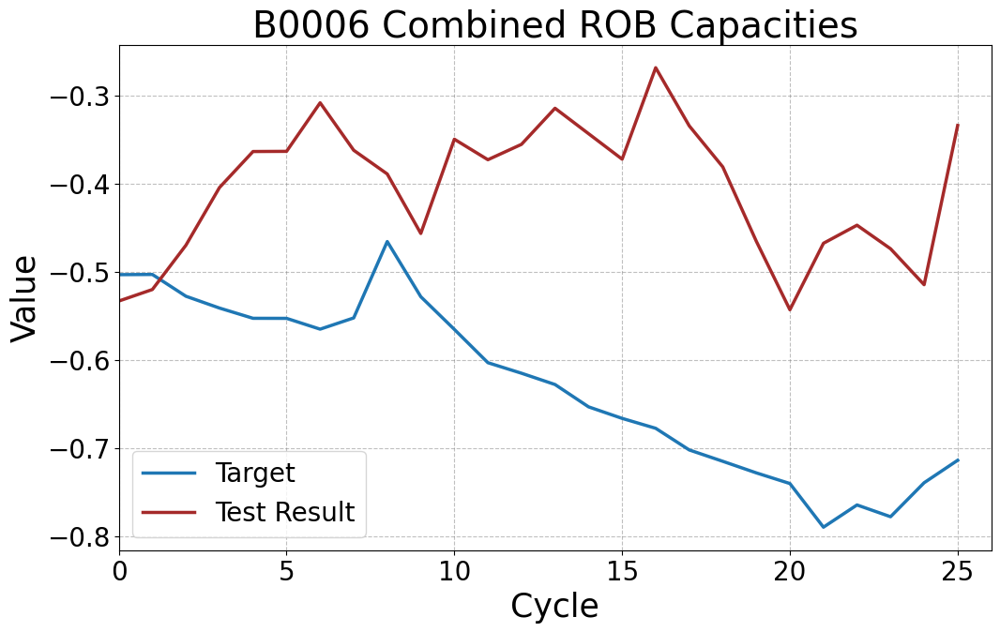

In [249]:
# B0006_combined_rob
model_B0006_combined_rob = torch.load('4. CNN Models/model_B0006_combined_rob.pth')
y_target_B0006_combined_rob, y_testresult_B0006_combined_rob = test(model_B0006_combined_rob, data_loaders['B0006_combined_rob_test_loader'])
y_target_B0006_combined_rob = flatten_and_concatenate(y_target_B0006_combined_rob)
y_testresult_B0006_combined_rob = flatten_and_concatenate(y_testresult_B0006_combined_rob)
plot_tensors(y_target_B0006_combined_rob, y_testresult_B0006_combined_rob, labels=["Target", "Test Result"], title="B0006 Combined ROB Capacities")


Test on complete dataset.

In [250]:
# Run the test on the model
y_target_B0006_combined_rob, y_testresult_B0006_combined_rob = test(model_B0006_combined_rob, data_loaders['B0006_combined_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_combined_rob = flatten_and_concatenate(y_target_B0006_combined_rob)
y_testresult_B0006_combined_rob = flatten_and_concatenate(y_testresult_B0006_combined_rob)

# # Assuming scaler_y_combined_B0006 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0006_combined_rob = scaler_y_comb_rob_B0006.inverse_transform(y_target_B0006_combined_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0006_combined_rob = scaler_y_comb_rob_B0006.inverse_transform(y_testresult_B0006_combined_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0006_combined_rob = torch.tensor(original_y_target_B0006_combined_rob)
# original_y_testresult_B0006_combined_rob = torch.tensor(original_y_testresult_B0006_combined_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0006_combined_rob, original_y_testresult_B0006_combined_rob, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_combined_rob", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


Test Loss: 0.0321
Test Loss: 0.0321, Test Distance: 0.0936, Test Accuracy: 8.3333, SNR: 13.7376
##Metrics##:
MAE : 0.09356187283992767
MSE : 0.016061505302786827
RMSE : 0.3177732229232788
R-squared : -110.15293884277344
Count: 168


SOH Plot.

In [251]:
# plot_soh(original_y_target_B0006_combined_rob, original_y_testresult_B0006_combined_rob, "State of Health Estimation for Battery B0006", file_name="B0006_combined_rob")

Model 19 - B0007 - MinMax Scaler - Charging Data

Epoch 1/120, Training Loss: 0.2011, Validation Loss: 0.2432
Validation Distance: 0.4884, Validation Accuracy: 0.0000, SNR: -14.9633
##Metrics##:
MAE : 0.35367438197135925
MSE : 0.17330531775951385
RMSE : 0.5950980186462402
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0228, Validation Loss: 0.0670
Validation Distance: 0.2520, Validation Accuracy: 0.0000, SNR: -10.3962
##Metrics##:
MAE : 0.17992891371250153
MSE : 0.046270277351140976
RMSE : 0.42491915822029114
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0194, Validation Loss: 0.0326
Validation Distance: 0.1620, Validation Accuracy: 0.0000, SNR: -8.1168
##Metrics##:
MAE : 0.11309172958135605
MSE : 0.02178485505282879
RMSE : 0.3405503034591675
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0121, Validation Loss: 0.0355
Validation Distance: 0.1800, Validation Accuracy: 0.0000, SNR: -8.3605
##Metrics##:
MAE : 0.12698562443256378
MSE : 0.0238173920661211
RMSE : 0.35754483938217163
R-squared : -inf
Count: 34


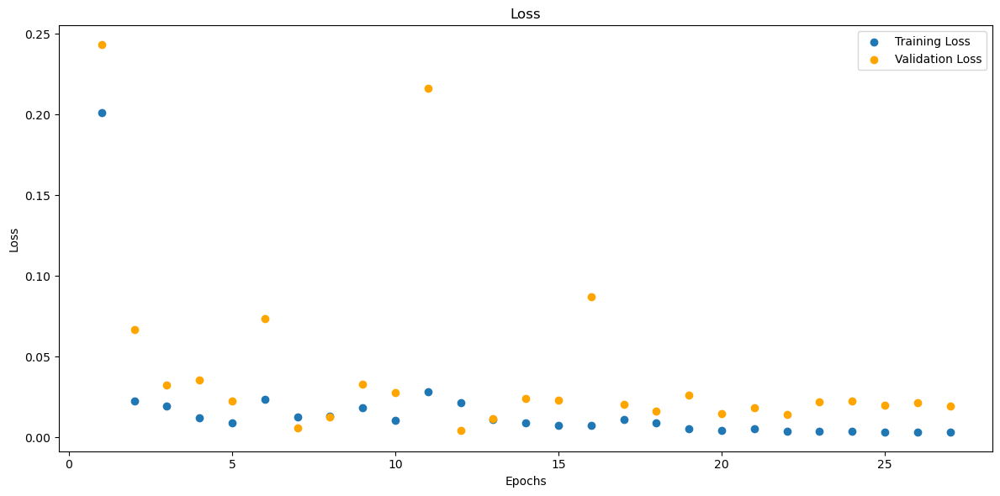

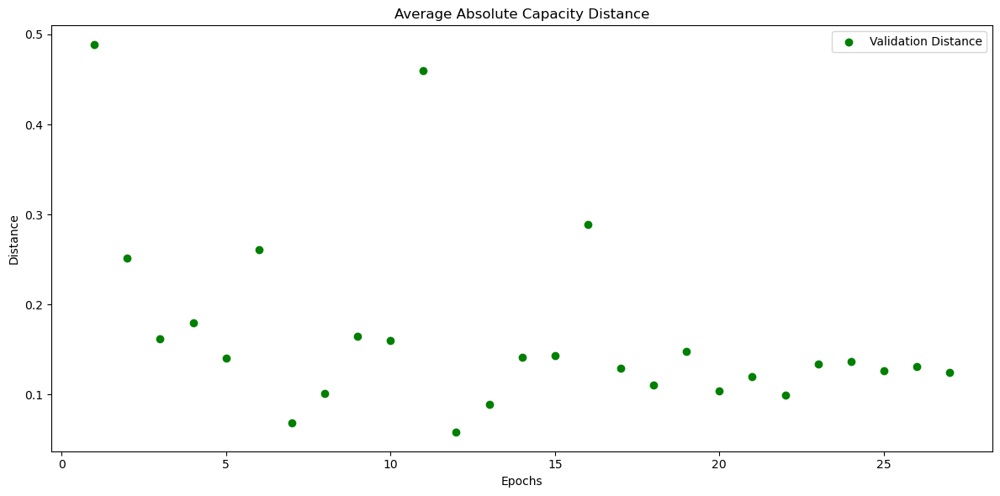

In [252]:
# B0007_charge_mm
model_B0007_charge_mm = CustomCNN(input_shape=input_shape_single)
model_B0007_charge_mm, train_losses_B0007_charge_mm, val_losses_B0007_charge_mm, val_distances_B0007_charge_mm, metrics_history_B0007_charge_mm = train(data_loaders['B0007_charge_mm_val_loader'], data_loaders['B0007_charge_mm_train_loader'], model_B0007_charge_mm)
torch.save(model_B0007_charge_mm, os.path.join(folder_name, 'model_B0007_charge_mm.pth'))

Test Loss: 0.0900
Test Loss: 0.0900, Test Distance: 0.2060, Test Accuracy: 0.0000, SNR: -9.5670
##Metrics##:
MAE : 0.2060098946094513
MSE : 0.0450703427195549
RMSE : 0.4556141197681427
R-squared : -1243.638916015625
Count: 26


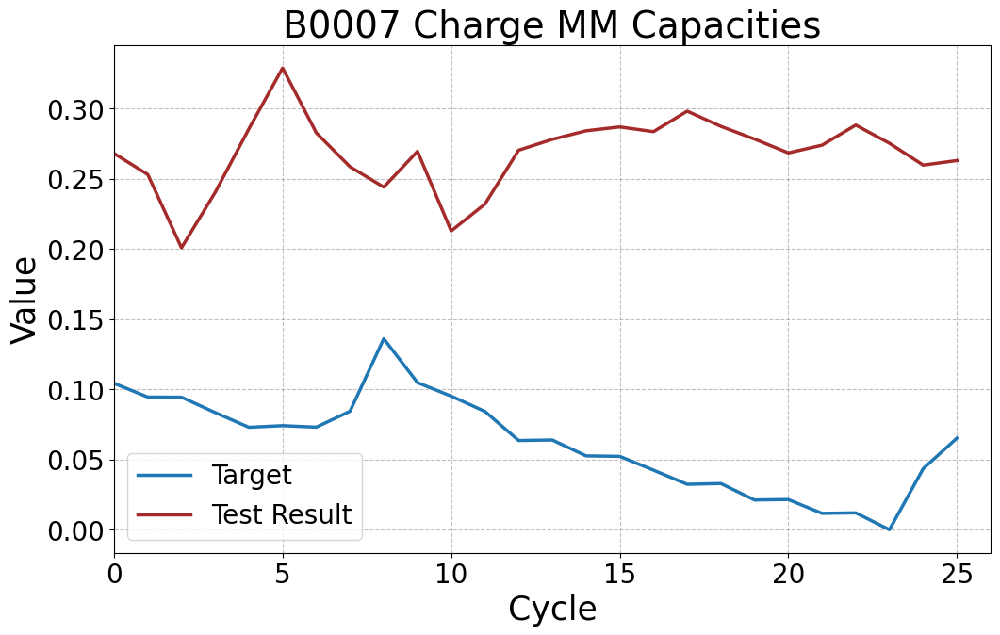

In [253]:
# B0007_charge_mm
model_B0007_charge_mm = torch.load('4. CNN Models/model_B0007_charge_mm.pth')
y_target_B0007_charge_mm, y_testresult_B0007_charge_mm = test(model_B0007_charge_mm, data_loaders['B0007_charge_mm_test_loader'])
y_target_B0007_charge_mm = flatten_and_concatenate(y_target_B0007_charge_mm)
y_testresult_B0007_charge_mm = flatten_and_concatenate(y_testresult_B0007_charge_mm)
plot_tensors(y_target_B0007_charge_mm, y_testresult_B0007_charge_mm, labels=["Target", "Test Result"], title="B0007 Charge MM Capacities")


Test on complete dataset.

Test Loss: 0.0561
Test Loss: 0.0561, Test Distance: 0.1479, Test Accuracy: 1.7857, SNR: 11.0151
##Metrics##:
MAE : 0.14790883660316467
MSE : 0.028043800964951515
RMSE : 0.38995617628097534
R-squared : -5661.51953125
Count: 168


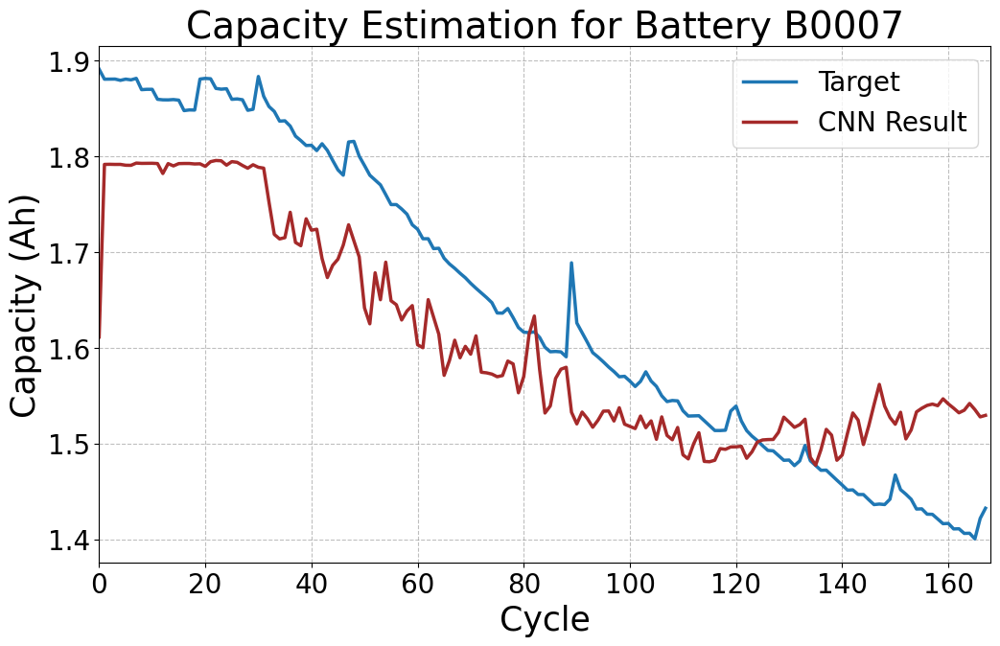

In [254]:
# Run the test on the model
y_target_B0007_charge_mm, y_testresult_B0007_charge_mm = test(model_B0007_charge_mm, data_loaders['B0007_charge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_charge_mm = flatten_and_concatenate(y_target_B0007_charge_mm)
y_testresult_B0007_charge_mm = flatten_and_concatenate(y_testresult_B0007_charge_mm)

# Assuming scaler_y_charge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_charge_mm = scaler_y_charge_mm_B0007.inverse_transform(y_target_B0007_charge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0007_charge_mm = scaler_y_charge_mm_B0007.inverse_transform(y_testresult_B0007_charge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_charge_mm = torch.tensor(original_y_target_B0007_charge_mm)
original_y_testresult_B0007_charge_mm = torch.tensor(original_y_testresult_B0007_charge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_charge_mm, original_y_testresult_B0007_charge_mm, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_charge_mm", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


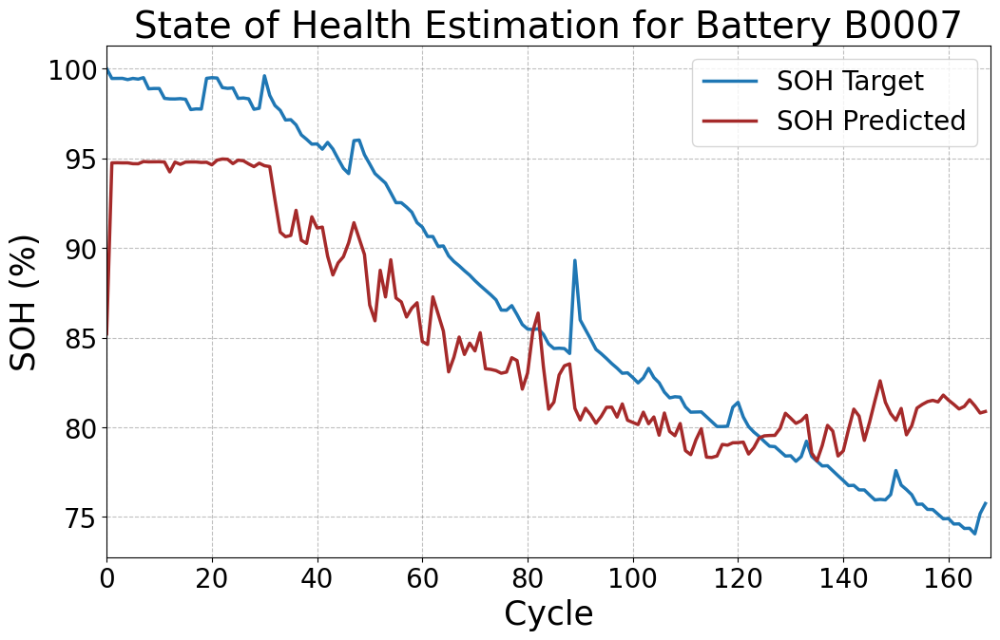

In [255]:
plot_soh(original_y_target_B0007_charge_mm, original_y_testresult_B0007_charge_mm, "State of Health Estimation for Battery B0007", file_name="B0007_charge_mm")

Model 20 - B0007 - Standard Scaler - Charging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.2716, Validation Loss: 0.6570
Validation Distance: 0.7789, Validation Accuracy: 0.0000, SNR: 0.7751
##Metrics##:
MAE : 0.5538436770439148
MSE : 0.45053112506866455
RMSE : 0.7476450204849243
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0881, Validation Loss: 0.3237
Validation Distance: 0.4673, Validation Accuracy: 8.0000, SNR: 3.6336
##Metrics##:
MAE : 0.32449838519096375
MSE : 0.22014646232128143
RMSE : 0.5937133431434631
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0936, Validation Loss: 1.0145
Validation Distance: 0.9530, Validation Accuracy: 0.0000, SNR: -0.4490
##Metrics##:
MAE : 0.6822611689567566
MSE : 0.7111976146697998
RMSE : 0.8333982825279236
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.1432, Validation Loss: 0.6081
Validation Distance: 0.6772, Validation Accuracy: 0.0000, SNR: 2.2765
##Metrics##:
MAE : 0.4833378493785858
MSE : 0.4324970543384552
RMSE : 0.7163972854614258
R-squared : -inf
Count: 34
Epoch 5/120,

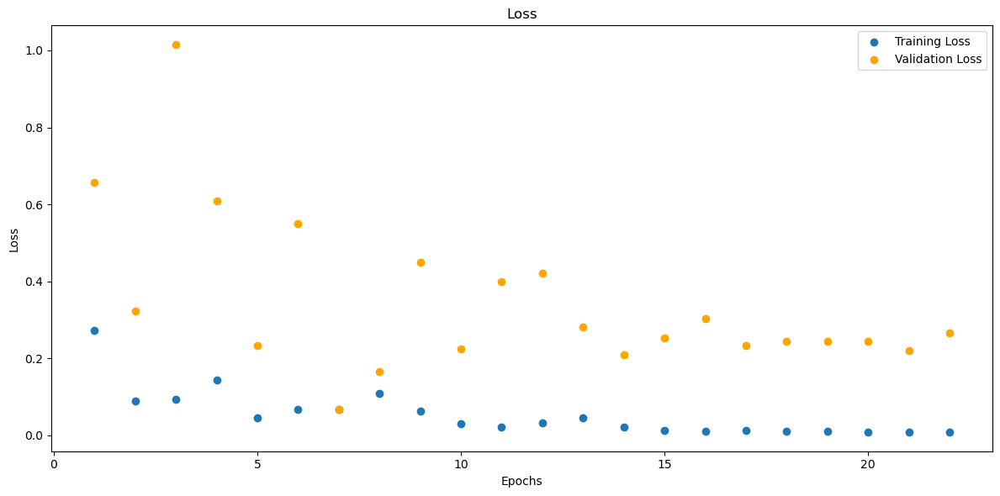

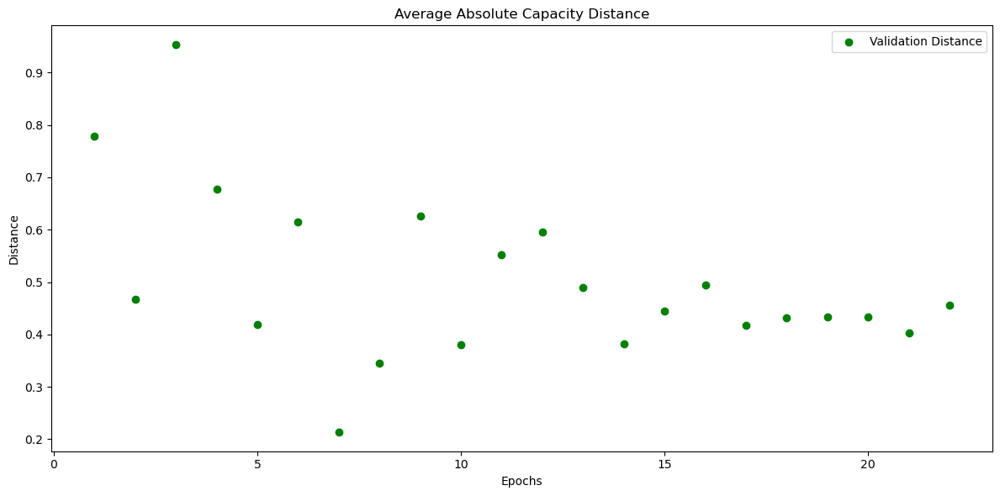

In [256]:
# B0007_charge_std
model_B0007_charge_std = CustomCNN(input_shape=input_shape_single)
model_B0007_charge_std, train_losses_B0007_charge_std, val_losses_B0007_charge_std, val_distances_B0007_charge_std, metrics_history_B0007_charge_std = train(data_loaders['B0007_charge_std_val_loader'], data_loaders['B0007_charge_std_train_loader'], model_B0007_charge_std)
torch.save(model_B0007_charge_std, os.path.join(folder_name, 'model_B0007_charge_std.pth'))

Test Loss: 0.8537
Test Loss: 0.8537, Test Distance: 0.6423, Test Accuracy: 0.0000, SNR: 6.2011
##Metrics##:
MAE : 0.6419233083724976
MSE : 0.42689502239227295
RMSE : 0.8023414015769958
R-squared : -1251.36572265625
Count: 26


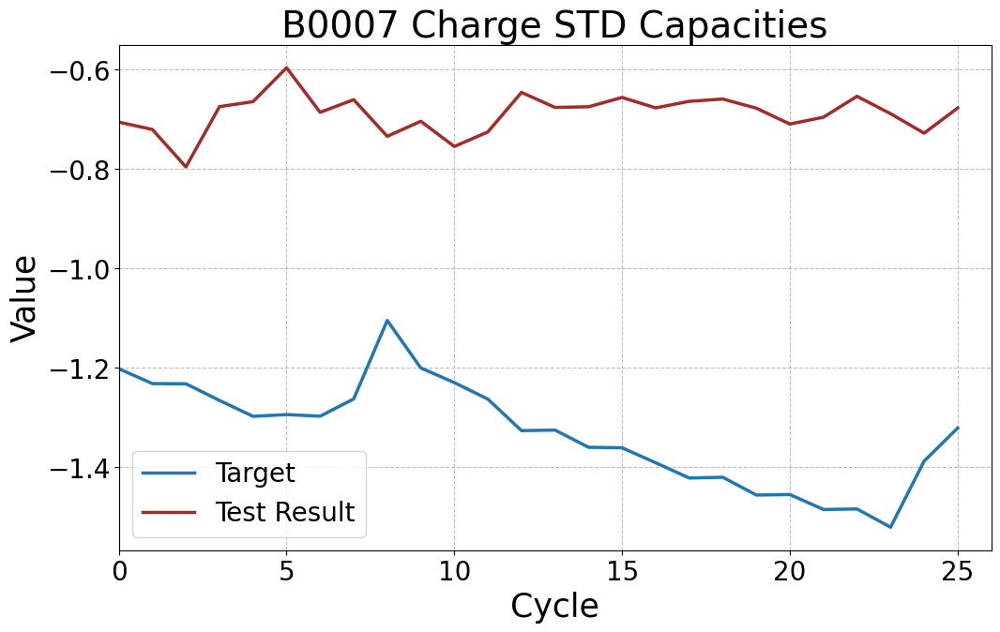

In [257]:
# B0007_charge_std
model_B0007_charge_std = torch.load('4. CNN Models/model_B0007_charge_std.pth')
y_target_B0007_charge_std, y_testresult_B0007_charge_std = test(model_B0007_charge_std, data_loaders['B0007_charge_std_test_loader'])
y_target_B0007_charge_std = flatten_and_concatenate(y_target_B0007_charge_std)
y_testresult_B0007_charge_std = flatten_and_concatenate(y_testresult_B0007_charge_std)
plot_tensors(y_target_B0007_charge_std, y_testresult_B0007_charge_std, labels=["Target", "Test Result"], title="B0007 Charge STD Capacities")


Test on complete dataset.

Test Loss: 0.3484
Test Loss: 0.3484, Test Distance: 0.3457, Test Accuracy: 1.7857, SNR: 7.5899
##Metrics##:
MAE : 0.34569528698921204
MSE : 0.17418478429317474
RMSE : 0.6017796993255615
R-squared : -2008.0987548828125
Count: 168


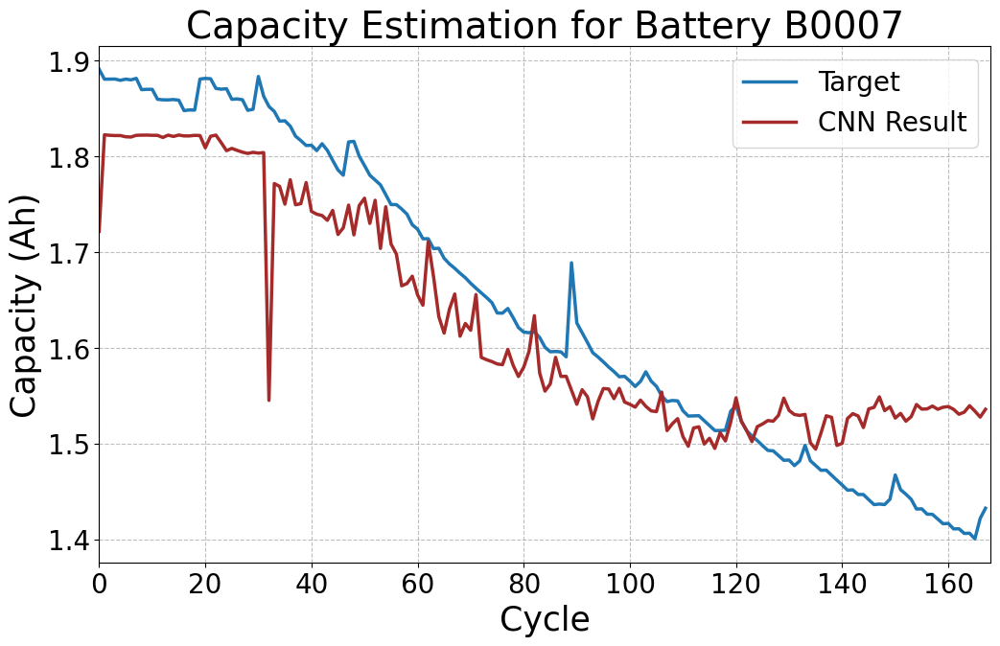

In [258]:
# Run the test on the model
y_target_B0007_charge_std, y_testresult_B0007_charge_std = test(model_B0007_charge_std, data_loaders['B0007_charge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_charge_std = flatten_and_concatenate(y_target_B0007_charge_std)
y_testresult_B0007_charge_std = flatten_and_concatenate(y_testresult_B0007_charge_std)

# Assuming scaler_y_charge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_charge_std = scaler_y_charge_std_B0007.inverse_transform(y_target_B0007_charge_std.numpy().reshape(-1, 1))
original_y_testresult_B0007_charge_std = scaler_y_charge_std_B0007.inverse_transform(y_testresult_B0007_charge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_charge_std = torch.tensor(original_y_target_B0007_charge_std)
original_y_testresult_B0007_charge_std = torch.tensor(original_y_testresult_B0007_charge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_charge_std, original_y_testresult_B0007_charge_std, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_charge_std", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


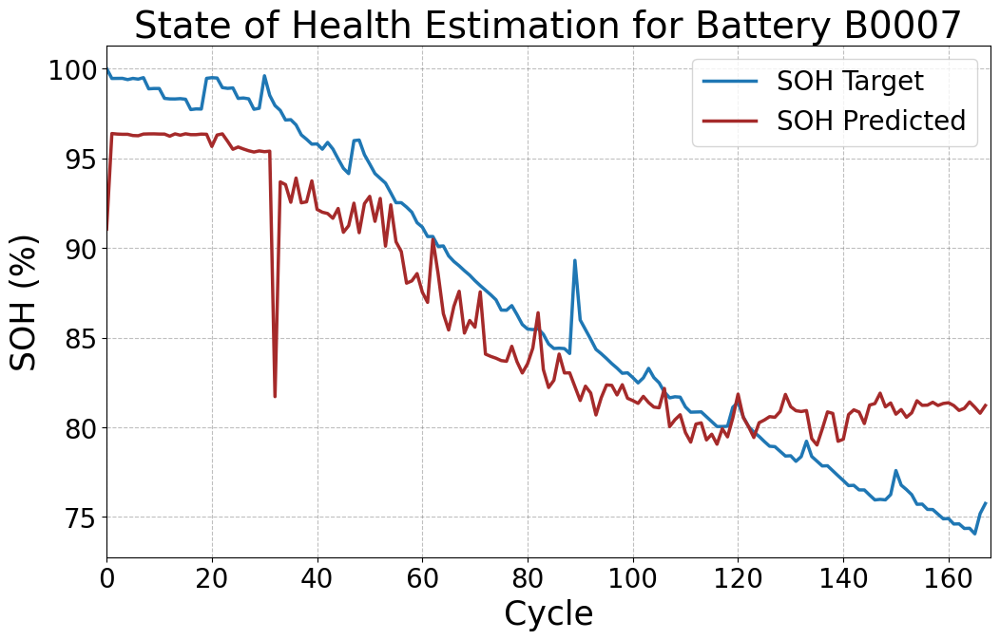

In [259]:
plot_soh(original_y_target_B0007_charge_std, original_y_testresult_B0007_charge_std, "State of Health Estimation for Battery B0007", file_name="B0007_charge_std")

Model 21 - B0007 - Robust Scaler - Charging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.3871, Validation Loss: 0.3157
Validation Distance: 0.4562, Validation Accuracy: 8.0000, SNR: -1.8825
##Metrics##:
MAE : 0.3239052891731262
MSE : 0.22566872835159302
RMSE : 0.5905988812446594
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0309, Validation Loss: 0.0196
Validation Distance: 0.1175, Validation Accuracy: 4.0000, SNR: 6.9831
##Metrics##:
MAE : 0.07945608347654343
MSE : 0.01231347769498825
RMSE : 0.2889987528324127
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0447, Validation Loss: 0.0802
Validation Distance: 0.2256, Validation Accuracy: 0.0000, SNR: 4.5722
##Metrics##:
MAE : 0.1609049290418625
MSE : 0.05803424492478371
RMSE : 0.42057546973228455
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0195, Validation Loss: 0.0792
Validation Distance: 0.2335, Validation Accuracy: 0.0000, SNR: 3.5329
##Metrics##:
MAE : 0.1648697704076767
MSE : 0.055734556168317795
RMSE : 0.41700479388237
R-squared : -inf
Count: 34
Epoch 5/12

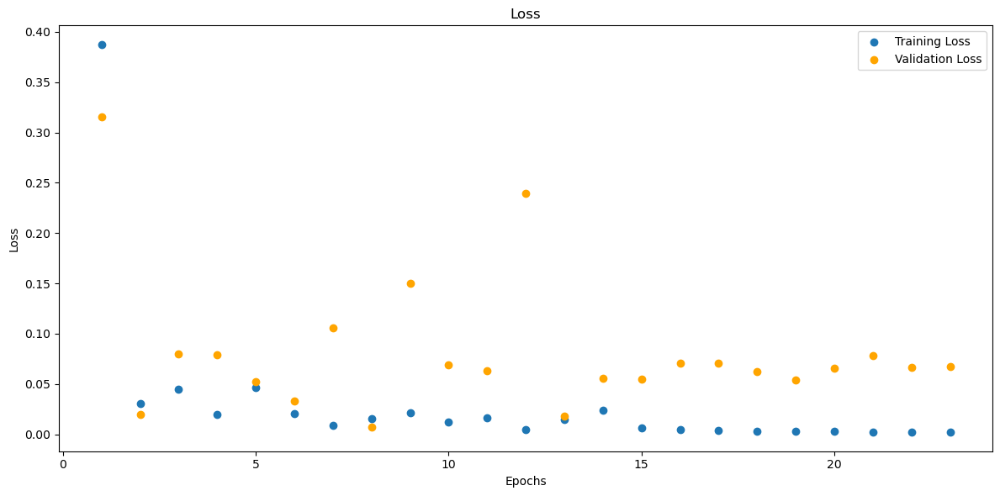

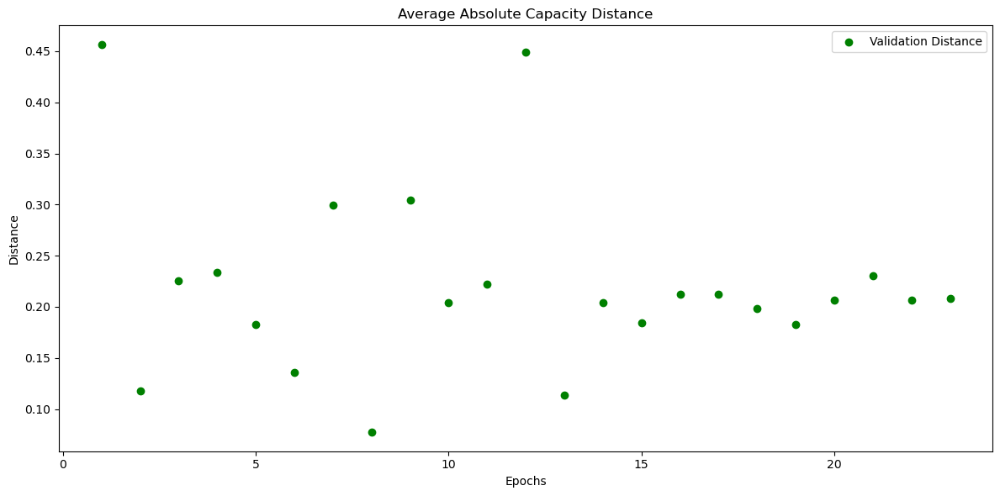

In [260]:
# B0007_charge_rob
model_B0007_charge_rob = CustomCNN(input_shape=input_shape_single)
model_B0007_charge_rob, train_losses_B0007_charge_rob, val_losses_B0007_charge_rob, val_distances_B0007_charge_rob, metrics_history_B0007_charge_rob = train(data_loaders['B0007_charge_rob_val_loader'], data_loaders['B0007_charge_rob_train_loader'], model_B0007_charge_rob)
torch.save(model_B0007_charge_rob, os.path.join(folder_name, 'model_B0007_charge_rob.pth'))

Test Loss: 0.1560
Test Loss: 0.1560, Test Distance: 0.2697, Test Accuracy: 0.0000, SNR: 6.5808
##Metrics##:
MAE : 0.2677958607673645
MSE : 0.07704547792673111
RMSE : 0.5198160409927368
R-squared : -827.4520263671875
Count: 26


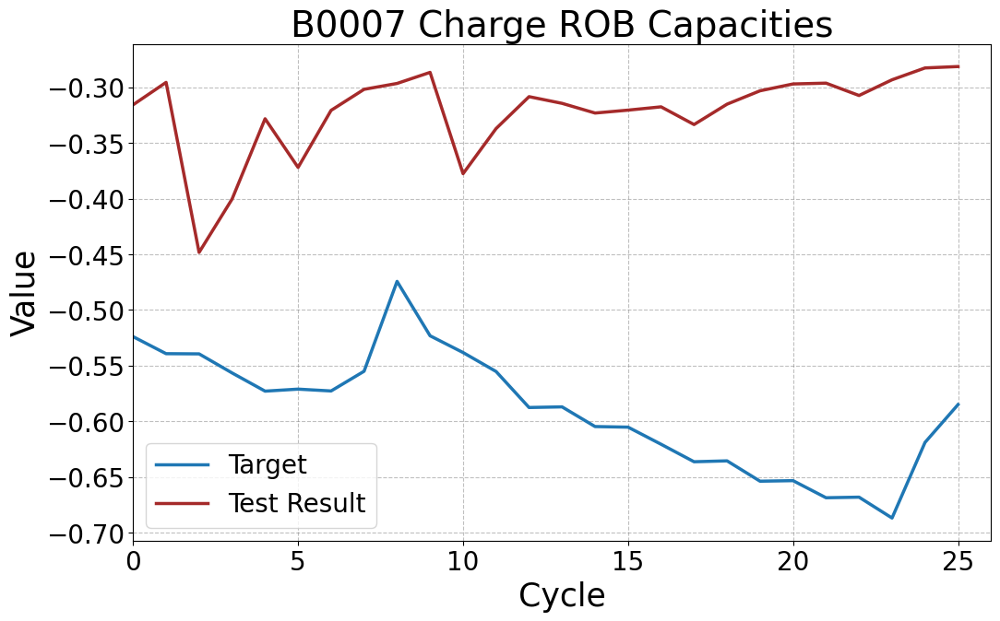

In [261]:
# B0007_charge_rob
model_B0007_charge_rob = torch.load('4. CNN Models/model_B0007_charge_rob.pth')
y_target_B0007_charge_rob, y_testresult_B0007_charge_rob = test(model_B0007_charge_rob, data_loaders['B0007_charge_rob_test_loader'])
y_target_B0007_charge_rob = flatten_and_concatenate(y_target_B0007_charge_rob)
y_testresult_B0007_charge_rob = flatten_and_concatenate(y_testresult_B0007_charge_rob)
plot_tensors(y_target_B0007_charge_rob, y_testresult_B0007_charge_rob, labels=["Target", "Test Result"], title="B0007 Charge ROB Capacities")


Test on complete dataset.

In [262]:
# Run the test on the model
y_target_B0007_charge_rob, y_testresult_B0007_charge_rob = test(model_B0007_charge_rob, data_loaders['B0007_charge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_charge_rob = flatten_and_concatenate(y_target_B0007_charge_rob)
y_testresult_B0007_charge_rob = flatten_and_concatenate(y_testresult_B0007_charge_rob)

# # Assuming scaler_y_charge_B0007 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0007_charge_rob = scaler_y_charge_rob_B0007.inverse_transform(y_target_B0007_charge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0007_charge_rob = scaler_y_charge_rob_B0007.inverse_transform(y_testresult_B0007_charge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0007_charge_rob = torch.tensor(original_y_target_B0007_charge_rob)
# original_y_testresult_B0007_charge_rob = torch.tensor(original_y_testresult_B0007_charge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0007_charge_rob, original_y_testresult_B0007_charge_rob, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_charge_rob", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


Test Loss: 0.0518
Test Loss: 0.0518, Test Distance: 0.1177, Test Accuracy: 7.7381, SNR: 10.1680
##Metrics##:
MAE : 0.11768339574337006
MSE : 0.025916632264852524
RMSE : 0.3594316840171814
R-squared : -1597.7916259765625
Count: 168


SOH Plot.

In [263]:
# plot_soh(original_y_target_B0007_charge_rob, original_y_testresult_B0007_charge_rob, "State of Health Estimation for Battery B0007", file_name="B0007_charge_rob")

Model 22 - B0007 - MinMax Scaler - Discharging Data

Epoch 1/120, Training Loss: 0.1683, Validation Loss: 0.0384
Validation Distance: 0.1702, Validation Accuracy: 4.0000, SNR: 10.2461
##Metrics##:
MAE : 0.13328950107097626
MSE : 0.0304035022854805
RMSE : 0.37615182995796204
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0181, Validation Loss: 0.0096
Validation Distance: 0.0813, Validation Accuracy: 4.0000, SNR: -5.2226
##Metrics##:
MAE : 0.05342937633395195
MSE : 0.005488045047968626
RMSE : 0.2422596663236618
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0107, Validation Loss: 0.0048
Validation Distance: 0.0596, Validation Accuracy: 4.0000, SNR: 0.3000
##Metrics##:
MAE : 0.04140833765268326
MSE : 0.0032074053306132555
RMSE : 0.21150349080562592
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0155, Validation Loss: 0.0023
Validation Distance: 0.0375, Validation Accuracy: 8.0000, SNR: 0.5298
##Metrics##:
MAE : 0.024059386923909187
MSE : 0.0012331573525443673
RMSE : 0.16634531319141388
R-squared : -inf
Count: 3

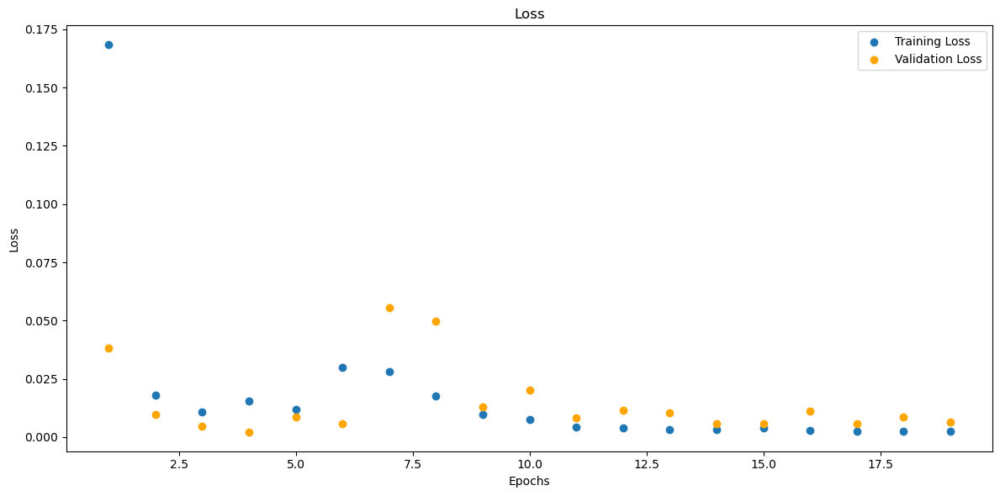

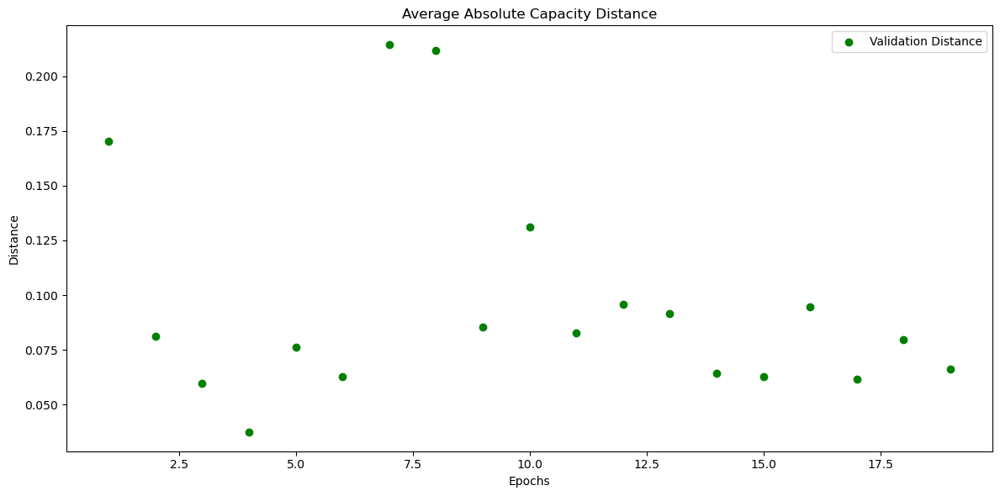

In [264]:
# B0007_discharge_mm
model_B0007_discharge_mm = CustomCNN(input_shape=input_shape_single)
model_B0007_discharge_mm, train_losses_B0007_discharge_mm, val_losses_B0007_discharge_mm, val_distances_B0007_discharge_mm, metrics_history_B0007_discharge_mm = train(data_loaders['B0007_discharge_mm_val_loader'], data_loaders['B0007_discharge_mm_train_loader'], model_B0007_discharge_mm)
torch.save(model_B0007_discharge_mm, os.path.join(folder_name, 'model_B0007_discharge_mm.pth'))

Test Loss: 0.0204
Test Loss: 0.0204, Test Distance: 0.0899, Test Accuracy: 0.0000, SNR: -2.8888
##Metrics##:
MAE : 0.08761448413133621
MSE : 0.00968429446220398
RMSE : 0.30345678329467773
R-squared : -220.49258422851562
Count: 26


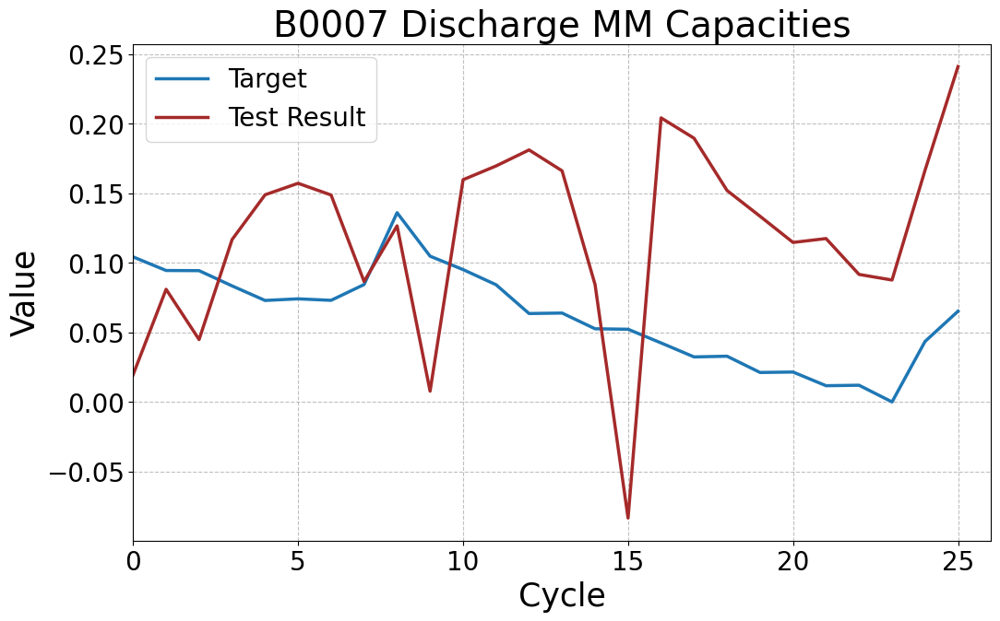

In [265]:
# B0007_discharge_mm
model_B0007_discharge_mm = torch.load('4. CNN Models/model_B0007_discharge_mm.pth')
y_target_B0007_discharge_mm, y_testresult_B0007_discharge_mm = test(model_B0007_discharge_mm, data_loaders['B0007_discharge_mm_test_loader'])
y_target_B0007_discharge_mm = flatten_and_concatenate(y_target_B0007_discharge_mm)
y_testresult_B0007_discharge_mm = flatten_and_concatenate(y_testresult_B0007_discharge_mm)
plot_tensors(y_target_B0007_discharge_mm, y_testresult_B0007_discharge_mm, labels=["Target", "Test Result"], title="B0007 Discharge MM Capacities")


Test on complete dataset.

Test Loss: 0.0138
Test Loss: 0.0138, Test Distance: 0.0669, Test Accuracy: 13.0952, SNR: 17.1035
##Metrics##:
MAE : 0.0669238269329071
MSE : 0.006902419961988926
RMSE : 0.266021192073822
R-squared : -194.84547424316406
Count: 168


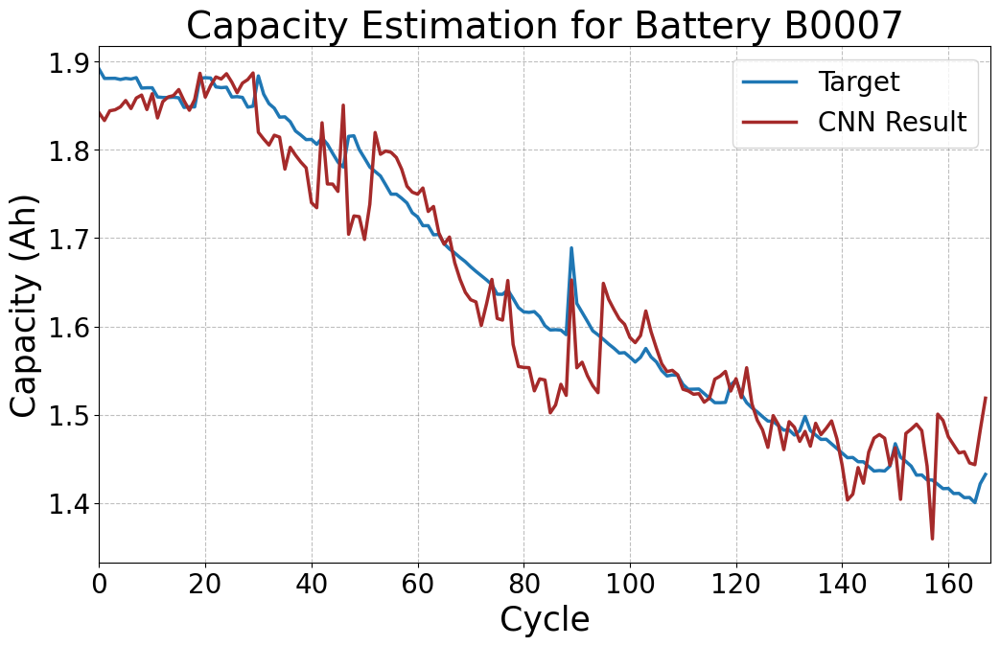

In [266]:
# Run the test on the model
y_target_B0007_discharge_mm, y_testresult_B0007_discharge_mm = test(model_B0007_discharge_mm, data_loaders['B0007_discharge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_discharge_mm = flatten_and_concatenate(y_target_B0007_discharge_mm)
y_testresult_B0007_discharge_mm = flatten_and_concatenate(y_testresult_B0007_discharge_mm)

# Assuming scaler_y_discharge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_discharge_mm = scaler_y_dis_mm_B0007.inverse_transform(y_target_B0007_discharge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0007_discharge_mm = scaler_y_dis_mm_B0007.inverse_transform(y_testresult_B0007_discharge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_discharge_mm = torch.tensor(original_y_target_B0007_discharge_mm)
original_y_testresult_B0007_discharge_mm = torch.tensor(original_y_testresult_B0007_discharge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_discharge_mm, original_y_testresult_B0007_discharge_mm, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_discharge_mm", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")

SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


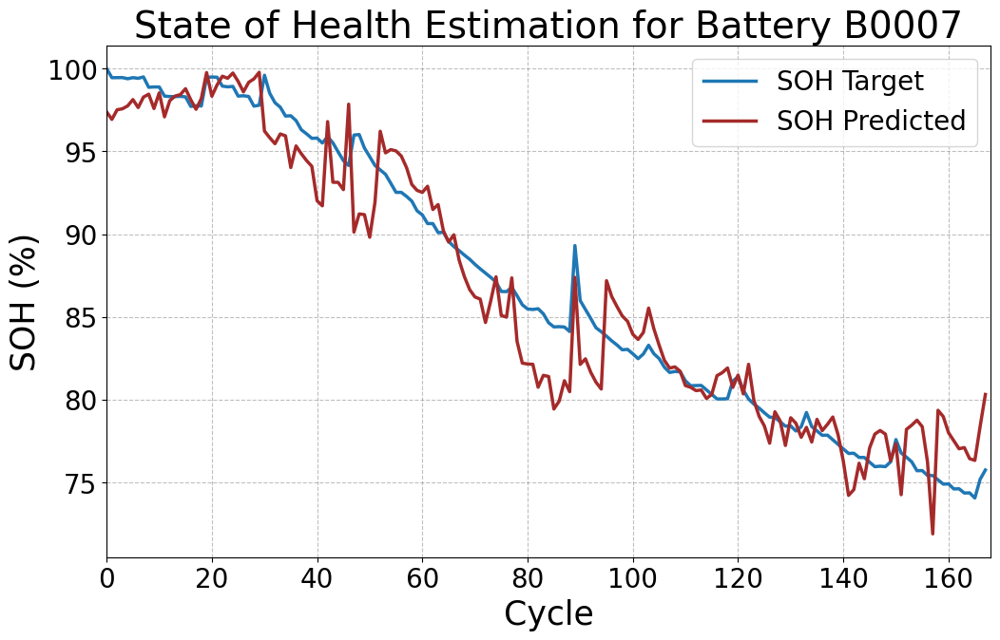

In [267]:
plot_soh(original_y_target_B0007_discharge_mm, original_y_testresult_B0007_discharge_mm, "State of Health Estimation for Battery B0007", file_name="B0007_discharge_mm")

Model 22 - B0007 - Standard Scaler - Discharging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.5394, Validation Loss: 0.2823
Validation Distance: 0.4353, Validation Accuracy: 4.0000, SNR: 1.2198
##Metrics##:
MAE : 0.2842102646827698
MSE : 0.15990480780601501
RMSE : 0.5515928864479065
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.1252, Validation Loss: 0.4640
Validation Distance: 0.6112, Validation Accuracy: 0.0000, SNR: 1.1774
##Metrics##:
MAE : 0.4236002564430237
MSE : 0.3035295009613037
RMSE : 0.657505214214325
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0707, Validation Loss: 0.1698
Validation Distance: 0.3611, Validation Accuracy: 4.0000, SNR: 4.2065
##Metrics##:
MAE : 0.24317270517349243
MSE : 0.10250550508499146
RMSE : 0.4969058036804199
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0490, Validation Loss: 0.4192
Validation Distance: 0.6015, Validation Accuracy: 0.0000, SNR: 1.4202
##Metrics##:
MAE : 0.417569637298584
MSE : 0.27153295278549194
RMSE : 0.6475622057914734
R-squared : -inf
Count: 34
Epoch 5/120, T

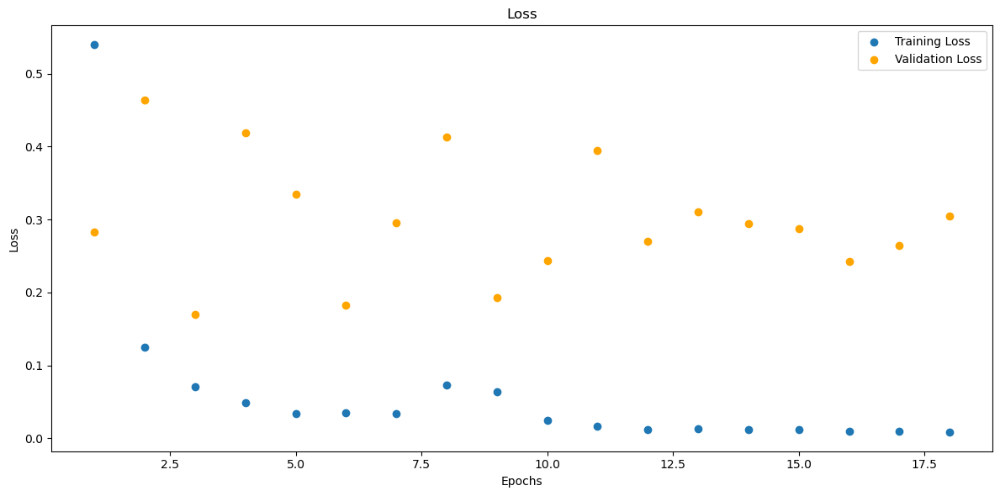

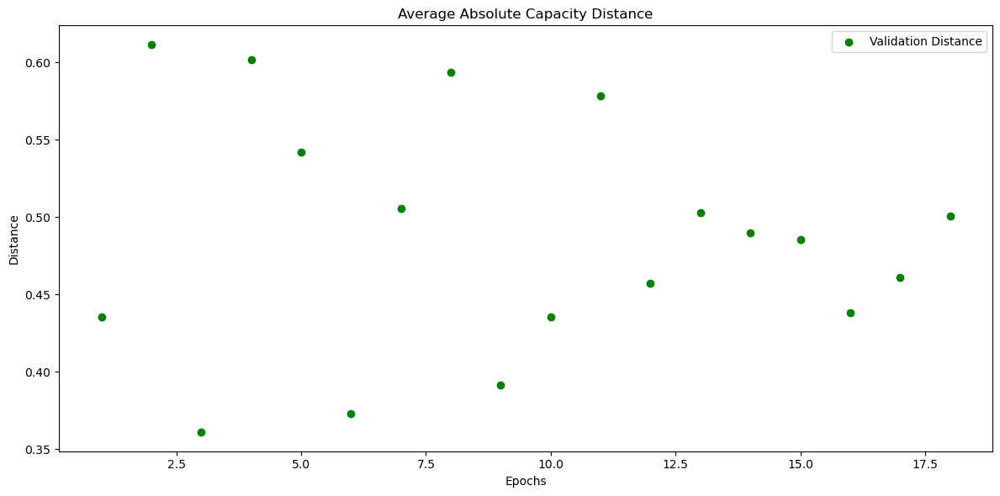

In [268]:
# B0007_discharge_std
model_B0007_discharge_std = CustomCNN(input_shape=input_shape_single)
model_B0007_discharge_std, train_losses_B0007_discharge_std, val_losses_B0007_discharge_std, val_distances_B0007_discharge_std, metrics_history_B0007_discharge_std = train(data_loaders['B0007_discharge_std_val_loader'], data_loaders['B0007_discharge_std_train_loader'], model_B0007_discharge_std)
torch.save(model_B0007_discharge_std, os.path.join(folder_name, 'model_B0007_discharge_std.pth'))

Test Loss: 2.0604
Test Loss: 2.0604, Test Distance: 0.9925, Test Accuracy: 0.0000, SNR: 2.3500
##Metrics##:
MAE : 0.9959937334060669
MSE : 1.0361530780792236
RMSE : 1.0026140213012695
R-squared : -3055.12060546875
Count: 26


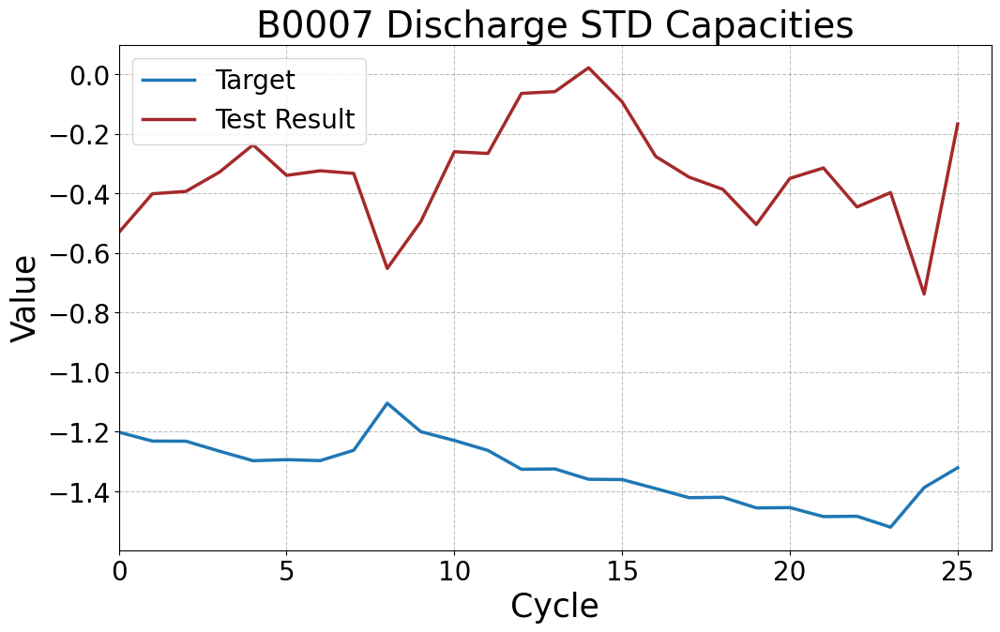

In [269]:
# B0007_discharge_std
model_B0007_discharge_std = torch.load('4. CNN Models/model_B0007_discharge_std.pth')
y_target_B0007_discharge_std, y_testresult_B0007_discharge_std = test(model_B0007_discharge_std, data_loaders['B0007_discharge_std_test_loader'])
y_target_B0007_discharge_std = flatten_and_concatenate(y_target_B0007_discharge_std)
y_testresult_B0007_discharge_std = flatten_and_concatenate(y_testresult_B0007_discharge_std)
plot_tensors(y_target_B0007_discharge_std, y_testresult_B0007_discharge_std, labels=["Target", "Test Result"], title="B0007 Discharge STD Capacities")


Test on Complete Dataset.

Test Loss: 0.4465
Test Loss: 0.4465, Test Distance: 0.3391, Test Accuracy: 2.9762, SNR: 6.5125
##Metrics##:
MAE : 0.33909326791763306
MSE : 0.22322781383991241
RMSE : 0.5942436456680298
R-squared : -889.5888061523438
Count: 168


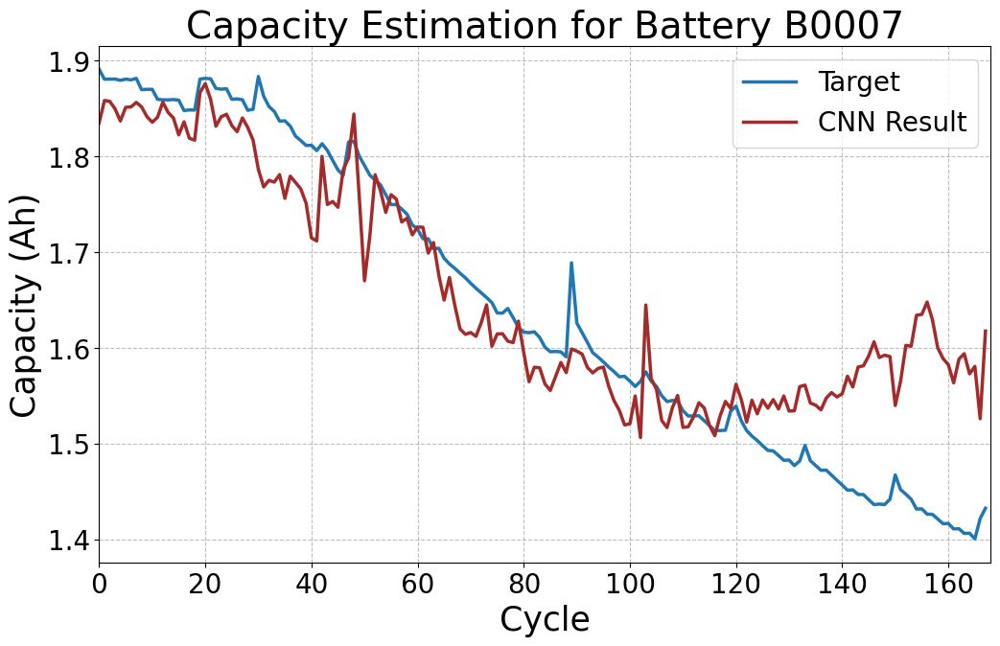

In [270]:
# Run the test on the model
y_target_B0007_discharge_std, y_testresult_B0007_discharge_std = test(model_B0007_discharge_std, data_loaders['B0007_discharge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_discharge_std = flatten_and_concatenate(y_target_B0007_discharge_std)
y_testresult_B0007_discharge_std = flatten_and_concatenate(y_testresult_B0007_discharge_std)

# Assuming scaler_y_discharge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_discharge_std = scaler_y_dis_std_B0007.inverse_transform(y_target_B0007_discharge_std.numpy().reshape(-1, 1))
original_y_testresult_B0007_discharge_std = scaler_y_dis_std_B0007.inverse_transform(y_testresult_B0007_discharge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_discharge_std = torch.tensor(original_y_target_B0007_discharge_std)
original_y_testresult_B0007_discharge_std = torch.tensor(original_y_testresult_B0007_discharge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_discharge_std, original_y_testresult_B0007_discharge_std, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_discharge_std", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")

SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


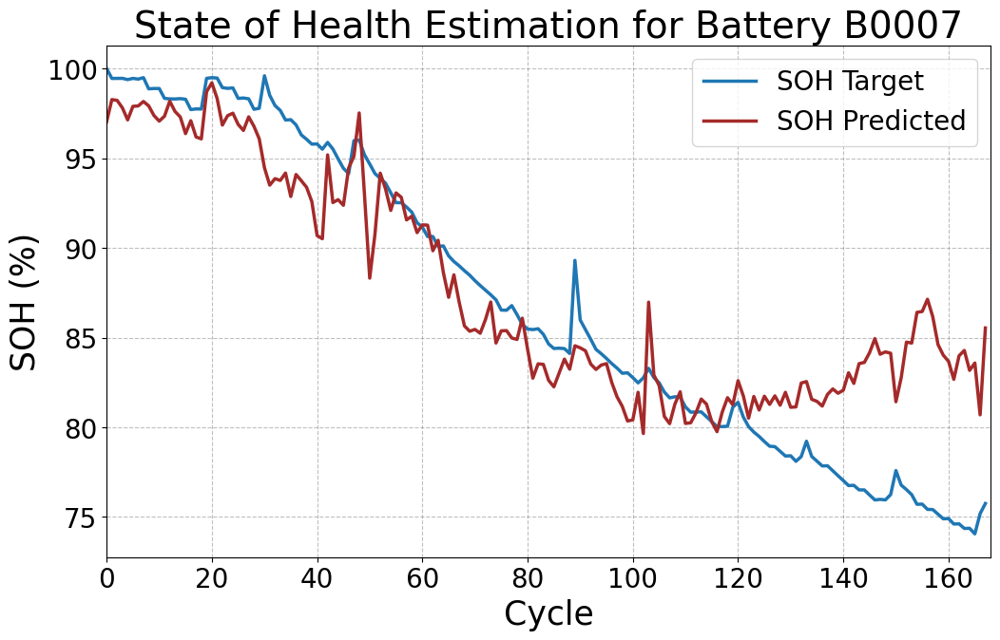

In [271]:
plot_soh(original_y_target_B0007_discharge_std, original_y_testresult_B0007_discharge_std, "State of Health Estimation for Battery B0007", file_name="B0007_discharge_std")

Model 23 - B0007 - Robust Scaler - Discharging Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.4577, Validation Loss: 0.3699
Validation Distance: 0.4705, Validation Accuracy: 4.0000, SNR: 4.5419
##Metrics##:
MAE : 0.35535144805908203
MSE : 0.2880244851112366
RMSE : 0.6249330043792725
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0597, Validation Loss: 0.1112
Validation Distance: 0.2737, Validation Accuracy: 0.0000, SNR: 1.1426
##Metrics##:
MAE : 0.1902925670146942
MSE : 0.07584468275308609
RMSE : 0.4712234139442444
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0283, Validation Loss: 0.1211
Validation Distance: 0.3002, Validation Accuracy: 0.0000, SNR: -0.1043
##Metrics##:
MAE : 0.20711717009544373
MSE : 0.07960594445466995
RMSE : 0.4766486883163452
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0261, Validation Loss: 0.1257
Validation Distance: 0.3200, Validation Accuracy: 4.0000, SNR: -0.0872
##Metrics##:
MAE : 0.2229028195142746
MSE : 0.08330820500850677
RMSE : 0.48556819558143616
R-squared : -inf
Count: 34
Epoch 5/

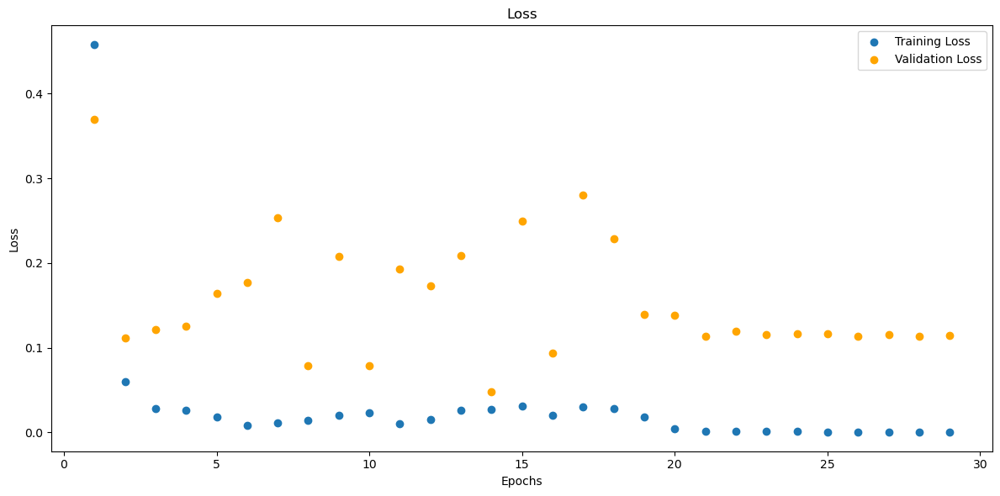

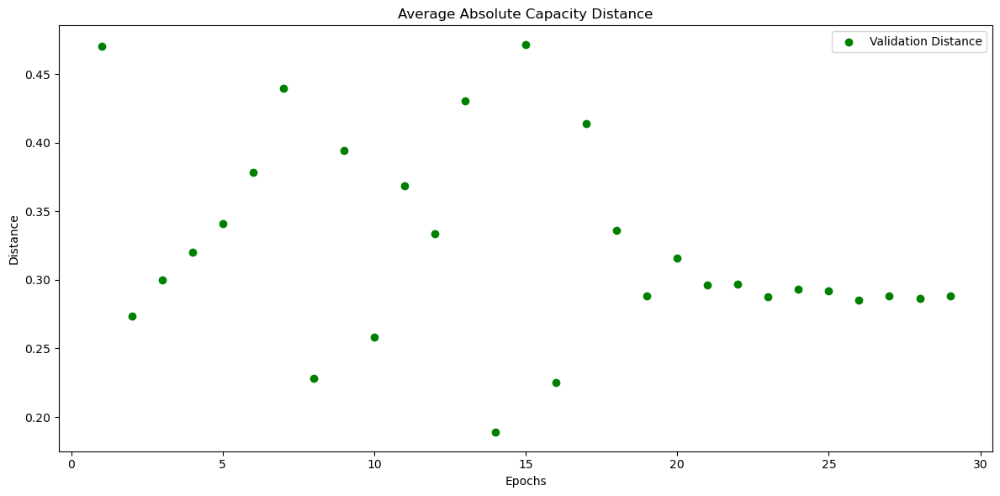

In [272]:
# B0007_discharge_rob
model_B0007_discharge_rob = CustomCNN(input_shape=input_shape_single)
model_B0007_discharge_rob, train_losses_B0007_discharge_rob, val_losses_B0007_discharge_rob, val_distances_B0007_discharge_rob, metrics_history_B0007_discharge_rob = train(data_loaders['B0007_discharge_rob_val_loader'], data_loaders['B0007_discharge_rob_train_loader'], model_B0007_discharge_rob)
torch.save(model_B0007_discharge_rob, os.path.join(folder_name, 'model_B0007_discharge_rob.pth'))

Test Loss: 0.4793
Test Loss: 0.4793, Test Distance: 0.4753, Test Accuracy: 0.0000, SNR: 1.6822
##Metrics##:
MAE : 0.4733068645000458
MSE : 0.2380182147026062
RMSE : 0.693784236907959
R-squared : -2643.668212890625
Count: 26


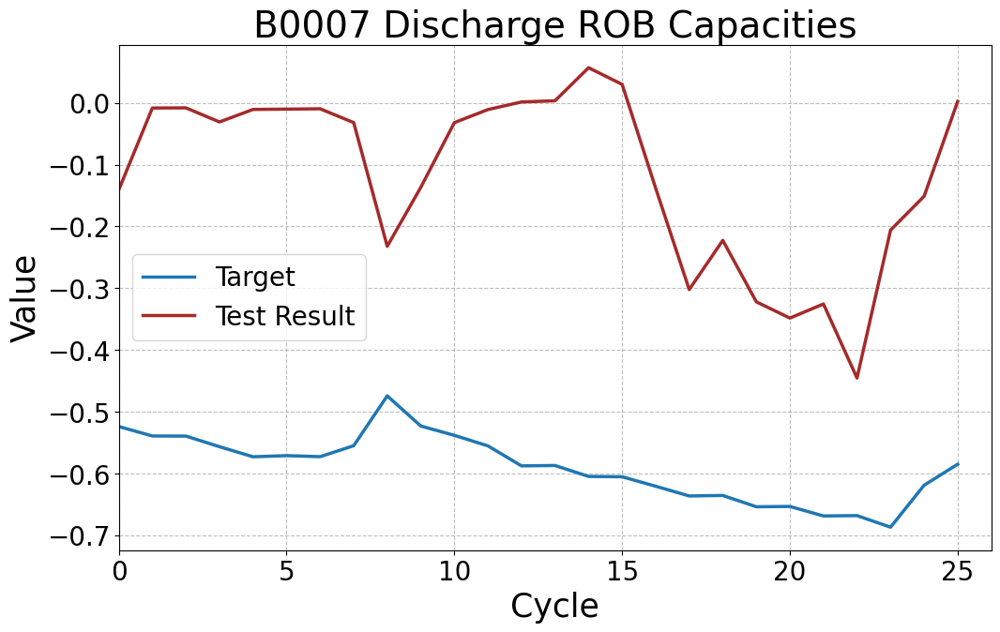

In [273]:
# B0007_discharge_rob
model_B0007_discharge_rob = torch.load('4. CNN Models/model_B0007_discharge_rob.pth')
y_target_B0007_discharge_rob, y_testresult_B0007_discharge_rob = test(model_B0007_discharge_rob, data_loaders['B0007_discharge_rob_test_loader'])
y_target_B0007_discharge_rob = flatten_and_concatenate(y_target_B0007_discharge_rob)
y_testresult_B0007_discharge_rob = flatten_and_concatenate(y_testresult_B0007_discharge_rob)
plot_tensors(y_target_B0007_discharge_rob, y_testresult_B0007_discharge_rob, labels=["Target", "Test Result"], title="B0007 Discharge ROB Capacities")


Test on complete dataset.

In [274]:
# Run the test on the model
y_target_B0007_discharge_rob, y_testresult_B0007_discharge_rob = test(model_B0007_discharge_rob, data_loaders['B0007_discharge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_discharge_rob = flatten_and_concatenate(y_target_B0007_discharge_rob)
y_testresult_B0007_discharge_rob = flatten_and_concatenate(y_testresult_B0007_discharge_rob)

# # Assuming scaler_y_discharge_B0007 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0007_discharge_rob = scaler_y_dis_rob_B0007.inverse_transform(y_target_B0007_discharge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0007_discharge_rob = scaler_y_dis_rob_B0007.inverse_transform(y_testresult_B0007_discharge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0007_discharge_rob = torch.tensor(original_y_target_B0007_discharge_rob)
# original_y_testresult_B0007_discharge_rob = torch.tensor(original_y_testresult_B0007_discharge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0007_discharge_rob, original_y_testresult_B0007_discharge_rob, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_discharge_rob", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


Test Loss: 0.1120
Test Loss: 0.1120, Test Distance: 0.1766, Test Accuracy: 4.1667, SNR: 6.8220
##Metrics##:
MAE : 0.17663836479187012
MSE : 0.05599871650338173
RMSE : 0.4316180348396301
R-squared : -2308.209716796875
Count: 168


SOH Plot.

In [275]:
# plot_soh(original_y_target_B0007_discharge_rob, original_y_testresult_B0007_discharge_rob, "State of Health Estimation for Battery B0007", file_name="B0007_discharge_rob")

Model 24 - B0007 - MinMax Scaler - Combined Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.2025, Validation Loss: 0.0171
Validation Distance: 0.1102, Validation Accuracy: 4.0000, SNR: 0.3742
##Metrics##:
MAE : 0.08170169591903687
MSE : 0.013034668751060963
RMSE : 0.3028370141983032
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.0177, Validation Loss: 0.0238
Validation Distance: 0.1405, Validation Accuracy: 0.0000, SNR: -3.8943
##Metrics##:
MAE : 0.10200051963329315
MSE : 0.017381463199853897
RMSE : 0.32337698340415955
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0068, Validation Loss: 0.0159
Validation Distance: 0.1125, Validation Accuracy: 0.0000, SNR: -1.4585
##Metrics##:
MAE : 0.08214162290096283
MSE : 0.01177096739411354
RMSE : 0.2901192903518677
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0090, Validation Loss: 0.0446
Validation Distance: 0.1903, Validation Accuracy: 4.0000, SNR: -8.7519
##Metrics##:
MAE : 0.1344081163406372
MSE : 0.030705798417329788
RMSE : 0.370882511138916
R-squared : -inf
Count: 34
Epo

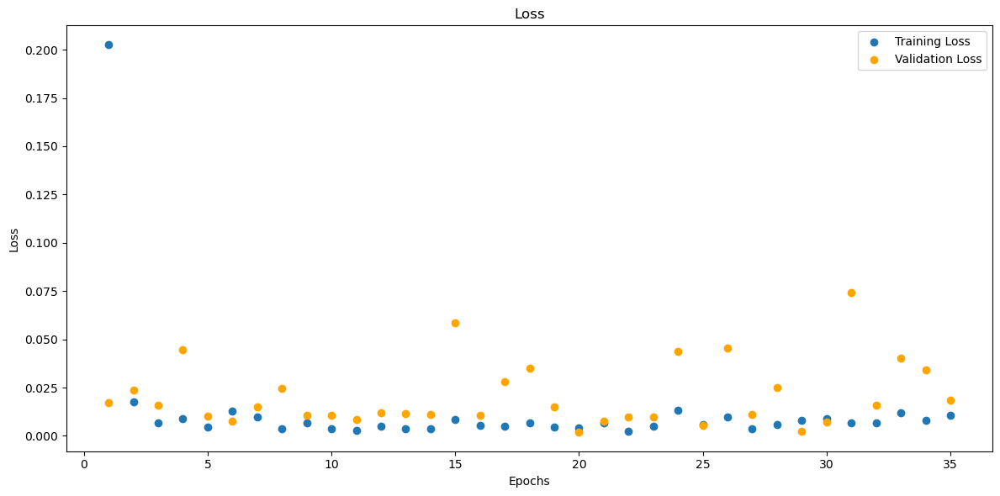

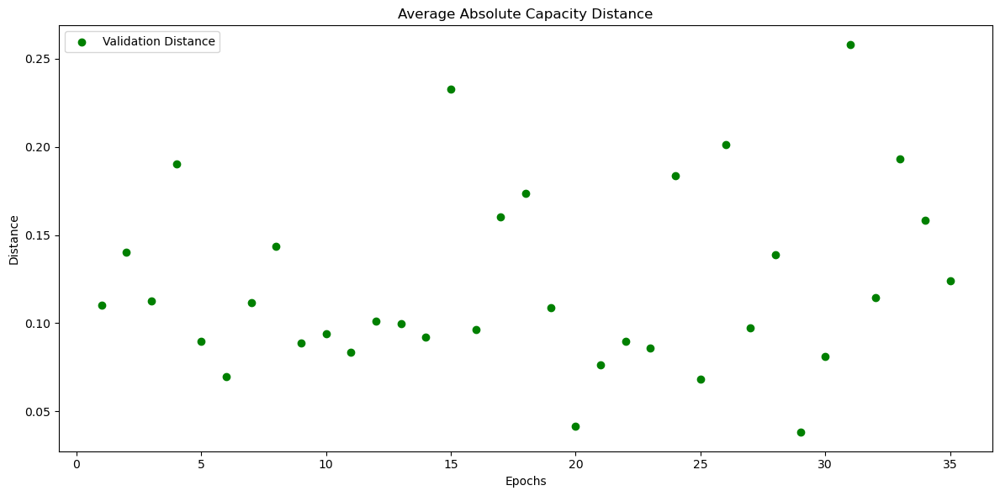

In [346]:
# B0007_combined_mm
model_B0007_combined_mm = CustomCNN(input_shape=input_shape_combined)
model_B0007_combined_mm, train_losses_B0007_combined_mm, val_losses_B0007_combined_mm, val_distances_B0007_combined_mm, metrics_history_B0007_combined_mm = train(data_loaders['B0007_combined_mm_val_loader'], data_loaders['B0007_combined_mm_train_loader'], model_B0007_combined_mm)
torch.save(model_B0007_combined_mm, os.path.join(folder_name, 'model_B0007_combined_mm.pth'))

Test Loss: 0.0385
Test Loss: 0.0385, Test Distance: 0.1083, Test Accuracy: 0.0000, SNR: -5.7859
##Metrics##:
MAE : 0.10615865886211395
MSE : 0.018870480358600616
RMSE : 0.33180302381515503
R-squared : -480.99737548828125
Count: 26


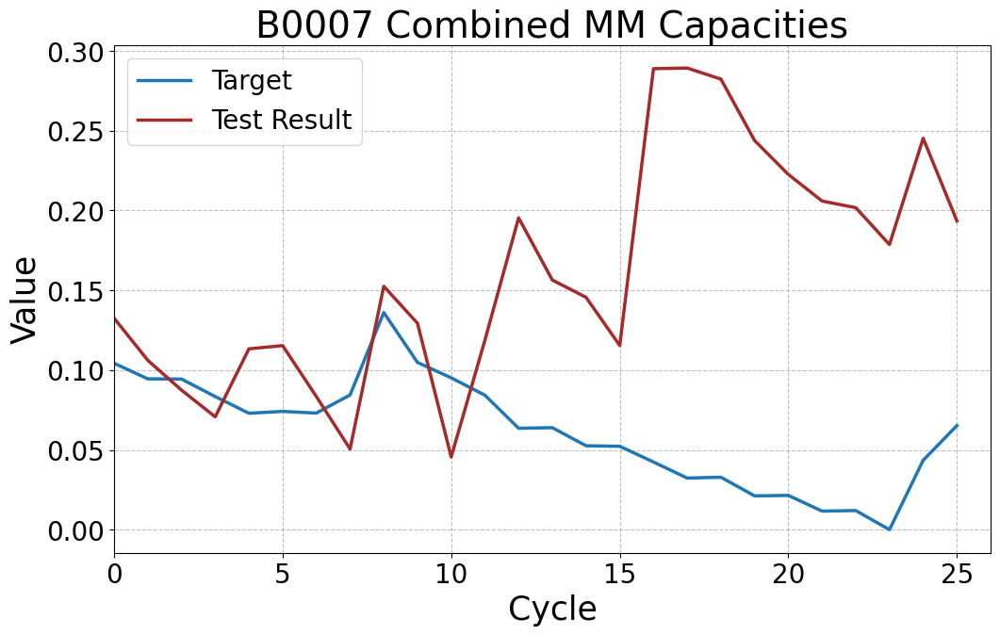

In [347]:
# B0007_combined_mm
model_B0007_combined_mm = torch.load('4. CNN Models/model_B0007_combined_mm.pth')
y_target_B0007_combined_mm, y_testresult_B0007_combined_mm = test(model_B0007_combined_mm, data_loaders['B0007_combined_mm_test_loader'])
y_target_B0007_combined_mm = flatten_and_concatenate(y_target_B0007_combined_mm)
y_testresult_B0007_combined_mm = flatten_and_concatenate(y_testresult_B0007_combined_mm)
plot_tensors(y_target_B0007_combined_mm, y_testresult_B0007_combined_mm, labels=["Target", "Test Result"], title="B0007 Combined MM Capacities")


Test on complete dataset.

Test Loss: 0.0116
Test Loss: 0.0116, Test Distance: 0.0566, Test Accuracy: 14.8810, SNR: 17.8737
##Metrics##:
MAE : 0.05661770701408386
MSE : 0.005780627951025963
RMSE : 0.24575060606002808
R-squared : -1160.3868408203125
Count: 168


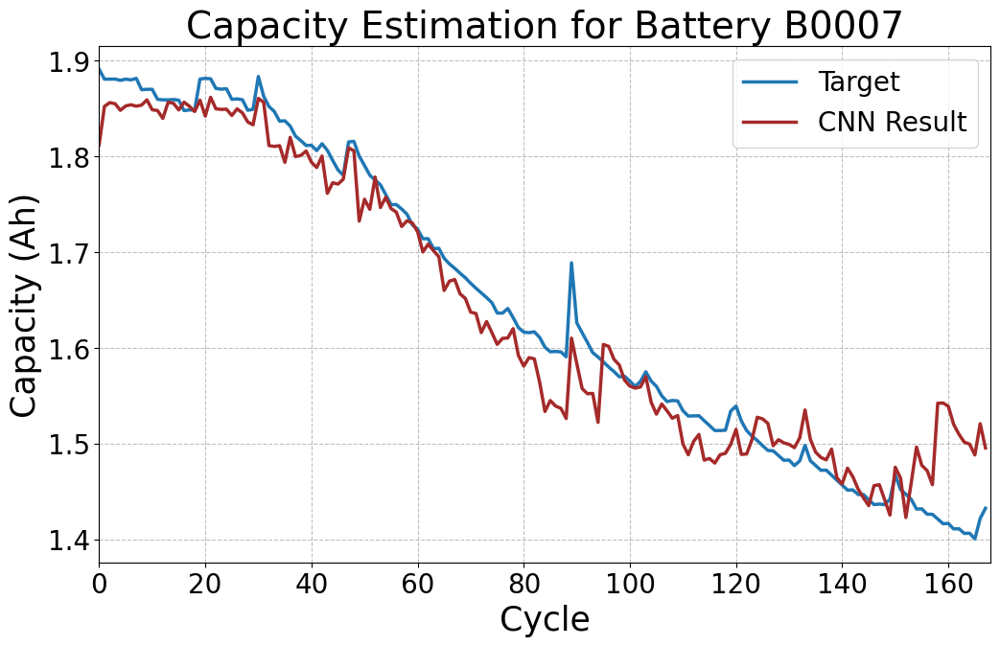

In [348]:
# Run the test on the model
y_target_B0007_combined_mm, y_testresult_B0007_combined_mm = test(model_B0007_combined_mm, data_loaders['B0007_combined_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_combined_mm = flatten_and_concatenate(y_target_B0007_combined_mm)
y_testresult_B0007_combined_mm = flatten_and_concatenate(y_testresult_B0007_combined_mm)

# Assuming scaler_y_combined_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_combined_mm = scaler_y_comb_mm_B0007.inverse_transform(y_target_B0007_combined_mm.numpy().reshape(-1, 1))
original_y_testresult_B0007_combined_mm = scaler_y_comb_mm_B0007.inverse_transform(y_testresult_B0007_combined_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_combined_mm = torch.tensor(original_y_target_B0007_combined_mm)
original_y_testresult_B0007_combined_mm = torch.tensor(original_y_testresult_B0007_combined_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_combined_mm, original_y_testresult_B0007_combined_mm, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_combined_mm", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")

SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


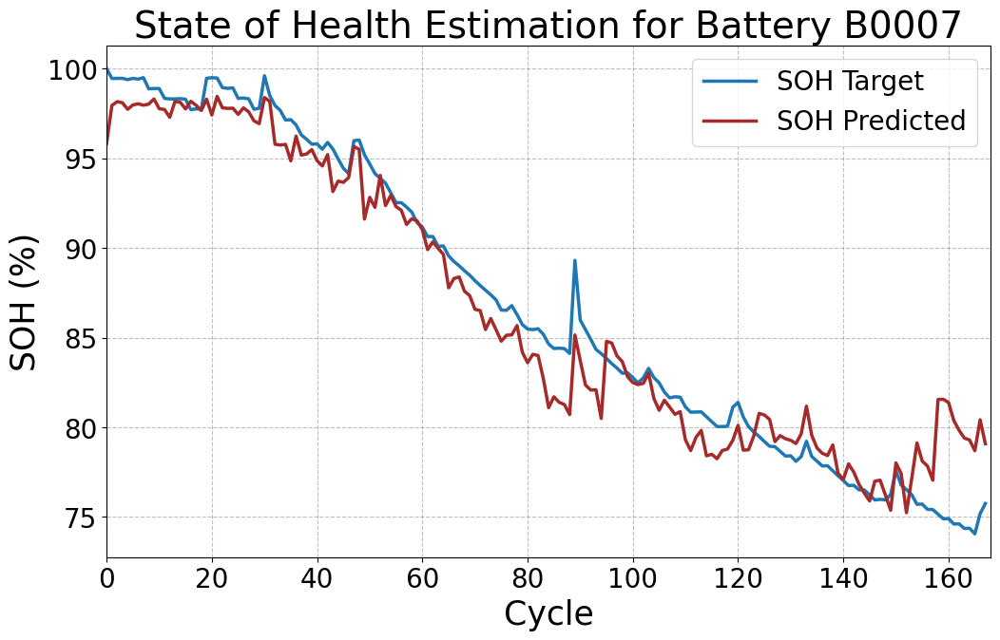

In [349]:
plot_soh(original_y_target_B0007_combined_mm, original_y_testresult_B0007_combined_mm, "State of Health Estimation for Battery B0007", file_name="B0007_combined_mm")

Model 25 - B0007 - Standard Scaler - Combined Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.7927, Validation Loss: 0.3090
Validation Distance: 0.5143, Validation Accuracy: 0.0000, SNR: 14.7084
##Metrics##:
MAE : 0.39540034532546997
MSE : 0.2425365149974823
RMSE : 0.6390368938446045
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.1199, Validation Loss: 0.2947
Validation Distance: 0.4850, Validation Accuracy: 4.0000, SNR: 5.1383
##Metrics##:
MAE : 0.34593844413757324
MSE : 0.20793402194976807
RMSE : 0.5983126759529114
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0449, Validation Loss: 0.2374
Validation Distance: 0.4616, Validation Accuracy: 0.0000, SNR: 5.5750
##Metrics##:
MAE : 0.32931020855903625
MSE : 0.16491134464740753
RMSE : 0.5778459906578064
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0666, Validation Loss: 0.1934
Validation Distance: 0.3926, Validation Accuracy: 0.0000, SNR: 5.9370
##Metrics##:
MAE : 0.2760157287120819
MSE : 0.13190872967243195
RMSE : 0.5304291844367981
R-squared : -inf
Count: 34
Epoch 5/1

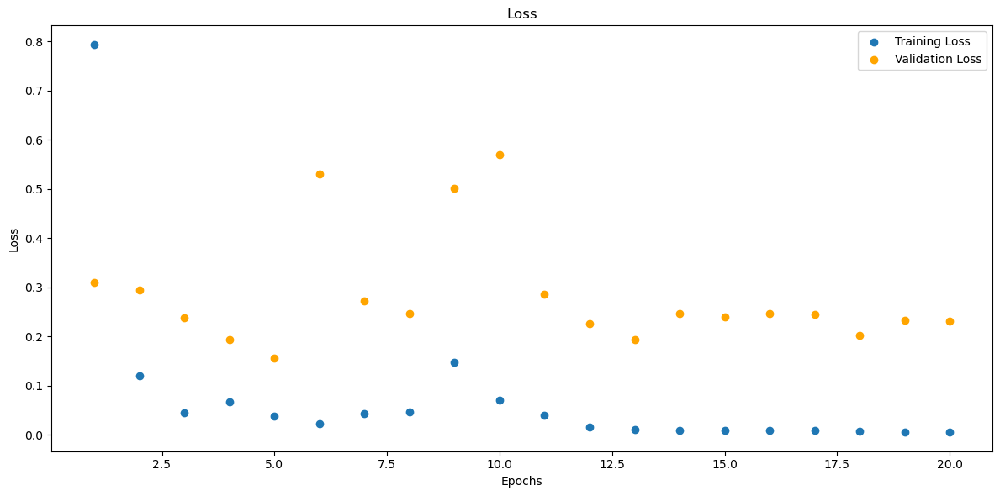

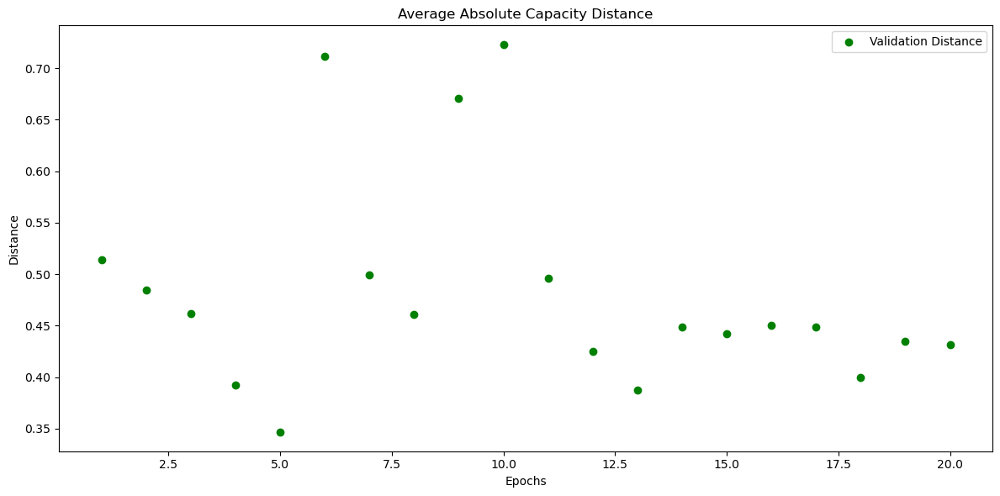

In [280]:
# B0007_combined_std
model_B0007_combined_std = CustomCNN(input_shape=input_shape_combined)
model_B0007_combined_std, train_losses_B0007_combined_std, val_losses_B0007_combined_std, val_distances_B0007_combined_std, metrics_history_B0007_combined_std = train(data_loaders['B0007_combined_std_val_loader'], data_loaders['B0007_combined_std_train_loader'], model_B0007_combined_std)
torch.save(model_B0007_combined_std, os.path.join(folder_name, 'model_B0007_combined_std.pth'))

Test Loss: 2.8119
Test Loss: 2.8119, Test Distance: 1.1522, Test Accuracy: 0.0000, SNR: 1.0378
##Metrics##:
MAE : 1.1492745876312256
MSE : 1.4016783237457275
RMSE : 1.0749740600585938
R-squared : -3977.24658203125
Count: 26


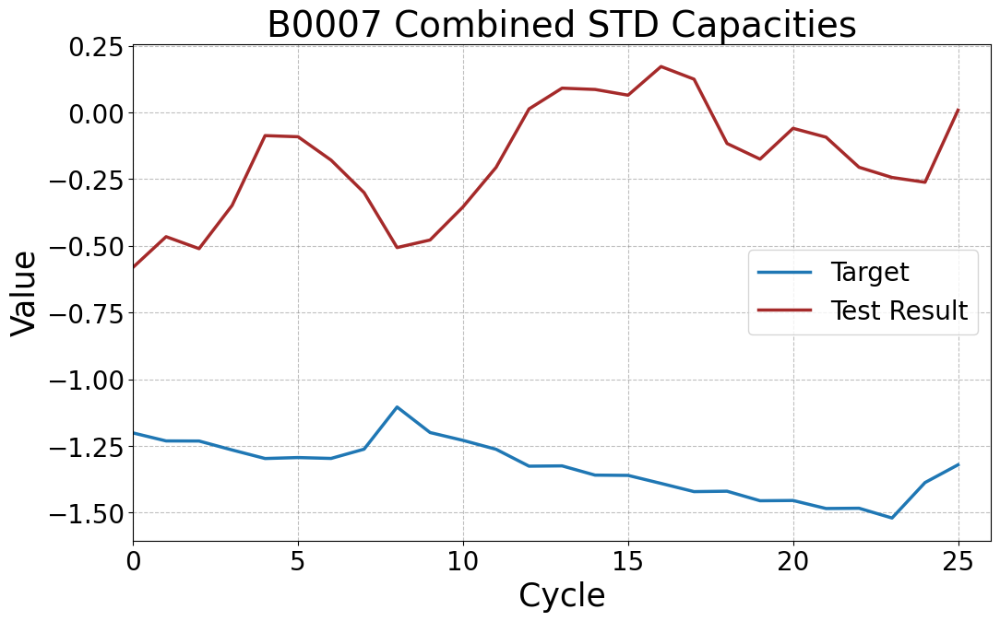

In [281]:
# B0007_combined_std
model_B0007_combined_std = torch.load('4. CNN Models/model_B0007_combined_std.pth')
y_target_B0007_combined_std, y_testresult_B0007_combined_std = test(model_B0007_combined_std, data_loaders['B0007_combined_std_test_loader'])
y_target_B0007_combined_std = flatten_and_concatenate(y_target_B0007_combined_std)
y_testresult_B0007_combined_std = flatten_and_concatenate(y_testresult_B0007_combined_std)
plot_tensors(y_target_B0007_combined_std, y_testresult_B0007_combined_std, labels=["Target", "Test Result"], title="B0007 Combined STD Capacities")


Test on complete dataset.

Test Loss: 0.5070
Test Loss: 0.5070, Test Distance: 0.3093, Test Accuracy: 8.3333, SNR: 5.9599
##Metrics##:
MAE : 0.30927130579948425
MSE : 0.25351643562316895
RMSE : 0.566540539264679
R-squared : -1024.779541015625
Count: 168


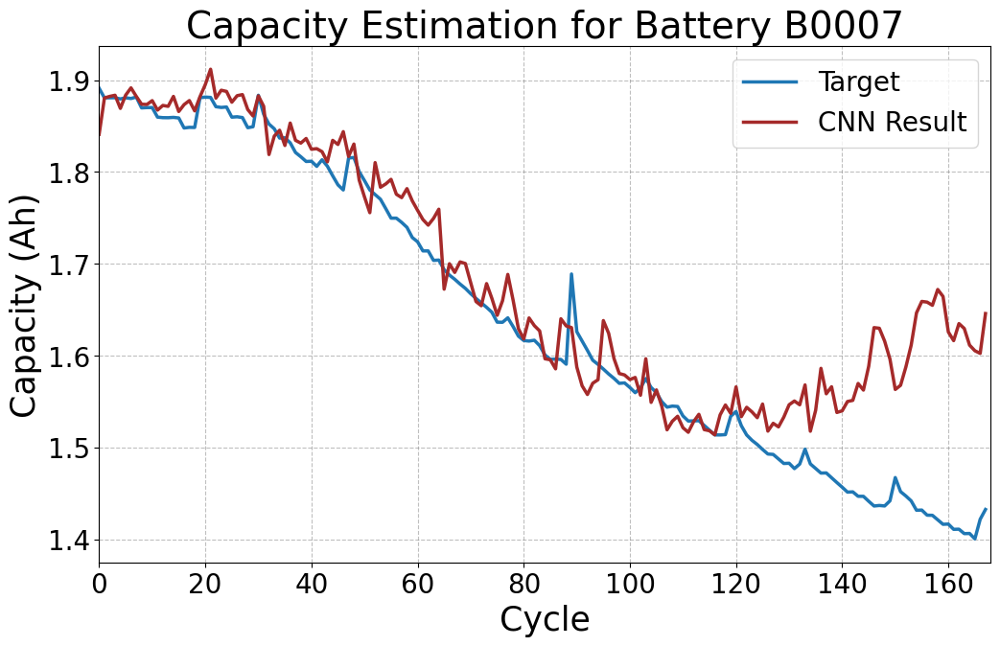

In [282]:
# Run the test on the model
y_target_B0007_combined_std, y_testresult_B0007_combined_std = test(model_B0007_combined_std, data_loaders['B0007_combined_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_combined_std = flatten_and_concatenate(y_target_B0007_combined_std)
y_testresult_B0007_combined_std = flatten_and_concatenate(y_testresult_B0007_combined_std)

# Assuming scaler_y_combined_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_combined_std = scaler_y_comb_std_B0007.inverse_transform(y_target_B0007_combined_std.numpy().reshape(-1, 1))
original_y_testresult_B0007_combined_std = scaler_y_comb_std_B0007.inverse_transform(y_testresult_B0007_combined_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_combined_std = torch.tensor(original_y_target_B0007_combined_std)
original_y_testresult_B0007_combined_std = torch.tensor(original_y_testresult_B0007_combined_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_combined_std, original_y_testresult_B0007_combined_std, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_combined_std", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_2832\916412395.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


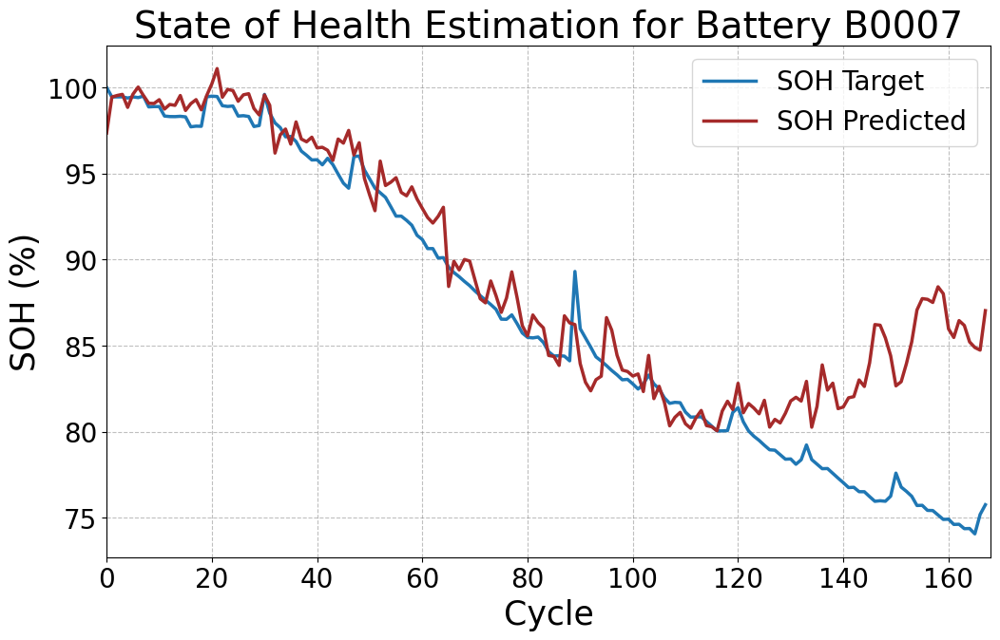

In [283]:
plot_soh(original_y_target_B0007_combined_std, original_y_testresult_B0007_combined_std, "State of Health Estimation for Battery B0007", file_name="B0007_combined_std")

Model 26 - B0007 - Robust Scaler - Combined Data

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.3930, Validation Loss: 0.2287
Validation Distance: 0.3910, Validation Accuracy: 0.0000, SNR: 1.6228
##Metrics##:
MAE : 0.28492236137390137
MSE : 0.17050296068191528
RMSE : 0.5440789461135864
R-squared : -inf
Count: 34
Epoch 2/120, Training Loss: 0.2201, Validation Loss: 0.2297
Validation Distance: 0.4081, Validation Accuracy: 0.0000, SNR: 14.7081
##Metrics##:
MAE : 0.31838157773017883
MSE : 0.18186187744140625
RMSE : 0.5828208923339844
R-squared : -inf
Count: 34
Epoch 3/120, Training Loss: 0.0789, Validation Loss: 0.1346
Validation Distance: 0.2953, Validation Accuracy: 4.0000, SNR: 0.5186
##Metrics##:
MAE : 0.20538543164730072
MSE : 0.09247788786888123
RMSE : 0.4625278115272522
R-squared : -inf
Count: 34
Epoch 4/120, Training Loss: 0.0173, Validation Loss: 0.0491
Validation Distance: 0.1835, Validation Accuracy: 4.0000, SNR: 3.9072
##Metrics##:
MAE : 0.126059889793396
MSE : 0.032400280237197876
RMSE : 0.3634783923625946
R-squared : -inf
Count: 34
Epoch 5/

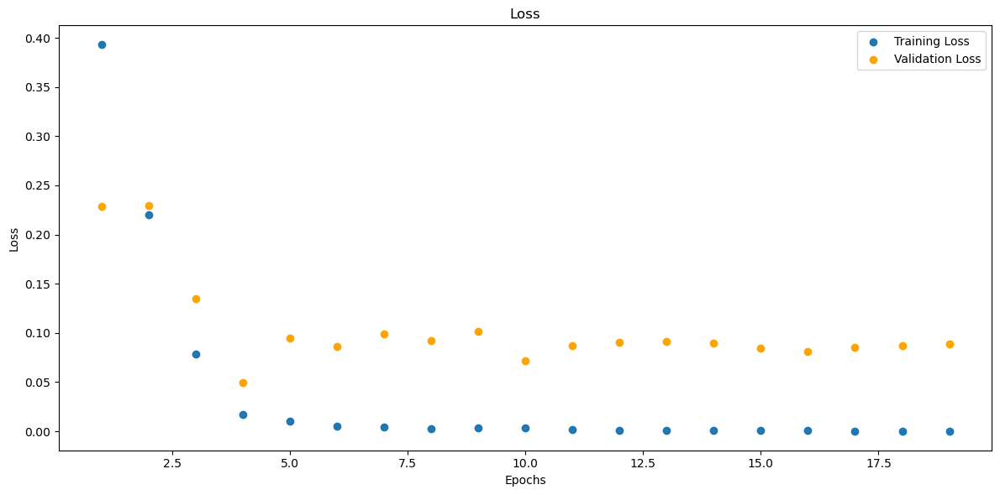

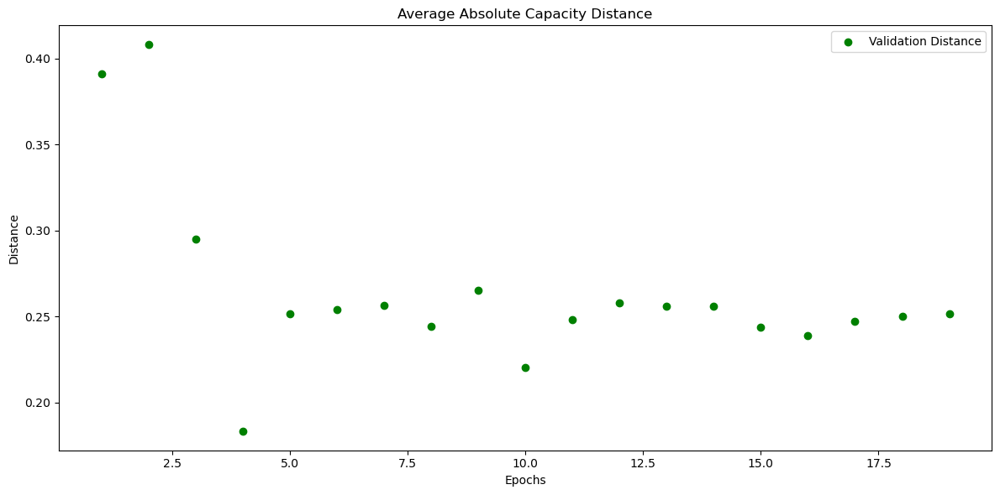

In [284]:
# B0007_combined_rob
model_B0007_combined_rob = CustomCNN(input_shape=input_shape_combined)
model_B0007_combined_rob, train_losses_B0007_combined_rob, val_losses_B0007_combined_rob, val_distances_B0007_combined_rob, metrics_history_B0007_combined_rob = train(data_loaders['B0007_combined_rob_val_loader'], data_loaders['B0007_combined_rob_train_loader'], model_B0007_combined_rob)
torch.save(model_B0007_combined_rob, os.path.join(folder_name, 'model_B0007_combined_rob.pth'))

Test Loss: 0.6815
Test Loss: 0.6815, Test Distance: 0.5677, Test Accuracy: 0.0000, SNR: 0.1041
##Metrics##:
MAE : 0.5688318014144897
MSE : 0.34230920672416687
RMSE : 0.7599138021469116
R-squared : -3692.26806640625
Count: 26


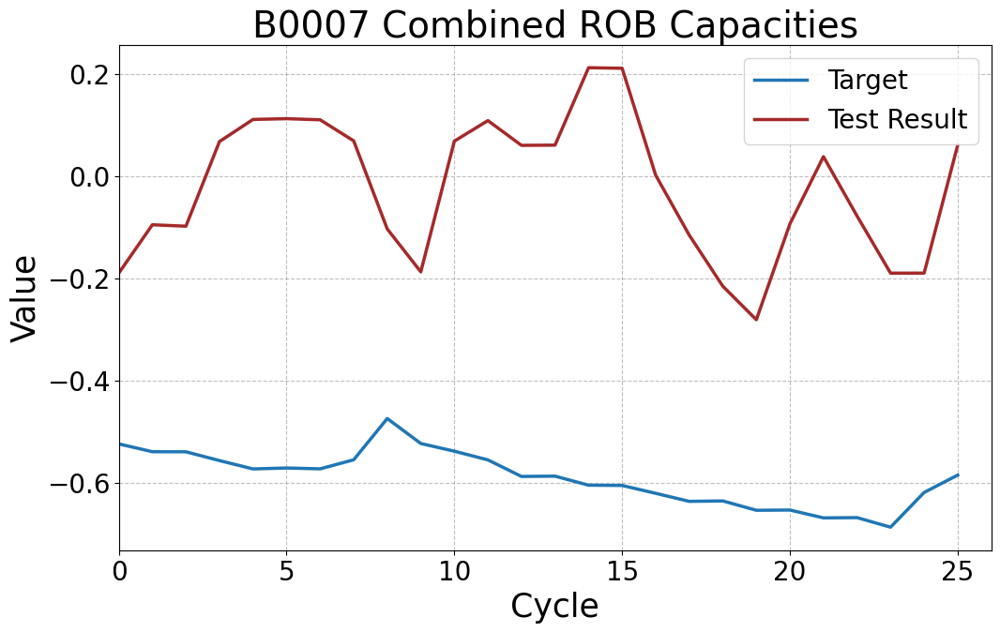

In [285]:
# B0007_combined_rob
model_B0007_combined_rob = torch.load('4. CNN Models/model_B0007_combined_rob.pth')
y_target_B0007_combined_rob, y_testresult_B0007_combined_rob = test(model_B0007_combined_rob, data_loaders['B0007_combined_rob_test_loader'])
y_target_B0007_combined_rob = flatten_and_concatenate(y_target_B0007_combined_rob)
y_testresult_B0007_combined_rob = flatten_and_concatenate(y_testresult_B0007_combined_rob)
plot_tensors(y_target_B0007_combined_rob, y_testresult_B0007_combined_rob, labels=["Target", "Test Result"], title="B0007 Combined ROB Capacities")


Test on complete dataset.

In [286]:
# Run the test on the model
y_target_B0007_combined_rob, y_testresult_B0007_combined_rob = test(model_B0007_combined_rob, data_loaders['B0007_combined_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_combined_rob = flatten_and_concatenate(y_target_B0007_combined_rob)
y_testresult_B0007_combined_rob = flatten_and_concatenate(y_testresult_B0007_combined_rob)

# # Assuming scaler_y_combined_B0007 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0007_combined_rob = scaler_y_comb_rob_B0007.inverse_transform(y_target_B0007_combined_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0007_combined_rob = scaler_y_comb_rob_B0007.inverse_transform(y_testresult_B0007_combined_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0007_combined_rob = torch.tensor(original_y_target_B0007_combined_rob)
# original_y_testresult_B0007_combined_rob = torch.tensor(original_y_testresult_B0007_combined_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0007_combined_rob, original_y_testresult_B0007_combined_rob, labels=["Target", "CNN Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_combined_rob", ylabel="Capacity (Ah)", save_dir="9. CNN Capacity Plots")


Test Loss: 0.1650
Test Loss: 0.1650, Test Distance: 0.2284, Test Accuracy: 1.1905, SNR: 5.1381
##Metrics##:
MAE : 0.2283773422241211
MSE : 0.08252020180225372
RMSE : 0.4860539734363556
R-squared : -5188.1650390625
Count: 168


SOH Plot.

In [287]:
# plot_soh(original_y_target_B0007_combined_rob, original_y_testresult_B0007_combined_rob, "State of Health Estimation for Battery B0007", file_name="B0007_combined_rob")

SAVE SOH DATA

In [350]:
# Ensure the arrays are 1-dimensional
b0005_target = original_y_target_B0005_combined_mm.flatten()
b0006_target = original_y_target_B0006_combined_mm.flatten()
b0007_target = original_y_target_B0007_combined_mm.flatten()

b0005_predicted_cnn = original_y_testresult_B0005_combined_mm.flatten()
b0006_predicted_cnn = original_y_testresult_B0006_combined_mm.flatten()
b0007_predicted_cnn = original_y_testresult_B0007_combined_mm.flatten()

# Calculate SOH
b0005_C = b0005_target[0]  # max capacity
b0006_C = b0006_target[0]  # max capacity
b0007_C = b0007_target[0]  # max capacity

b0005_soh_target = (b0005_target / b0005_C) * 100
b0006_soh_target = (b0006_target / b0006_C) * 100
b0007_soh_target = (b0007_target / b0007_C) * 100


b0005_soh_predicted_cnn = (b0005_predicted_cnn / b0005_C) * 100
b0006_soh_predicted_cnn = (b0006_predicted_cnn / b0006_C) * 100
b0007_soh_predicted_cnn = (b0007_predicted_cnn / b0007_C) * 100

save_dir = "15. Results"

# Create the directory if it doesn't exist
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Save the tensors to the specified directory
torch.save(b0005_soh_target, os.path.join(save_dir, 'b0005_soh_target.pt'))
torch.save(b0006_soh_target, os.path.join(save_dir, 'b0006_soh_target.pt'))
torch.save(b0007_soh_target, os.path.join(save_dir, 'b0007_soh_target.pt'))

torch.save(b0005_soh_predicted_cnn, os.path.join(save_dir, 'b0005_soh_predicted_cnn.pt'))
torch.save(b0006_soh_predicted_cnn, os.path.join(save_dir, 'b0006_soh_predicted_cnn.pt'))
torch.save(b0007_soh_predicted_cnn, os.path.join(save_dir, 'b0007_soh_predicted_cnn.pt'))
